# Trabalho Final EEL350 - Sistemas Lineares I

### Aluno: João Vitor dos Santos Oliveira
### Professor: Natanael Moura Junior

## Importação das Bibliotecas

In [2]:
import numpy as np
from scipy import signal
from scipy.fft import fft, fftfreq
import matplotlib.pyplot as plt

## Questão 1

### Circuito 1

Com base no desenvolvimento presente no PDF do Trabalho Escrito, a função de transferência é: $H(s) = \frac{V_{\text{out}}(s)}{V_{\text{in}}(s)} =
\frac{\dfrac{s}{C_1 R_1}}{s^2 + \dfrac{R_1 + R_2}{C_1 R_1 R_2} s + \dfrac{1}{L_1 C_1}}$

<br>

Com os valores: $R_1 = R_2 = 10 \Omega, C_1 = 100\,\mu\text{F}, L_1 = 1\,\text{H}$, temos: $H(s) = \frac{1000\,s}{s^2 + 2000\,s +10^4}$


#### Letra G - Diagrama de Pólos e Zeros

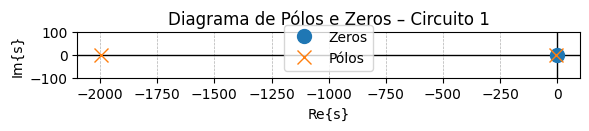

In [ ]:
# zeros e pólos
zeros = [0]
poles = [-5.01, -1994.99]

fig, ax = plt.subplots(figsize=(6, 4))

# eixos Re{s} e Im{s}
ax.axhline(0, color='black', linewidth=1)
ax.axvline(0, color='black', linewidth=1)

# plotagem
ax.plot(zeros, [0]*len(zeros), 'o', markersize=10, label='Zeros')
ax.plot(poles, [0]*len(poles), 'x', markersize=10, label='Pólos')

# ajustes de gráfico
ax.set_title('Diagrama de Pólos e Zeros – Circuito 1')
ax.set_xlabel('Re{s}')
ax.set_ylabel('Im{s}')
ax.set_xlim(-2100, 100)
ax.set_ylim(-100, 100)
ax.set_aspect('equal')
ax.grid(True, linestyle='--', linewidth=0.5)
ax.legend()

plt.tight_layout()
plt.show()

####Letra H - Diagrama de Bode

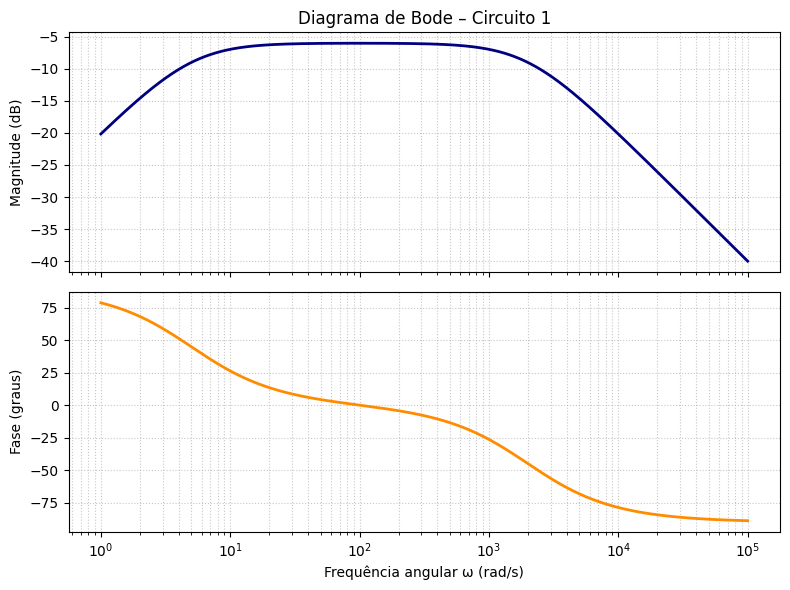

In [ ]:
# === Parâmetros do circuito ===
R1 = 10.0          # Ω
R2 = 10.0          # Ω
C1 = 100e-6        # 100 µF
L1 = 1.0           # 1 H

# === Função de transferência H(s) ===
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]           # k·s
den = [1, b, c]        # s² + b·s + c
sys = signal.TransferFunction(num, den)

# === Bode: frequência, magnitude (dB) e fase (graus) ===
w = np.logspace(0, 5, 1000)          # 1 rad/s → 100 krad/s
w, mag, phase = signal.bode(sys, w=w)

# === Plot conjunto (magnitude + fase) ===
fig, (ax_mag, ax_phase) = plt.subplots(
    2, 1, figsize=(8, 6), sharex=True
)

ax_mag.semilogx(w, mag, color='navy', linewidth=2)
ax_mag.set_ylabel('Magnitude (dB)')
ax_mag.set_title('Diagrama de Bode – Circuito 1')
ax_mag.grid(True, which='both', linestyle=':', alpha=0.7)

ax_phase.semilogx(w, phase, color='darkorange', linewidth=2)
ax_phase.set_xlabel('Frequência angular ω (rad/s)')
ax_phase.set_ylabel('Fase (graus)')
ax_phase.grid(True, which='both', linestyle=':', alpha=0.7)

plt.tight_layout()
plt.show()

#### Letra I - Resposta ao Degrau Unitário

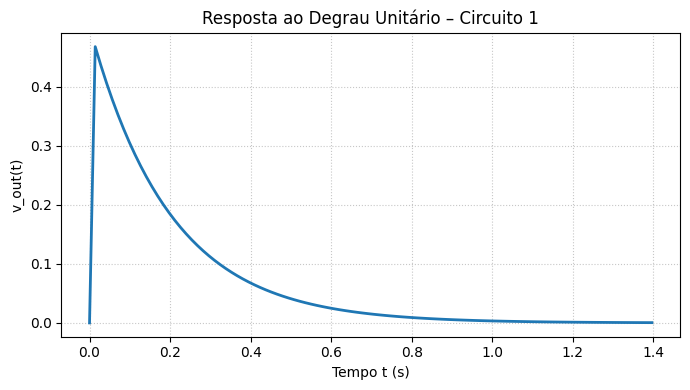

In [ ]:
# ----- parâmetros do circuito -----
R1 = 10.0          # Ω
R2 = 10.0          # Ω
C1 = 100e-6        # 100 µF
L1 = 1.0           # 1 H

# ----- função de transferência H(s) -----
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]        # k·s
den = [1, b, c]     # s² + b·s + c
sys = signal.TransferFunction(num, den)

# ----- resposta ao degrau -----
t, y = signal.step(sys)     # step de amplitude 1

# ----- plot -----
plt.figure(figsize=(7, 4))
plt.plot(t, y, linewidth=2)
plt.title('Resposta ao Degrau Unitário – Circuito 1')
plt.xlabel('Tempo t (s)')
plt.ylabel('v_out(t)')
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

#### Letra J - Resposta a Rampa Unitária

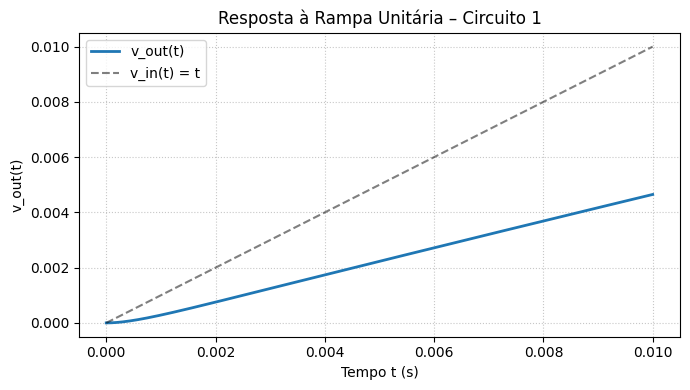

In [ ]:
# --- Parâmetros do circuito ---
R1 = 10.0        # Ω
R2 = 10.0        # Ω
C1 = 100e-6      # 100 µF
L1 = 1.0         # 1 H

# --- Função de transferência H(s) ---
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# --- Entrada: rampa unitária → V_in(s) = 1 / s^2
# Para simular, usamos resposta à entrada rampa (input = t)
t = np.linspace(0, 0.01, 1000)
u_rampa = t
t, y_rampa, _ = signal.lsim(sys, U=u_rampa, T=t)

# --- Plot ---
plt.figure(figsize=(7, 4))
plt.plot(t, y_rampa, linewidth=2, label='v_out(t)')
plt.plot(t, u_rampa, 'k--', alpha=0.5, label='v_in(t) = t')
plt.title('Resposta à Rampa Unitária – Circuito 1')
plt.xlabel('Tempo t (s)')
plt.ylabel('v_out(t)')
plt.legend()
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

#### Letra K - Resposta a uma Onda Quadrada de Frequência ω

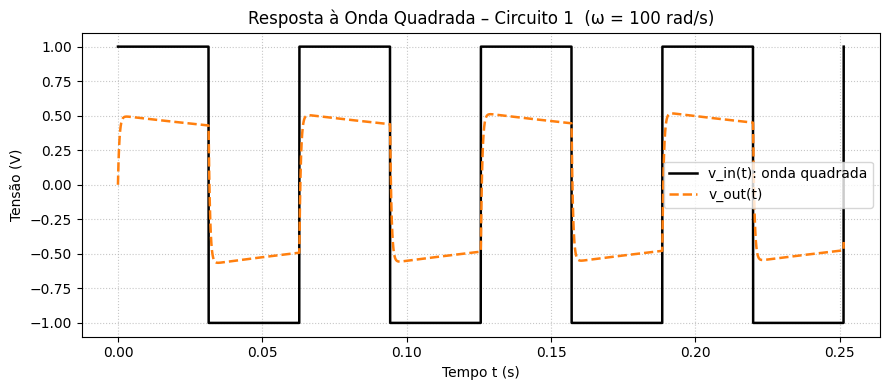

In [ ]:
# ---------- parâmetros do circuito ----------
R1 = 10.0       # Ω
R2 = 10.0       # Ω
C1 = 100e-6     # 100 µF
L1 = 1.0        # 1 H

# ---------- função de transferência ----------
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# ---------- onda quadrada de frequência "sábia" ----------
omega = 100            # rad/s
f = omega / (2 * np.pi)  # Hz
T = 1 / f               # período
t = np.linspace(0, 4*T, 4000)          # 4 períodos
v_in = signal.square(omega * t)        # amplitude ±1 V

# ---------- resposta do sistema ----------
t, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# ---------- plot ----------
plt.figure(figsize=(9, 4))
plt.plot(t, v_in, label='v_in(t): onda quadrada', lw=1.8, color='k')
plt.plot(t, v_out, '--', label='v_out(t)', lw=1.8, color='tab:orange')
plt.title('Resposta à Onda Quadrada – Circuito 1  (ω = 100 rad/s)')
plt.xlabel('Tempo t (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra L - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

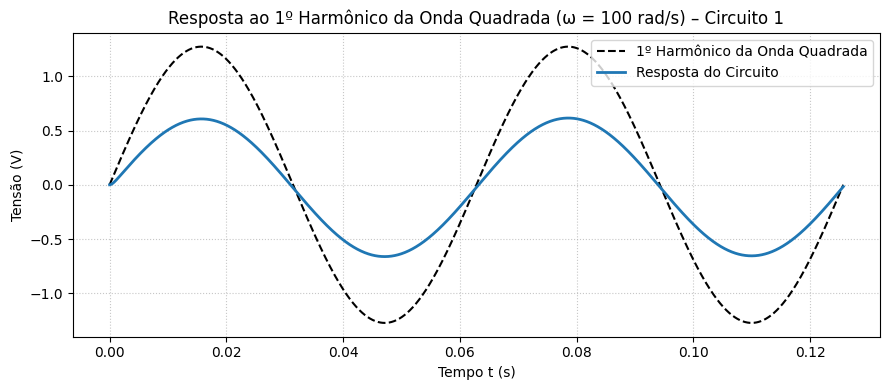

In [ ]:
# ----------- Parâmetros do circuito -----------
R1 = 10.0       # Ω
R2 = 10.0       # Ω
C1 = 100e-6     # 100 µF
L1 = 1.0        # 1 H

# ----------- Função de transferência H(s) -----------
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# ----------- Frequência do 1º harmônico -----------
omega = 100                   # rad/s
f = omega / (2 * np.pi)       # Hz
T = 1 / f
t = np.linspace(0, 2*T, 2000)

# ----------- Entrada: primeiro harmônico de onda quadrada -----------
A = 4 / np.pi
v_in = A * np.sin(omega * t)

# ----------- Resposta do sistema -----------
t, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# ----------- Plot -----------
plt.figure(figsize=(9, 4))
plt.plot(t, v_in, 'k--', linewidth=1.5, label='1º Harmônico da Onda Quadrada')
plt.plot(t, v_out, 'tab:blue', linewidth=2, label='Resposta do Circuito')
plt.title('Resposta ao 1º Harmônico da Onda Quadrada (ω = 100 rad/s) – Circuito 1')
plt.xlabel('Tempo t (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra M - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

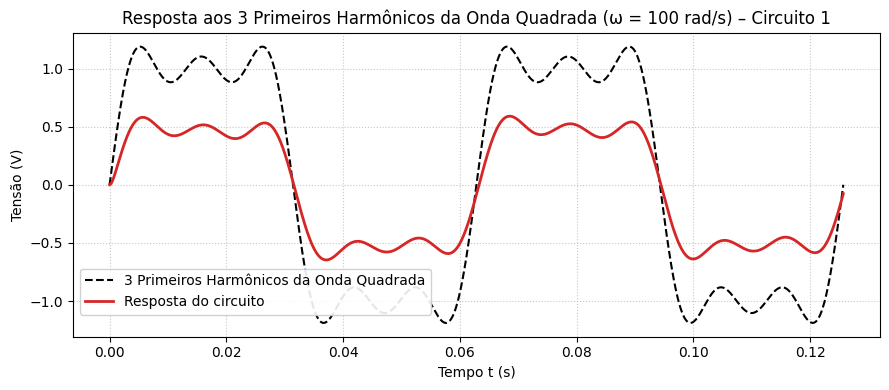

In [ ]:
# ----------- Parâmetros do circuito -----------
R1 = 10.0
R2 = 10.0
C1 = 100e-6
L1 = 1.0

# ----------- Função de transferência -----------
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# ----------- Tempo e frequência base -----------
omega = 100                   # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 3000)

# ----------- Entrada: soma dos 3 primeiros harmônicos ímpares -----------
A = 4 / np.pi
v_in = A * (
    np.sin(omega * t) +
    (1/3) * np.sin(3 * omega * t) +
    (1/5) * np.sin(5 * omega * t)
)

# ----------- Resposta do sistema -----------
t, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# ----------- Plot -----------
plt.figure(figsize=(9, 4))
plt.plot(t, v_in, 'k--', lw=1.5, label='3 Primeiros Harmônicos da Onda Quadrada')
plt.plot(t, v_out, 'tab:red', lw=2, label='Resposta do circuito')
plt.title('Resposta aos 3 Primeiros Harmônicos da Onda Quadrada (ω = 100 rad/s) – Circuito 1')
plt.xlabel('Tempo t (s)')
plt.ylabel('Tensão (V)')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

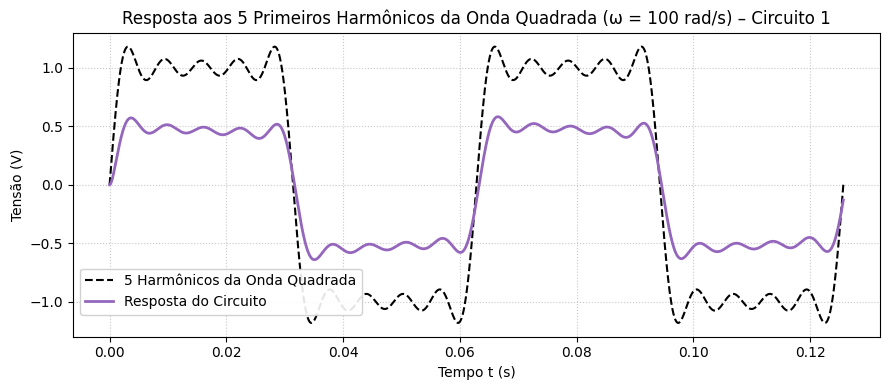

In [ ]:
# ----------- Parâmetros do circuito -----------
R1 = 10.0
R2 = 10.0
C1 = 100e-6
L1 = 1.0

# ----------- Função de transferência -----------
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# ----------- Frequência base e tempo -----------
omega = 100                      # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 3000)    # dois períodos

# ----------- Entrada com 5 harmônicos ímpares -----------
A = 4 / np.pi
v_in = np.zeros_like(t)

for k in range(5):
    n = 2*k + 1
    v_in += (1/n) * np.sin(n * omega * t)

v_in *= A  # escalar comum

# ----------- Resposta do sistema -----------
t, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# ----------- Plot -----------
plt.figure(figsize=(9, 4))
plt.plot(t, v_in, 'k--', linewidth=1.5, label='5 Harmônicos da Onda Quadrada')
plt.plot(t, v_out, 'tab:purple', linewidth=2, label='Resposta do Circuito')
plt.title('Resposta aos 5 Primeiros Harmônicos da Onda Quadrada (ω = 100 rad/s) – Circuito 1')
plt.xlabel('Tempo t (s)')
plt.ylabel('Tensão (V)')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

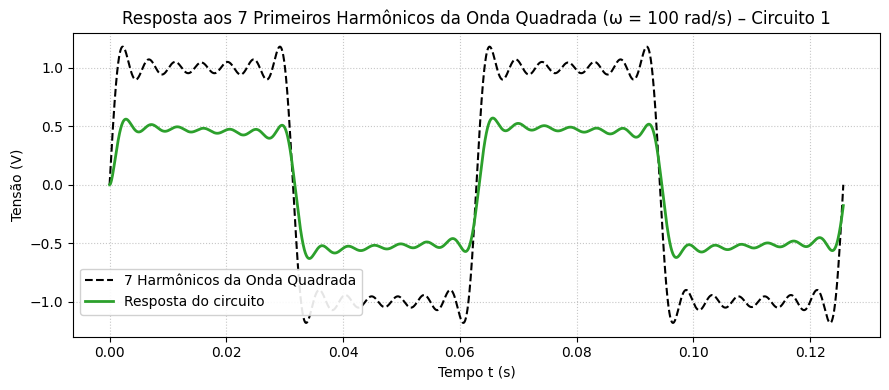

In [ ]:
# ----------- Parâmetros do circuito -----------
R1 = 10.0
R2 = 10.0
C1 = 100e-6
L1 = 1.0

# ----------- Função de transferência -----------
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# ----------- Frequência base e tempo -----------
omega = 100                      # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 3000)    # dois períodos

# ----------- Entrada com 7 harmônicos ímpares -----------
A = 4 / np.pi
v_in = np.zeros_like(t)

for k in range(7):
    n = 2*k + 1
    v_in += (1/n) * np.sin(n * omega * t)

v_in *= A  # escalar comum

# ----------- Resposta do sistema -----------
t, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# ----------- Plot -----------
plt.figure(figsize=(9, 4))
plt.plot(t, v_in, 'k--', linewidth=1.5, label='7 Harmônicos da Onda Quadrada')
plt.plot(t, v_out, 'tab:green', linewidth=2, label='Resposta do circuito')
plt.title('Resposta aos 7 Primeiros Harmônicos da Onda Quadrada (ω = 100 rad/s) – Circuito 1')
plt.xlabel('Tempo t (s)')
plt.ylabel('Tensão (V)')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

#### Letra P - Resposta à uma Dente de Serra de Frequência ω

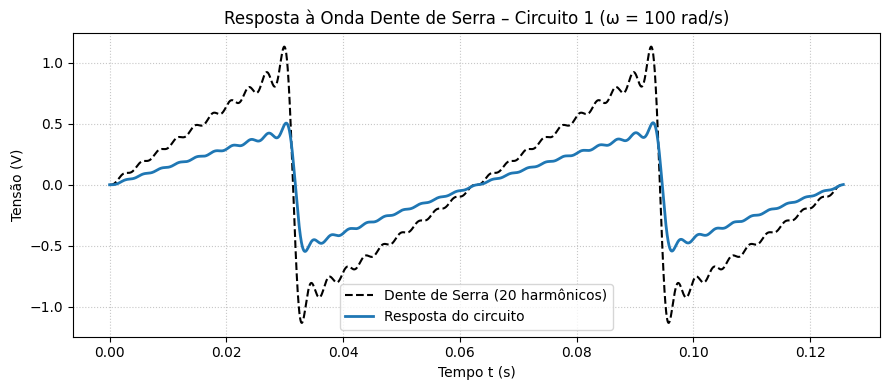

In [ ]:
# ----------- Parâmetros do circuito -----------
R1 = 10.0
R2 = 10.0
C1 = 100e-6
L1 = 1.0

# ----------- Função de transferência -----------
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# ----------- Frequência da dente de serra -----------
omega = 100                     # rad/s
f = omega / (2 * np.pi)         # Hz
T = 1 / f
t = np.linspace(0, 2*T, 3000)   # dois períodos

# ----------- Onda dente de serra com Fourier (20 harmônicos) -----------
A = 2 / np.pi
v_in = np.zeros_like(t)

for k in range(1, 21):  # harmônicos k = 1 a 20
    v_in += ((-1)**(k+1)) * (1/k) * np.sin(k * omega * t)

v_in *= A

# ----------- Resposta do sistema -----------
t, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# ----------- Plot -----------
plt.figure(figsize=(9, 4))
plt.plot(t, v_in, 'k--', linewidth=1.5, label='Dente de Serra (20 harmônicos)')
plt.plot(t, v_out, 'tab:blue', linewidth=2, label='Resposta do circuito')
plt.title('Resposta à Onda Dente de Serra – Circuito 1 (ω = 100 rad/s)')
plt.xlabel('Tempo t (s)')
plt.ylabel('Tensão (V)')
plt.legend()
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

#### Letra Q - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

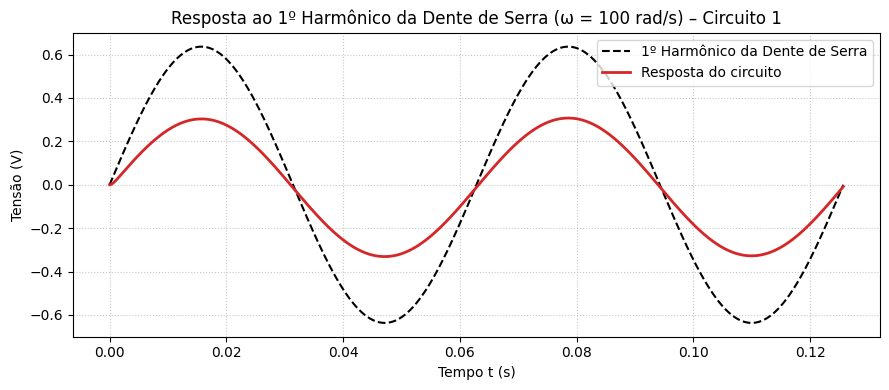

In [ ]:
# ----------- Parâmetros do circuito -----------
R1 = 10.0
R2 = 10.0
C1 = 100e-6
L1 = 1.0

# ----------- Função de transferência -----------
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# ----------- Frequência fundamental da dente de serra -----------
omega = 100                  # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 3000)

# ----------- Primeiro harmônico da dente de serra -----------
A = 2 / np.pi
v_in = A * np.sin(omega * t)

# ----------- Resposta do sistema -----------
t, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# ----------- Plot -----------
plt.figure(figsize=(9, 4))
plt.plot(t, v_in, 'k--', linewidth=1.5, label='1º Harmônico da Dente de Serra')
plt.plot(t, v_out, 'tab:red', linewidth=2, label='Resposta do circuito')
plt.title('Resposta ao 1º Harmônico da Dente de Serra (ω = 100 rad/s) – Circuito 1')
plt.xlabel('Tempo t (s)')
plt.ylabel('Tensão (V)')
plt.legend()
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

#### Letra R - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

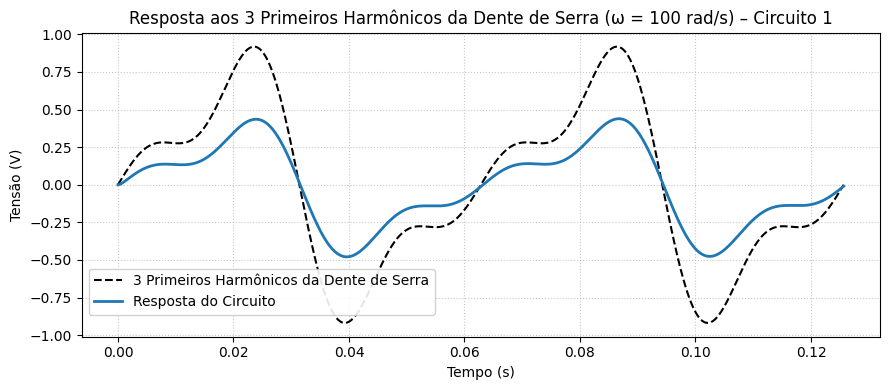

In [ ]:
# ----------- Parâmetros do circuito -----------
R1 = 10.0
R2 = 10.0
C1 = 100e-6
L1 = 1.0

# ----------- Função de transferência -----------
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# ----------- Frequência base e tempo -----------
omega = 100                    # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 3000)

# ----------- Entrada: 3 primeiros harmônicos da dente de serra -----------
A = 2 / np.pi
v_in = (
    A * np.sin(omega * t)
    - A/2 * np.sin(2 * omega * t)
    + A/3 * np.sin(3 * omega * t)
)

# ----------- Resposta do sistema -----------
t, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# ----------- Plot -----------
plt.figure(figsize=(9, 4))
plt.plot(t, v_in, 'k--', linewidth=1.5, label='3 Primeiros Harmônicos da Dente de Serra')
plt.plot(t, v_out, 'tab:blue', linewidth=2, label='Resposta do Circuito')
plt.title('Resposta aos 3 Primeiros Harmônicos da Dente de Serra (ω = 100 rad/s) – Circuito 1')
plt.xlabel('Tempo (s)')
plt.ylabel('Tensão (V)')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

#### Letra S - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

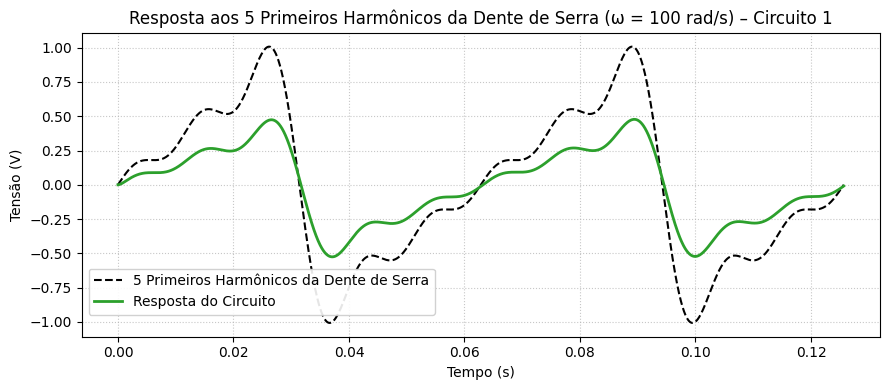

In [ ]:
# ----------- Parâmetros do circuito -----------
R1 = 10.0
R2 = 10.0
C1 = 100e-6
L1 = 1.0

# ----------- Função de transferência -----------
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# ----------- Frequência base e tempo -----------
omega = 100                   # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 3000)

# ----------- Entrada: 5 primeiros harmônicos da dente de serra -----------
A = 2 / np.pi
v_in = np.zeros_like(t)

for k in range(1, 6):  # k = 1 a 5
    coef = (-1)**(k+1) / k
    v_in += coef * np.sin(k * omega * t)

v_in *= A

# ----------- Resposta do sistema -----------
t, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# ----------- Plot -----------
plt.figure(figsize=(9, 4))
plt.plot(t, v_in, 'k--', linewidth=1.5, label='5 Primeiros Harmônicos da Dente de Serra')
plt.plot(t, v_out, 'tab:green', linewidth=2, label='Resposta do Circuito')
plt.title('Resposta aos 5 Primeiros Harmônicos da Dente de Serra (ω = 100 rad/s) – Circuito 1')
plt.xlabel('Tempo (s)')
plt.ylabel('Tensão (V)')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()

#### Letra T - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

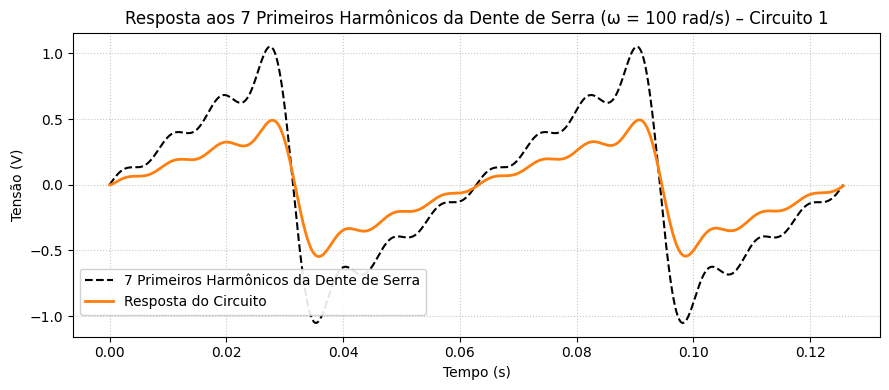

In [ ]:
# ----------- Parâmetros do circuito -----------
R1 = 10.0
R2 = 10.0
C1 = 100e-6
L1 = 1.0

# ----------- Função de transferência -----------
k = 1 / (C1 * R1)
b = (R1 + R2) / (C1 * R1 * R2)
c = 1 / (L1 * C1)
num = [k, 0]
den = [1, b, c]
sys = signal.TransferFunction(num, den)

# ----------- Frequência base e tempo -----------
omega = 100                    # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 3000)

# ----------- Entrada: 7 primeiros harmônicos da dente de serra -----------
A = 2 / np.pi
v_in = np.zeros_like(t)

for k in range(1, 8):  # k = 1 a 7
    coef = (-1)**(k+1) / k
    v_in += coef * np.sin(k * omega * t)

v_in *= A

# ----------- Resposta do sistema -----------
t, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# ----------- Plot -----------
plt.figure(figsize=(9, 4))
plt.plot(t, v_in, 'k--', linewidth=1.5, label='7 Primeiros Harmônicos da Dente de Serra')
plt.plot(t, v_out, 'tab:orange', linewidth=2, label='Resposta do Circuito')
plt.title('Resposta aos 7 Primeiros Harmônicos da Dente de Serra (ω = 100 rad/s) – Circuito 1')
plt.xlabel('Tempo (s)')
plt.ylabel('Tensão (V)')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.grid(True, linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

### Circuito 2

Com base no desenvolvimento presente no PDF do Trabalho Escrito, a função de transferência é: $H(s)=
\frac{\dfrac{R_1}{L_1}\,s}{s^{2}+\dfrac{R_1+R_2}{L_1}s+\dfrac{1}{L_1C_1}}$

<br>

Com os valores: $R_1 = R_2 = 1k\Omega, C_1 = 100\text{nF}, L_1 = 253\text{mH}$, temos: $H(s) = \frac{3953\,s}{s^{2}+7914\,s+3.95\times10^{7}}$

#### Letra G - Diagrama de Pólos e Zeros

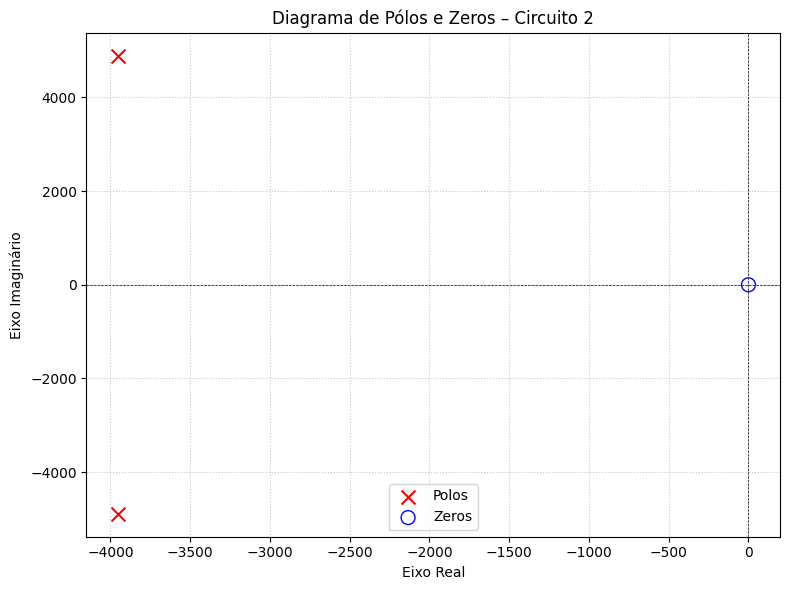

In [ ]:
# Valores comerciais
R1 = 1e3          # 1 kΩ
R2 = 1e3          # 1 kΩ
C1 = 100e-9       # 100 nF
L1 = 0.253        # 253 mH

# H(s) = (R1/L1)*s / (s² + (R1+R2)/L1*s + 1/(L1*C1))
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Polos e zeros
zeros = np.roots(num)
poles = np.roots(den)

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(np.real(poles), np.imag(poles), marker='x', s=100, color='r', label='Polos')
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', s=100, facecolors='none',
            edgecolors='b', label='Zeros')
plt.axhline(0, color='black', lw=0.5, linestyle='--')
plt.axvline(0, color='black', lw=0.5, linestyle='--')
plt.xlabel('Eixo Real')
plt.ylabel('Eixo Imaginário')
plt.title('Diagrama de Pólos e Zeros – Circuito 2')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

####Letra H - Diagrama de Bode

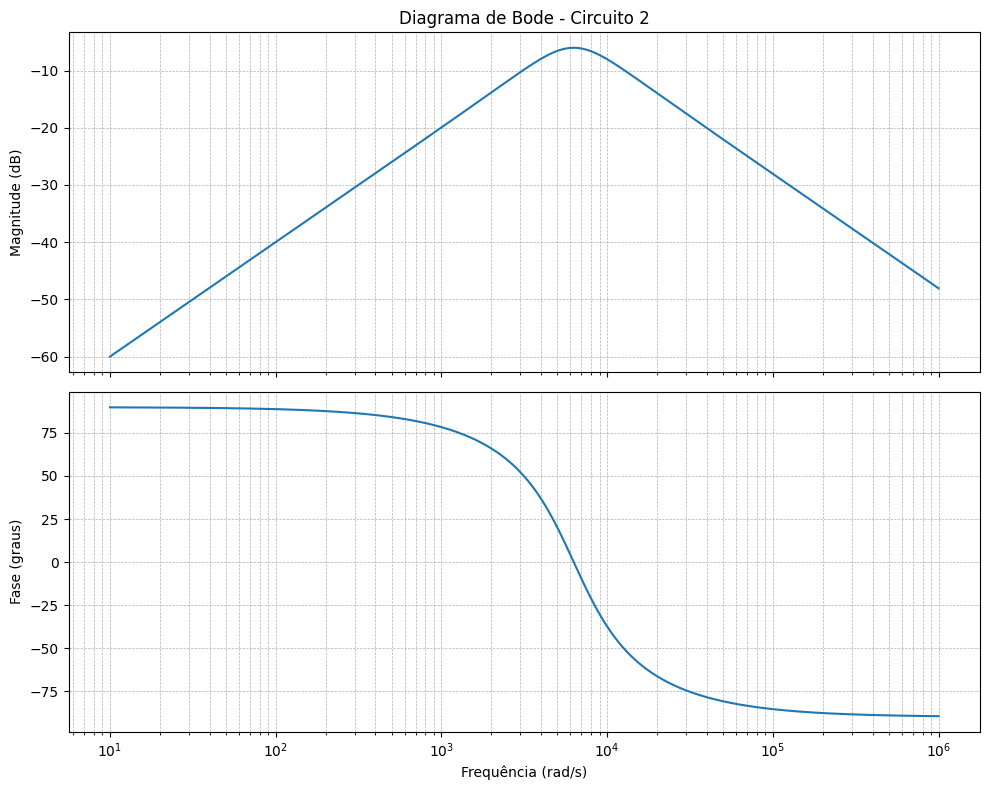

In [3]:
# Valores comerciais do circuito
R1 = 1e3          # 1 kΩ
R2 = 1e3          # 1 kΩ
C1 = 100e-9       # 100 nF
L1 = 0.253        # 253 mH

# Função de transferência H(s)
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Frequência angular (logspace para o gráfico de Bode)
w = np.logspace(1, 6, 1000)  # de 10 rad/s a 1 MHz
w, mag, phase = signal.bode(sys, w)

# Plot do Diagrama de Bode (magnitude e fase em subplots)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Magnitude
ax1.semilogx(w, mag)
ax1.set_title("Diagrama de Bode - Circuito 2")
ax1.set_ylabel("Magnitude (dB)")
ax1.grid(which="both", linestyle="--", linewidth=0.5)

# Fase
ax2.semilogx(w, phase)
ax2.set_ylabel("Fase (graus)")
ax2.set_xlabel("Frequência (rad/s)")
ax2.grid(which="both", linestyle="--", linewidth=0.5)

plt.tight_layout()
plt.show()

#### Letra I - Resposta ao Degrau Unitário

/tmp/ipython-input-167-273904305.py:22: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


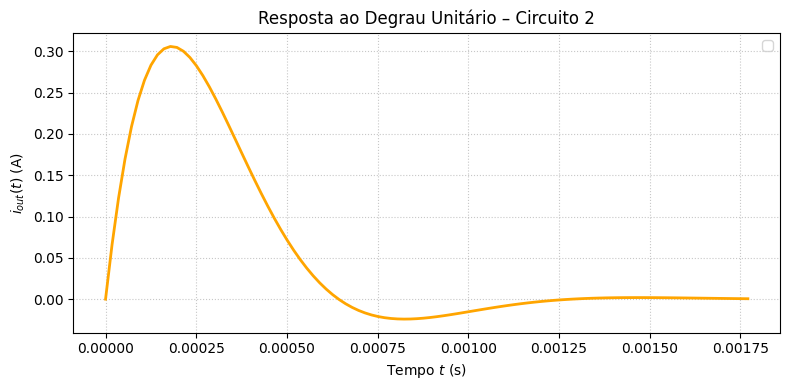

In [ ]:
# Valores comerciais
R1 = 1e3          # 1 kΩ
R2 = 1e3          # 1 kΩ
C1 = 100e-9       # 100 nF
L1 = 0.253        # 253 mH

# Função de transferência H(s)
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Resposta ao degrau unitário (Iin = 1·u(t))
t, i_out = signal.step(sys)

# Plot
plt.figure(figsize=(8, 4))
plt.plot(t, i_out, linewidth=2, color='orange')
plt.title('Resposta ao Degrau Unitário – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra J - Resposta a Rampa Unitária

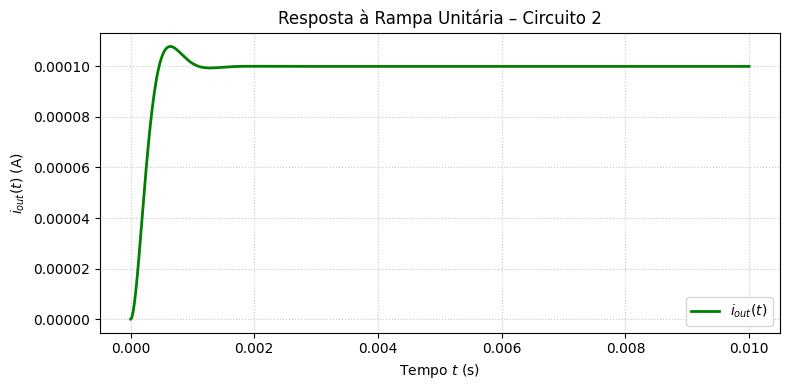

In [ ]:
# Parâmetros do circuito
R1 = 1e3          # 1 kΩ
R2 = 1e3          # 1 kΩ
C1 = 100e-9       # 100 nF
L1 = 0.253        # 253 mH

# Função de transferência
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Sinal de entrada: rampa unitária (i_in(t) = t·u(t))
t = np.linspace(0, 0.01, 1000)
i_in = t  # Rampa unitária

# Resposta ao sinal arbitrário
t_out, i_out, _ = signal.lsim(sys, U=i_in, T=t)

# Plot
plt.figure(figsize=(8, 4))
plt.plot(t_out, i_out, label=r'$i_{out}(t)$', color='green', linewidth=2)
plt.title('Resposta à Rampa Unitária – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra K - Resposta a uma Onda Quadrada de Frequência ω

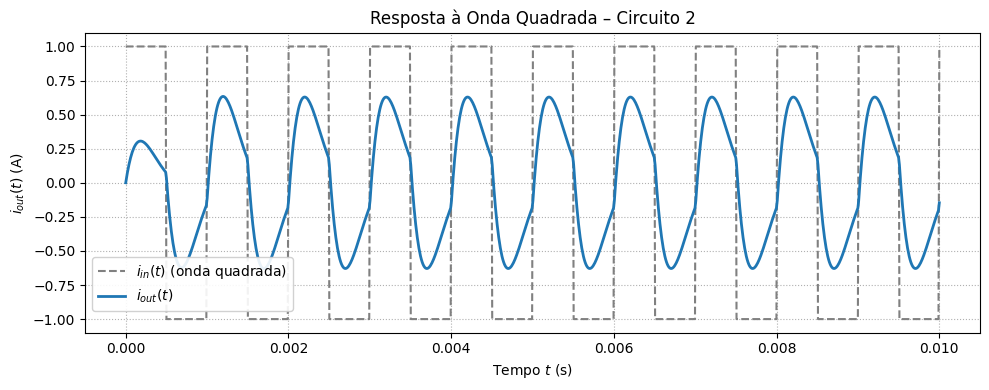

In [ ]:
# Parâmetros do circuito
R1 = 1e3         # 1 kΩ
R2 = 1e3         # 1 kΩ
C1 = 100e-9      # 100 nF
L1 = 0.253       # 253 mH

# Frequência fundamental (central do filtro)
f = 1e3          # 1 kHz
omega = 2 * np.pi * f

# Função de transferência do circuito
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Sinal de entrada: onda quadrada com frequência ω
t = np.linspace(0, 0.01, 1000)
i_in = signal.square(omega * t)

# Resposta do sistema
t_out, i_out, _ = signal.lsim(sys, U=i_in, T=t)

# Plot da entrada e da saída
plt.figure(figsize=(10, 4))
plt.plot(t, i_in, label=r'$i_{in}(t)$ (onda quadrada)', linestyle='--', color='gray')
plt.plot(t_out, i_out, label=r'$i_{out}(t)$', linewidth=2)
plt.title('Resposta à Onda Quadrada – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.tight_layout()
plt.show()

#### Letra L - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

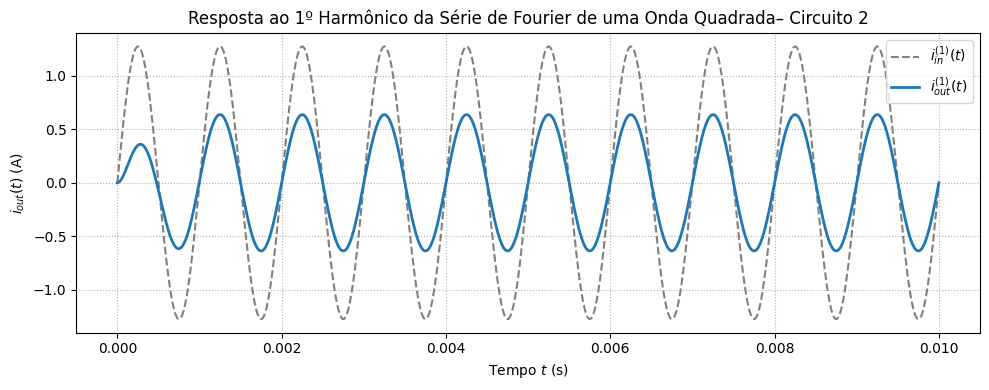

In [ ]:
# Parâmetros do circuito
R1 = 1e3
R2 = 1e3
C1 = 100e-9
L1 = 0.253

# Função de transferência
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# 1º harmônico
f = 1e3
omega = 2 * np.pi * f
t = np.linspace(0, 0.01, 1000)
i_in_1 = (4 / np.pi) * np.sin(omega * t)

# Resposta à senoide
t_out, i_out_1, _ = signal.lsim(sys, U=i_in_1, T=t)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(t, i_in_1, label=r'$i_{in}^{(1)}(t)$', linestyle='--', color='gray')
plt.plot(t_out, i_out_1, label=r'$i_{out}^{(1)}(t)$', linewidth=2)
plt.title('Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada– Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra M - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

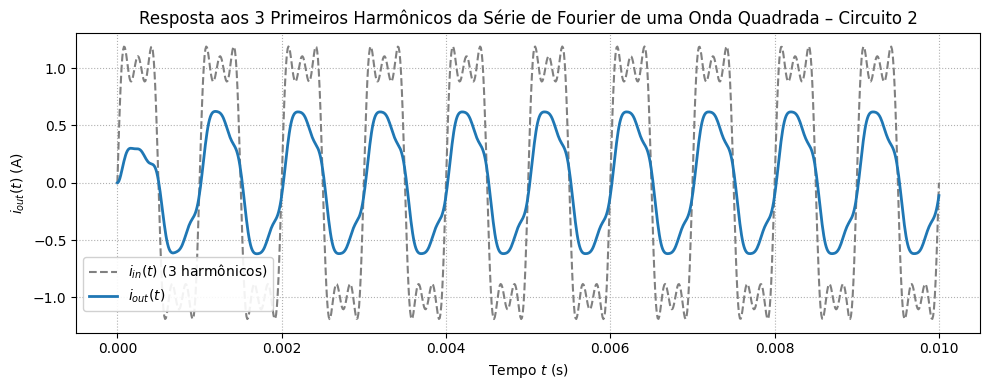

In [ ]:
# Parâmetros do circuito
R1 = 1e3
R2 = 1e3
C1 = 100e-9
L1 = 0.253

# Função de transferência
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Parâmetros do sinal
f = 1e3
omega = 2 * np.pi * f
t = np.linspace(0, 0.01, 1000)

# Entrada com 3 primeiros harmônicos
i_in = (4 / np.pi) * (
    np.sin(omega * t) +
    (1/3) * np.sin(3 * omega * t) +
    (1/5) * np.sin(5 * omega * t)
)

# Resposta à entrada
t_out, i_out, _ = signal.lsim(sys, U=i_in, T=t)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(t, i_in, label=r'$i_{in}(t)$ (3 harmônicos)', linestyle='--', color='gray')
plt.plot(t_out, i_out, label=r'$i_{out}(t)$', linewidth=2)
plt.title('Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

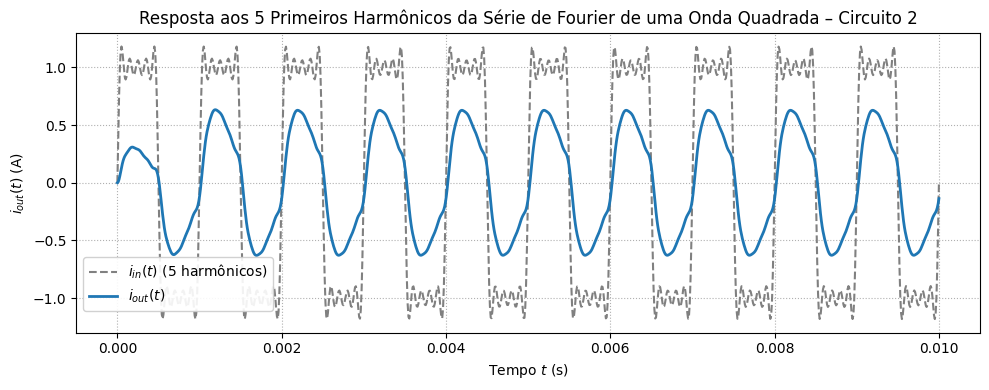

In [ ]:
# Parâmetros do circuito
R1 = 1e3
R2 = 1e3
C1 = 100e-9
L1 = 0.253

# Função de transferência
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
f = 1e3
omega = 2 * np.pi * f
t = np.linspace(0, 0.01, 1000)

# Entrada: 5 primeiros harmônicos (ímpares)
i_in = (4 / np.pi) * sum(
    (1/n) * np.sin(n * omega * t) for n in [1, 3, 5, 7, 9]
)

# Resposta do sistema
t_out, i_out, _ = signal.lsim(sys, U=i_in, T=t)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(t, i_in, label=r'$i_{in}(t)$ (5 harmônicos)', linestyle='--', color='gray')
plt.plot(t_out, i_out, label=r'$i_{out}(t)$', linewidth=2)
plt.title('Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

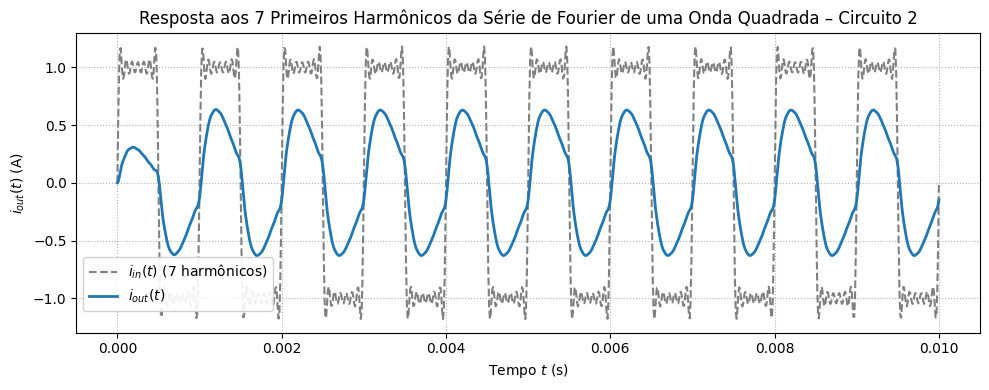

In [ ]:
# Parâmetros do circuito
R1 = 1e3
R2 = 1e3
C1 = 100e-9
L1 = 0.253

# Função de transferência
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
f = 1e3
omega = 2 * np.pi * f
t = np.linspace(0, 0.01, 1000)

# Entrada: 7 primeiros harmônicos (ímpares até n=13)
i_in = (4 / np.pi) * sum(
    (1/n) * np.sin(n * omega * t) for n in [1, 3, 5, 7, 9, 11, 13]
)

# Resposta do sistema
t_out, i_out, _ = signal.lsim(sys, U=i_in, T=t)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(t, i_in, label=r'$i_{in}(t)$ (7 harmônicos)', linestyle='--', color='gray')
plt.plot(t_out, i_out, label=r'$i_{out}(t)$', linewidth=2)
plt.title('Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.tight_layout()
plt.show()

#### Letra P - Resposta à uma Dente de Serra de Frequência ω

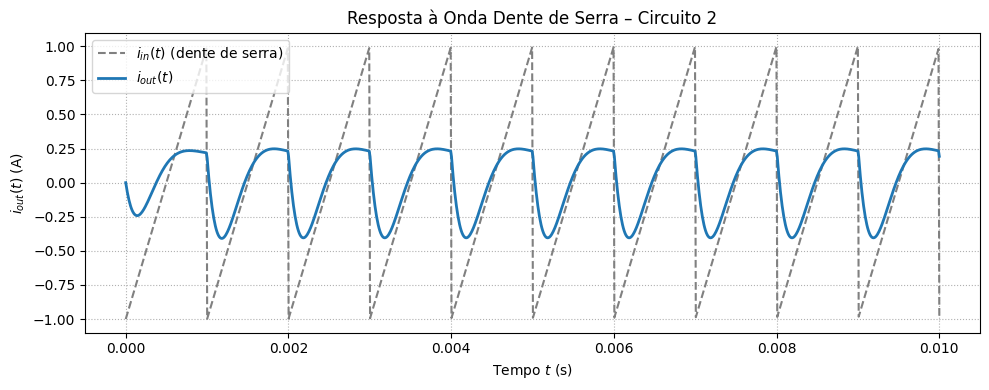

In [ ]:
# Parâmetros do circuito
R1 = 1e3
R2 = 1e3
C1 = 100e-9
L1 = 0.253

# Função de transferência do sistema
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Parâmetros da onda
f = 1e3                  # Frequência da dente de serra (Hz)
omega = 2 * np.pi * f
t = np.linspace(0, 0.01, 1000)
i_in = signal.sawtooth(omega * t, width=1.0)

# Resposta do sistema
t_out, i_out, _ = signal.lsim(sys, U=i_in, T=t)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(t, i_in, label=r'$i_{in}(t)$ (dente de serra)', linestyle='--', color='gray')
plt.plot(t_out, i_out, label=r'$i_{out}(t)$', linewidth=2)
plt.title('Resposta à Onda Dente de Serra – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra Q - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

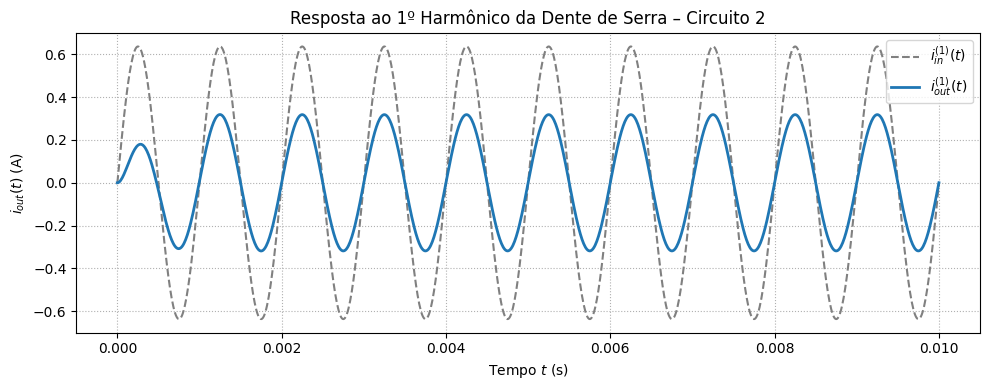

In [ ]:

# Parâmetros do circuito
R1 = 1e3
R2 = 1e3
C1 = 100e-9
L1 = 0.253

# Função de transferência
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
f = 1e3
omega = 2 * np.pi * f
t = np.linspace(0, 0.01, 1000)

# 1º harmônico da dente de serra
i_in_1 = (2 / np.pi) * np.sin(omega * t)

# Resposta do sistema
t_out, i_out_1, _ = signal.lsim(sys, U=i_in_1, T=t)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(t, i_in_1, label=r'$i_{in}^{(1)}(t)$', linestyle='--', color='gray')
plt.plot(t_out, i_out_1, label=r'$i_{out}^{(1)}(t)$', linewidth=2)
plt.title('Resposta ao 1º Harmônico da Dente de Serra – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra R - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

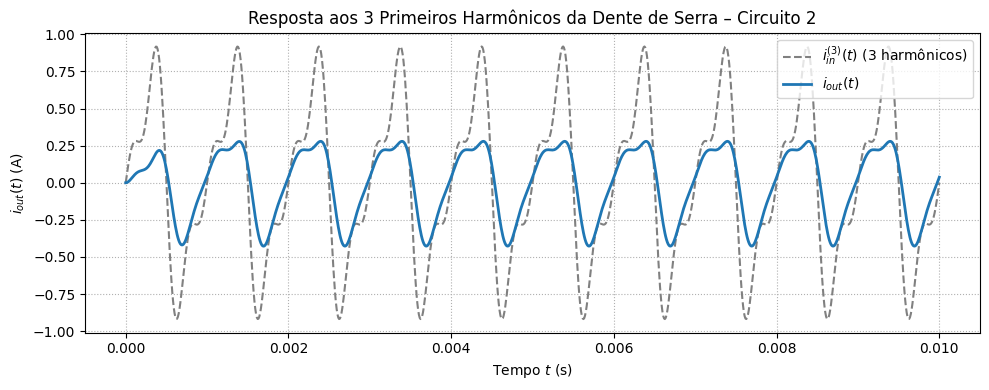

In [ ]:
# Parâmetros do circuito
R1 = 1e3
R2 = 1e3
C1 = 100e-9
L1 = 0.253

# Função de transferência
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
f = 1e3
omega = 2 * np.pi * f
t = np.linspace(0, 0.01, 1000)

# Entrada: 3 primeiros harmônicos da dente de serra
i_in = (2 / np.pi) * (
    np.sin(1 * omega * t) -
    (1/2) * np.sin(2 * omega * t) +
    (1/3) * np.sin(3 * omega * t)
)

# Resposta do sistema
t_out, i_out, _ = signal.lsim(sys, U=i_in, T=t)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(t, i_in, label=r'$i_{in}^{(3)}(t)$ (3 harmônicos)', linestyle='--', color='gray')
plt.plot(t_out, i_out, label=r'$i_{out}(t)$', linewidth=2)
plt.title('Resposta aos 3 Primeiros Harmônicos da Dente de Serra – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra S - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

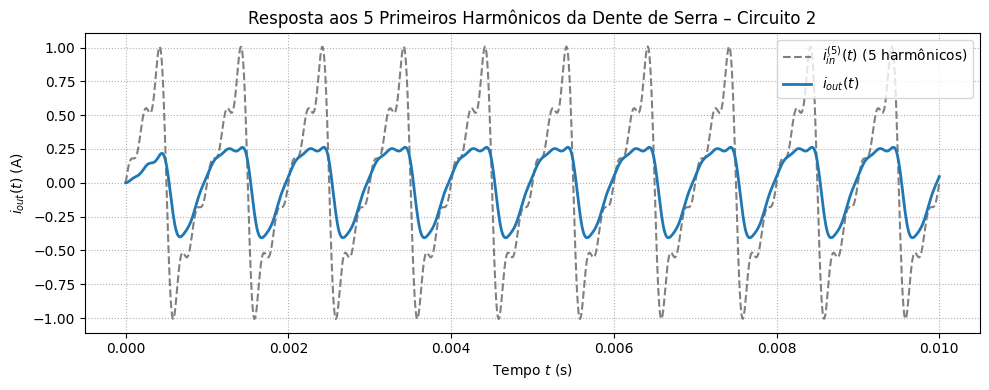

In [ ]:
# Parâmetros do circuito
R1 = 1e3
R2 = 1e3
C1 = 100e-9
L1 = 0.253

# Função de transferência
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
f = 1e3
omega = 2 * np.pi * f
t = np.linspace(0, 0.01, 1000)

# Entrada: 5 primeiros harmônicos da dente de serra
i_in = (2 / np.pi) * (
    np.sin(1 * omega * t) -
    (1/2) * np.sin(2 * omega * t) +
    (1/3) * np.sin(3 * omega * t) -
    (1/4) * np.sin(4 * omega * t) +
    (1/5) * np.sin(5 * omega * t)
)

# Resposta do sistema
t_out, i_out, _ = signal.lsim(sys, U=i_in, T=t)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(t, i_in, label=r'$i_{in}^{(5)}(t)$ (5 harmônicos)', linestyle='--', color='gray')
plt.plot(t_out, i_out, label=r'$i_{out}(t)$', linewidth=2)
plt.title('Resposta aos 5 Primeiros Harmônicos da Dente de Serra – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra T - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

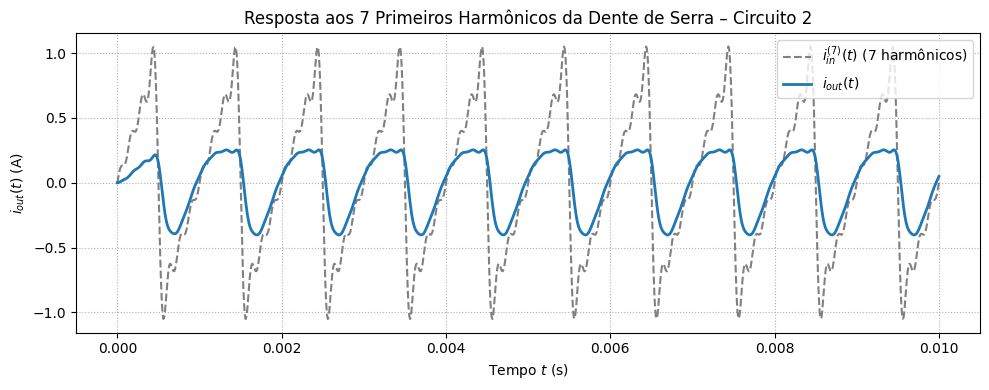

In [ ]:
# Parâmetros do circuito
R1 = 1e3
R2 = 1e3
C1 = 100e-9
L1 = 0.253

# Função de transferência
num = [R1 / L1, 0]
den = [1, (R1 + R2) / L1, 1 / (L1 * C1)]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
f = 1e3
omega = 2 * np.pi * f
t = np.linspace(0, 0.01, 1000)

# Entrada: 7 primeiros harmônicos da dente de serra
i_in = (2 / np.pi) * (
    np.sin(1 * omega * t) -
    (1/2) * np.sin(2 * omega * t) +
    (1/3) * np.sin(3 * omega * t) -
    (1/4) * np.sin(4 * omega * t) +
    (1/5) * np.sin(5 * omega * t) -
    (1/6) * np.sin(6 * omega * t) +
    (1/7) * np.sin(7 * omega * t)
)

# Resposta do sistema
t_out, i_out, _ = signal.lsim(sys, U=i_in, T=t)

# Plot
plt.figure(figsize=(10, 4))
plt.plot(t, i_in, label=r'$i_{in}^{(7)}(t)$ (7 harmônicos)', linestyle='--', color='gray')
plt.plot(t_out, i_out, label=r'$i_{out}(t)$', linewidth=2)
plt.title('Resposta aos 7 Primeiros Harmônicos da Dente de Serra – Circuito 2')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('$i_{out}(t)$ (A)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Circuito 3

Com base no desenvolvimento presente no PDF do Trabalho Escrito, a função de transferência é: $H(s)=
-\frac{C_1}{C_2 R_1 R_2} \cdot \frac{1}{s + \left( \frac{1}{C_2} \left( \frac{1}{R_1} + \frac{1}{R_2} \right) \right)}$

<br>

Com os valores: $R_1 = R_2 = 10k\Omega, C_1 = 100\text{nF}, C_2 = 15\text{nF}$



#### Letra G - Diagrama de Pólos e Zeros

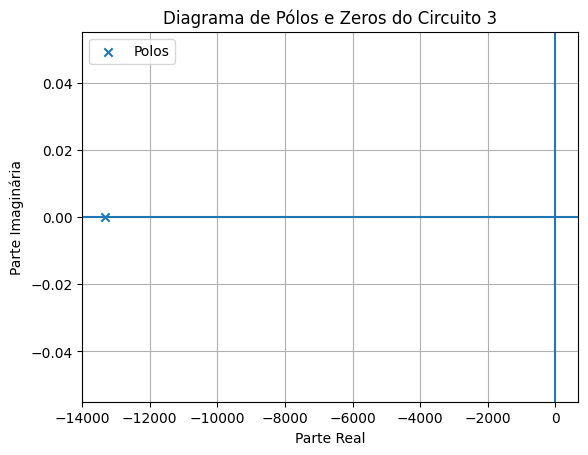

In [ ]:
# Componentes
R1 = R2 = 10e3          # 10 kΩ
C2 = 15e-9              # 15 nF

# Pólo do sistema
omega_0 = (1/R1 + 1/R2) / C2

num = [1.0]             # ganho constante (não afeta polos/zeros)
den = [1.0, omega_0]    # s + ω0

# Zeros, polos, ganho
z, p, k = signal.tf2zpk(num, den)

# Plot
plt.figure()
if z.size:
    plt.scatter(np.real(z), np.imag(z), marker='o', label='Zeros')
plt.scatter(np.real(p), np.imag(p), marker='x', label='Polos')
plt.axhline(0); plt.axvline(0)
plt.grid(True)
plt.title('Diagrama de Pólos e Zeros do Circuito 3')
plt.xlabel('Parte Real'); plt.ylabel('Parte Imaginária')
plt.legend()
plt.show()

####Letra H - Diagrama de Bode

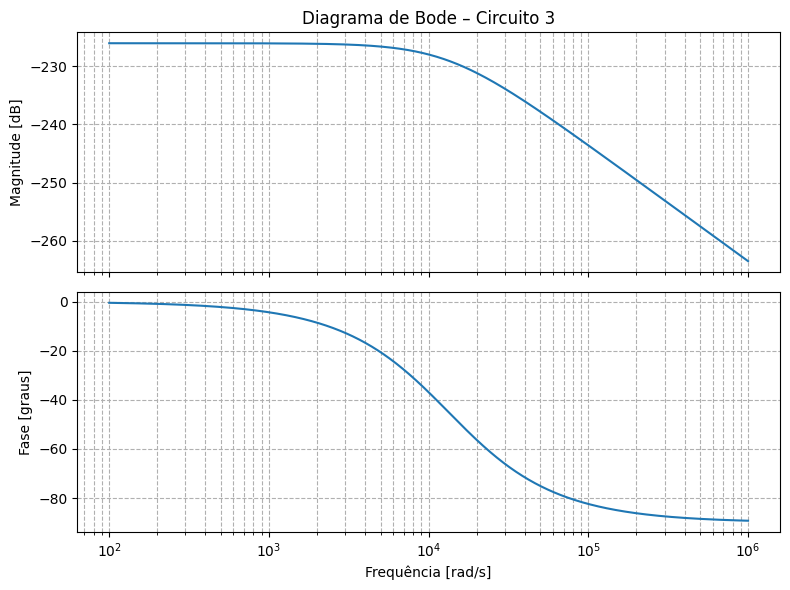

In [ ]:
# ─── Parâmetros do circuito ────────────────────────────────────────────────────
R1 = R2 = 10e3      # 10 kΩ
C1 = 100e-9         # 100 nF
C2 = 15e-9          # 15 nF

# ─── Função de transferência H(s) = K / (s + ω0) ───────────────────────────────
K       = C1 / (C2 * R1 * R2)        # ganho (afeta apenas a magnitude)
omega_0 = (1/R1 + 1/R2) / C2         # posição do pólo

num = [K]            # numerador
den = [1, omega_0]   # denominador s + ω0
system = signal.TransferFunction(num, den)

# ─── Cálculo do Bode ───────────────────────────────────────────────────────────
w = np.logspace(2, 6, 1000)          # 10² a 10⁶ rad/s
w, mag, phase = signal.bode(system, w=w)

# ─── Plot: magnitude e fase na mesma figura ────────────────────────────────────
fig, axs = plt.subplots(2, 1, sharex=True, figsize=(8, 6))

# Magnitude
axs[0].semilogx(w, mag)
axs[0].set_title('Diagrama de Bode – Circuito 3')
axs[0].set_ylabel('Magnitude [dB]')
axs[0].grid(which='both', linestyle='--')

# Fase
axs[1].semilogx(w, phase)
axs[1].set_xlabel('Frequência [rad/s]')
axs[1].set_ylabel('Fase [graus]')
axs[1].grid(which='both', linestyle='--')

plt.tight_layout()
plt.show()

#### Letra I - Resposta ao Degrau Unitário

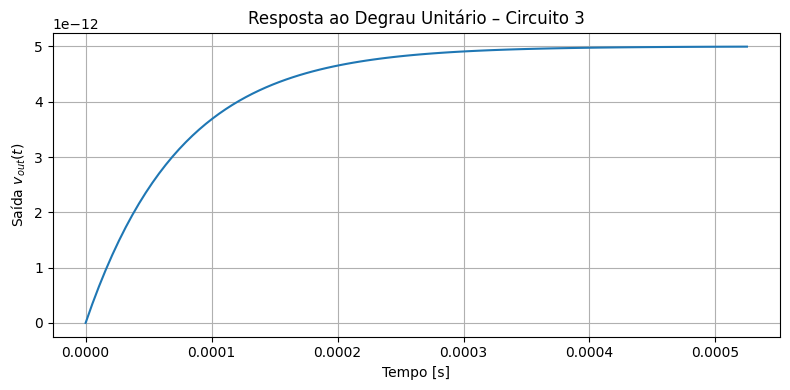

In [ ]:
# Componentes
R1 = R2 = 10e3
C1 = 100e-9
C2 = 15e-9

# Parâmetros do sistema
K = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2

# Função de transferência: H(s) = K / (s + omega_0)
num = [K]
den = [1, omega_0]
system = signal.TransferFunction(num, den)

# Resposta ao degrau
t, y = signal.step(system)

# Gráfico
plt.figure(figsize=(8, 4))
plt.plot(t, y)
plt.title('Resposta ao Degrau Unitário – Circuito 3')
plt.xlabel('Tempo [s]')
plt.ylabel('Saída $v_{out}(t)$')
plt.grid(True)
plt.tight_layout()
plt.show()

#### Letra J - Resposta a Rampa Unitária

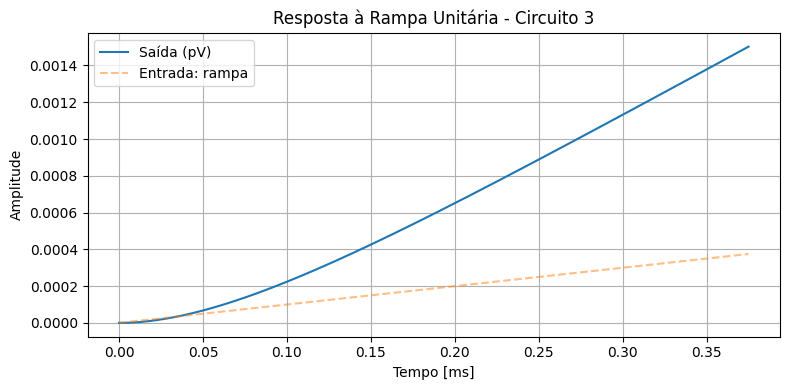

In [ ]:
# ── Parâmetros do circuito ────────────────────────────────
R1 = R2 = 10e3          # 10 kΩ
C1 = 100e-9             # 100 nF
C2 = 15e-9              # 15 nF
K       = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2
system  = signal.TransferFunction([K], [1, omega_0])

# ── Entrada rampa unitária  u(t)=t·u(t) ───────────────────
t = np.linspace(0, 5/omega_0, 5000)
u = t
t_out, y, _ = signal.lsim(system, U=u, T=t)

# ── Gráfico (saída em pico-volts para enxergar) ───────────
plt.figure(figsize=(8,4))
plt.plot(t*1e3, y*1e12, label='Saída (pV)')
plt.plot(t*1e3, u, '--', alpha=.5, label='Entrada: rampa')
plt.title('Resposta à Rampa Unitária - Circuito 3')
plt.xlabel('Tempo [ms]'); plt.ylabel('Amplitude')
plt.grid(True); plt.legend(); plt.tight_layout()
plt.show()

#### Letra K - Resposta a uma Onda Quadrada de Frequência ω

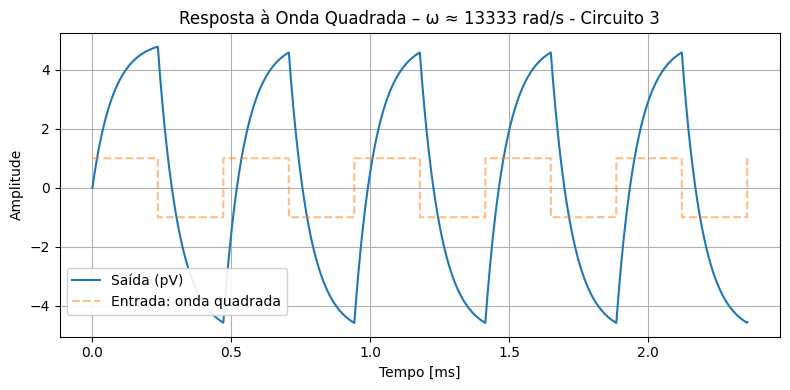

In [ ]:
# ── Parâmetros do circuito ────────────────────────────────
R1 = R2 = 10e3
C1 = 100e-9
C2 = 15e-9
K       = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2
system  = signal.TransferFunction([K], [1, omega_0])

# ── Entrada: onda quadrada de frequência ω0 ───────────────
f0 = omega_0 / (2*np.pi)
T  = 1 / f0
t  = np.linspace(0, 5*T, 5000)
u  = signal.square(2*np.pi*f0*t)

t_out, y, _ = signal.lsim(system, U=u, T=t)

# ── Gráfico (saída em pico-volts) ─────────────────────────
plt.figure(figsize=(8,4))
plt.plot(t*1e3, y*1e12, label='Saída (pV)')
plt.plot(t*1e3, u, '--', alpha=.5, label='Entrada: onda quadrada')
plt.title('Resposta à Onda Quadrada – ω ≈ %.0f rad/s - Circuito 3' % omega_0)
plt.xlabel('Tempo [ms]'); plt.ylabel('Amplitude')
plt.grid(True); plt.legend(); plt.tight_layout()
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.show()

#### Letra L - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

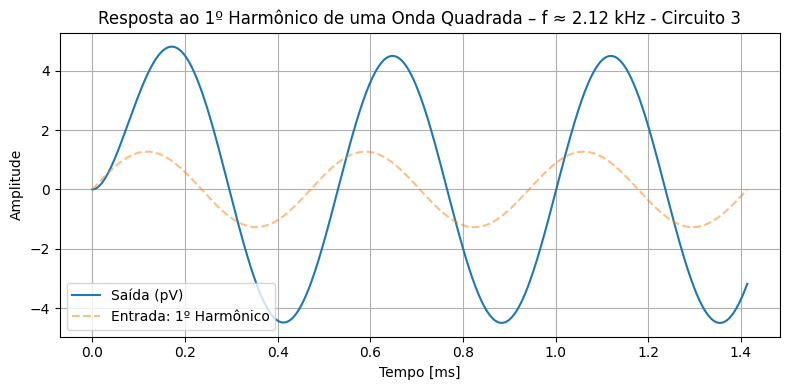

In [ ]:
# ── Parâmetros do circuito ────────────────────────────────
R1 = R2 = 10e3
C1 = 100e-9
C2 = 15e-9
K       = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2
system  = signal.TransferFunction([K], [1, omega_0])

# ── Entrada: 1º harmônico da onda quadrada ────────────────
f0 = omega_0 / (2*np.pi)
T  = 1 / f0
t  = np.linspace(0, 3*T, 3000)
u  = (4/np.pi) * np.sin(2*np.pi*f0*t)

t_out, y, _ = signal.lsim(system, U=u, T=t)

# ── Gráfico (saída em pico-volts) ─────────────────────────
plt.figure(figsize=(8,4))
plt.plot(t*1e3, y*1e12, label='Saída (pV)')
plt.plot(t*1e3, u, '--', alpha=.5, label='Entrada: 1º Harmônico')
plt.title(f'Resposta ao 1º Harmônico de uma Onda Quadrada – f ≈ {f0/1e3:.2f} kHz - Circuito 3')
plt.xlabel('Tempo [ms]'); plt.ylabel('Amplitude')
plt.grid(True); plt.legend(); plt.tight_layout()
plt.show()

#### Letra M - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

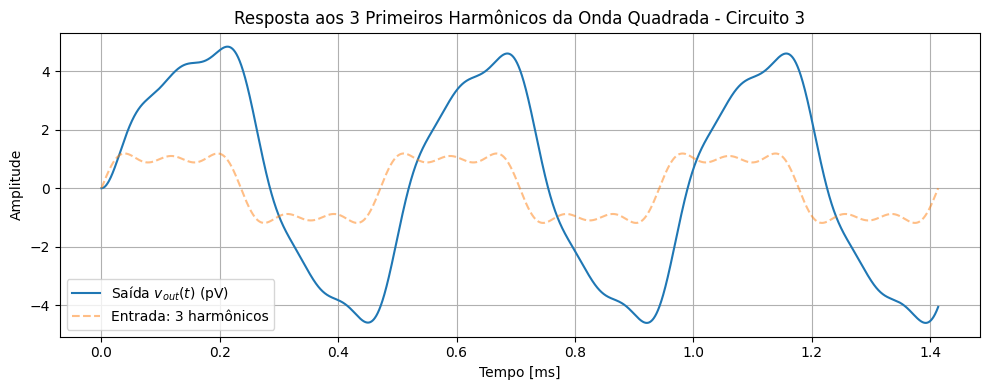

In [ ]:
# ─── Parâmetros do Circuito ───────────────────────────────────
R1 = R2 = 10e3           # Resistores de 10kΩ
C1 = 100e-9              # Capacitor C1 = 100nF
C2 = 15e-9               # Capacitor C2 = 15nF

# Função de transferência H(s) = K / (s + ω0)
K = C1 / (C2 * R1 * R2)
omega0 = (1/R1 + 1/R2) / C2
system = signal.TransferFunction([K], [1, omega0])

# ─── Sinal de entrada: 3 primeiros harmônicos da onda quadrada ───
f0 = omega0 / (2 * np.pi)  # Frequência fundamental
T = 1 / f0
t = np.linspace(0, 3*T, 5000)

# Série de Fourier: soma dos 3 primeiros harmônicos ímpares
u = np.zeros_like(t)
for k in [1, 3, 5]:
    u += (4 / (np.pi * k)) * np.sin(2 * np.pi * f0 * k * t)

# ─── Resposta do sistema ─────────────────────────────────────────
t_out, y, _ = signal.lsim(system, U=u, T=t)

# ─── Gráfico ─────────────────────────────────────────────────────
plt.figure(figsize=(10, 4))
plt.plot(t * 1e3, y * 1e12, label='Saída $v_{out}(t)$ (pV)')
plt.plot(t * 1e3, u, '--', label='Entrada: 3 harmônicos', alpha=0.5)
plt.title('Resposta aos 3 Primeiros Harmônicos da Onda Quadrada - Circuito 3')
plt.xlabel('Tempo [ms]')
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

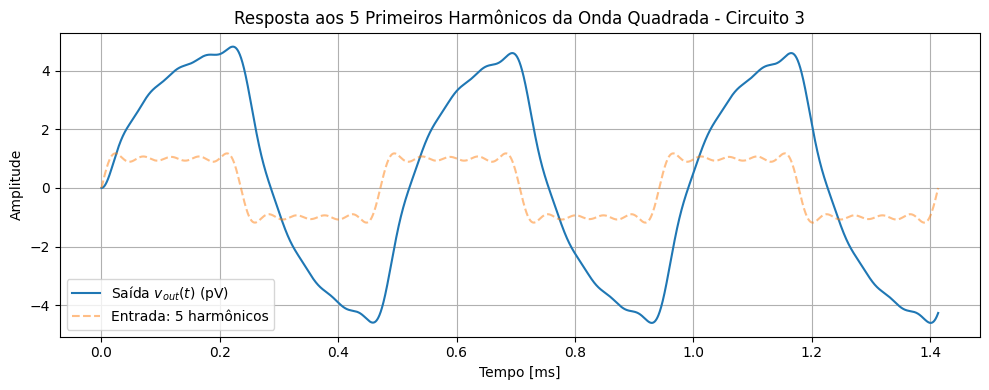

In [ ]:
# ── Parâmetros do circuito ────────────────────────────────
R1 = R2 = 10e3          # 10 kΩ
C1 = 100e-9             # 100 nF
C2 = 15e-9              # 15 nF
K       = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2
system  = signal.TransferFunction([K], [1, omega_0])

# ── Frequência fundamental e malha de tempo ───────────────
f0 = omega_0 / (2*np.pi)        # Hz
T  = 1 / f0
t  = np.linspace(0, 3*T, 6000)  # 3 períodos

# ── Entrada: 5 harmônicos ímpares (k = 1,3,5,7,9) ─────────
u = np.zeros_like(t)
for k in [1, 3, 5, 7, 9]:
    u += (4 / (np.pi * k)) * np.sin(2 * np.pi * f0 * k * t)

# ── Resposta do sistema ───────────────────────────────────
t_out, y, _ = signal.lsim(system, U=u, T=t)

# ── Gráfico (saída em pico-volts para visualização) ───────
plt.figure(figsize=(10, 4))
plt.plot(t*1e3, y*1e12, label='Saída $v_{out}(t)$ (pV)')
plt.plot(t*1e3, u, '--', alpha=0.5, label='Entrada: 5 harmônicos')
plt.title('Resposta aos 5 Primeiros Harmônicos da Onda Quadrada - Circuito 3')
plt.xlabel('Tempo [ms]')
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

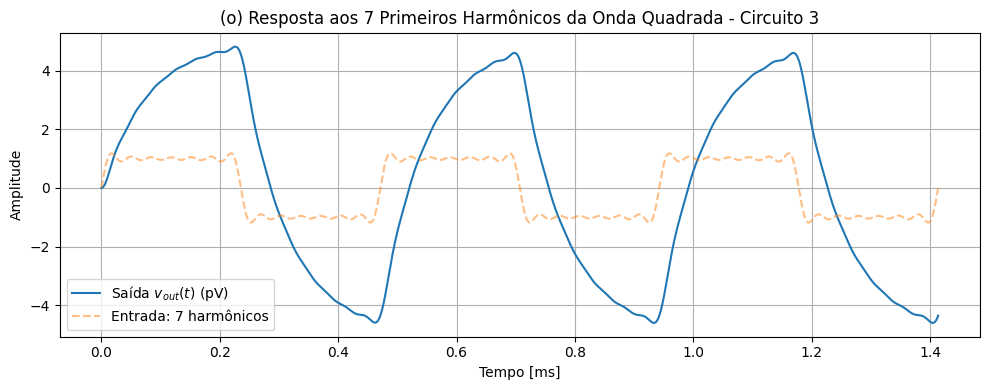

In [ ]:
# ── Parâmetros do circuito ─────────────────────────────────────────
R1 = R2 = 10e3         # 10 kΩ
C1 = 100e-9            # 100 nF
C2 = 15e-9             # 15 nF

# Função de transferência H(s) = K /(s + ω0)
K       = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2
system  = signal.TransferFunction([K], [1, omega_0])

# ── Frequência fundamental e malha de tempo ───────────────────────
f0 = omega_0 / (2*np.pi)      # Hz
T  = 1 / f0
t  = np.linspace(0, 3*T, 6000)

# ── Entrada: 7 harmônicos ímpares (k = 1,3,5,7,9,11,13) ───────────
u = np.zeros_like(t)
for k in range(1, 14, 2):     # 1, 3, 5, 7, 9, 11, 13
    u += (4 / (np.pi * k)) * np.sin(2 * np.pi * f0 * k * t)

# ── Resposta do sistema ───────────────────────────────────────────
t_out, y, _ = signal.lsim(system, U=u, T=t)

# ── Gráfico (saída escalada em pV para visibilidade) ──────────────
plt.figure(figsize=(10, 4))
plt.plot(t*1e3, y*1e12, label='Saída $v_{out}(t)$ (pV)')
plt.plot(t*1e3, u, '--', alpha=0.5, label='Entrada: 7 harmônicos')
plt.title('(o) Resposta aos 7 Primeiros Harmônicos da Onda Quadrada - Circuito 3')
plt.xlabel('Tempo [ms]')
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra P - Resposta à uma Dente de Serra de Frequência ω

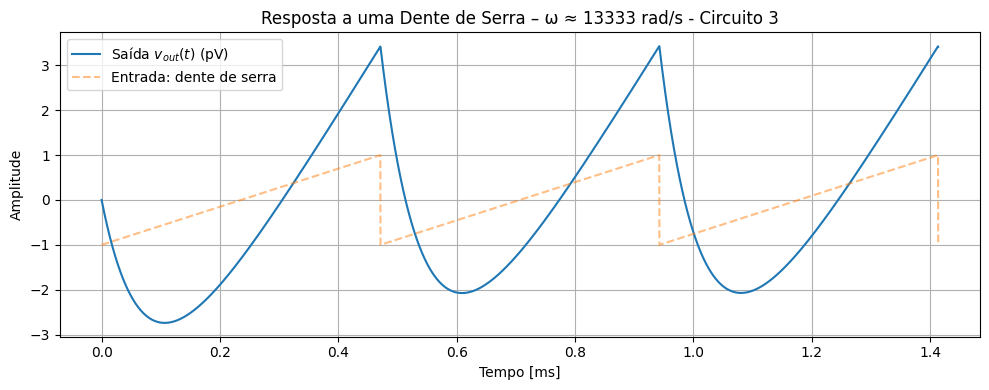

In [ ]:
# ── Parâmetros do circuito ──────────────────────────────────────────
R1 = R2 = 10e3           # 10 kΩ
C1 = 100e-9              # 100 nF
C2 = 15e-9               # 15 nF
K       = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2
system  = signal.TransferFunction([K], [1, omega_0])

# ── Frequência fundamental da dente de serra ────────────────────────
f0 = omega_0 / (2 * np.pi)   # Hz  (escolha "sábia": f = ω₀/2π)
T  = 1 / f0
t  = np.linspace(0, 3*T, 6000)

# ── Geração da onda dente de serra ──────────────────────────────────
u = signal.sawtooth(2 * np.pi * f0 * t)        # amplitude ±1

# ── Resposta do sistema ─────────────────────────────────────────────
t_out, y, _ = signal.lsim(system, U=u, T=t)

# ── Gráfico (escala em pico-volts para visualizar) ─────────────────-
plt.figure(figsize=(10, 4))
plt.plot(t*1e3, y*1e12, label='Saída $v_{out}(t)$ (pV)')
plt.plot(t*1e3, u, '--', alpha=0.5, label='Entrada: dente de serra')
plt.title(f'Resposta a uma Dente de Serra – ω ≈ {omega_0:.0f} rad/s - Circuito 3')
plt.xlabel('Tempo [ms]')
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra Q - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

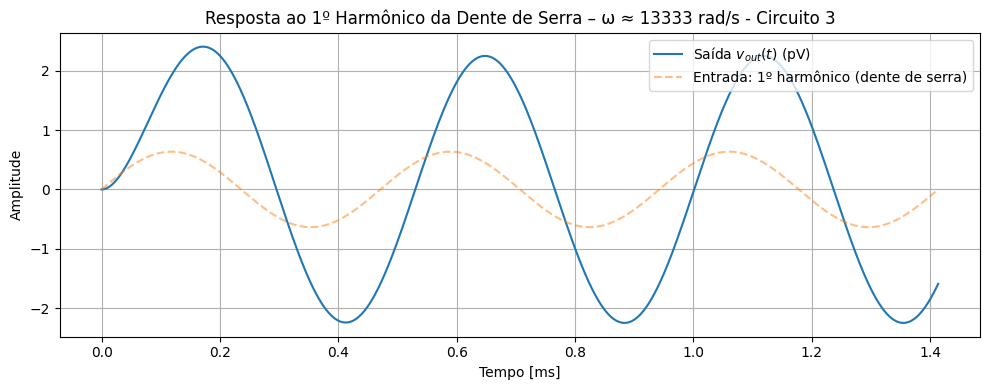

In [ ]:
# ── Parâmetros do circuito ─────────────────────────────────────────────
R1 = R2 = 10e3           # 10 kΩ
C1 = 100e-9              # 100 nF
C2 = 15e-9               # 15 nF

# Função de transferência: H(s) = K / (s + ω₀)
K       = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2
system  = signal.TransferFunction([K], [1, omega_0])

# ── Frequência fundamental da dente de serra ───────────────────────────
f0 = omega_0 / (2 * np.pi)  # Hz
T  = 1 / f0
t  = np.linspace(0, 3*T, 6000)

# ── Entrada: 1º harmônico da dente de serra ────────────────────────────
# Série de Fourier: x₁(t) = (2/π)·sin(ωt)
u = (2 / np.pi) * np.sin(2 * np.pi * f0 * t)

# ── Resposta do sistema ────────────────────────────────────────────────
t_out, y, _ = signal.lsim(system, U=u, T=t)

# ── Gráfico da resposta ────────────────────────────────────────────────
plt.figure(figsize=(10, 4))
plt.plot(t * 1e3, y * 1e12, label='Saída $v_{out}(t)$ (pV)')
plt.plot(t * 1e3, u, '--', label='Entrada: 1º harmônico (dente de serra)', alpha=0.5)
plt.title(f'Resposta ao 1º Harmônico da Dente de Serra – ω ≈ {omega_0:.0f} rad/s - Circuito 3')
plt.xlabel('Tempo [ms]')
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra R - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

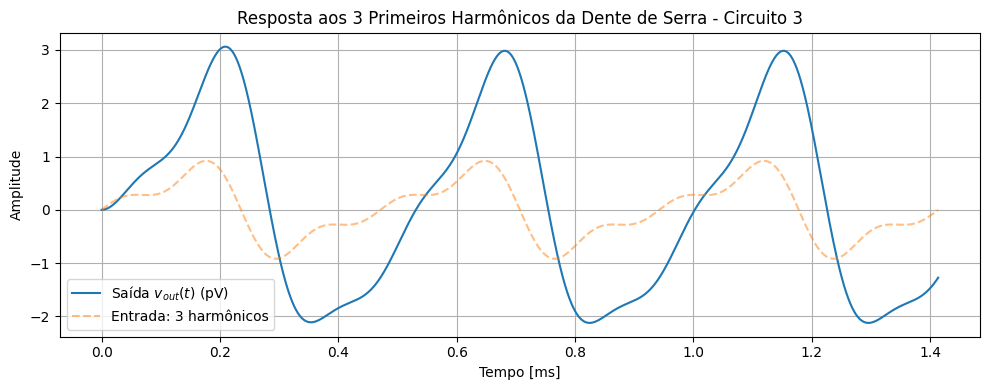

In [ ]:
# ── Parâmetros do circuito ──────────────────────────────────────────────
R1 = R2 = 10e3            # 10 kΩ
C1 = 100e-9               # 100 nF
C2 = 15e-9                # 15 nF

K = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2
system  = signal.TransferFunction([K], [1, omega_0])

# ── Frequência fundamental (escolhemos ω = ω0) ──────────────────────────
f0 = omega_0 / (2*np.pi)      # Hz
T  = 1 / f0
t  = np.linspace(0, 3*T, 6000)

# ── Entrada: 3 primeiros harmônicos (k = 1,2,3) da dente de serra ───────
u = np.zeros_like(t)
for k in [1, 2, 3]:
    coef = (2 / np.pi) * ((-1)**(k+1) / k)
    u += coef * np.sin(2 * np.pi * f0 * k * t)

# ── Resposta do sistema ─────────────────────────────────────────────────
t_out, y, _ = signal.lsim(system, U=u, T=t)

# ── Gráfico (saída em pico-volts p/ visibilidade) ───────────────────────
plt.figure(figsize=(10, 4))
plt.plot(t*1e3, y*1e12, label='Saída $v_{out}(t)$ (pV)')
plt.plot(t*1e3, u, '--', alpha=0.5, label='Entrada: 3 harmônicos')
plt.title('Resposta aos 3 Primeiros Harmônicos da Dente de Serra - Circuito 3')
plt.xlabel('Tempo [ms]')
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra S - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

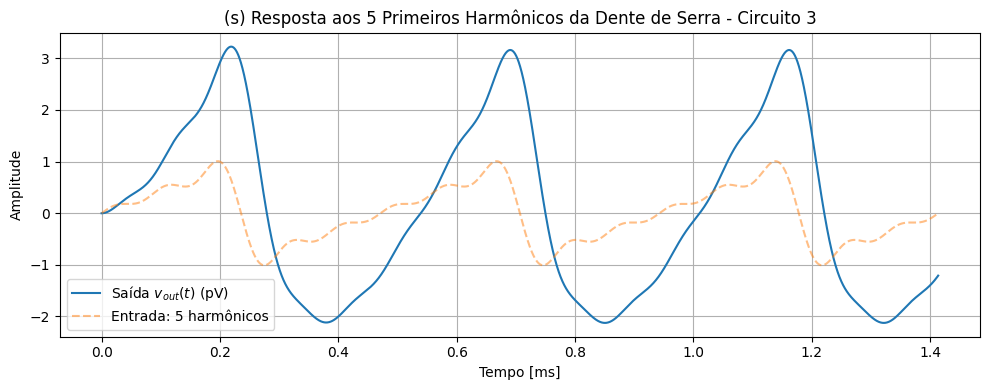

In [ ]:
# ─── Parâmetros do circuito ──────────────────────────────────────────────
R1 = R2 = 10e3         # 10 kΩ
C1 = 100e-9            # 100 nF
C2 = 15e-9             # 15 nF

K       = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2
system  = signal.TransferFunction([K], [1, omega_0])

# ─── Frequência fundamental ──────────────────────────────────────────────
f0 = omega_0 / (2 * np.pi)   # Hz
T  = 1 / f0
t  = np.linspace(0, 3*T, 6000)

# ─── Série de Fourier: 5 primeiros harmônicos da dente de serra ─────────
u = np.zeros_like(t)
for k in range(1, 6):  # k = 1, 2, 3, 4, 5
    coef = (2 / np.pi) * ((-1)**(k + 1) / k)
    u += coef * np.sin(2 * np.pi * f0 * k * t)

# ─── Resposta do sistema ─────────────────────────────────────────────────
t_out, y, _ = signal.lsim(system, U=u, T=t)

# ─── Gráfico ─────────────────────────────────────────────────────────────
plt.figure(figsize=(10, 4))
plt.plot(t*1e3, y*1e12, label='Saída $v_{out}(t)$ (pV)')
plt.plot(t*1e3, u, '--', label='Entrada: 5 harmônicos', alpha=0.5)
plt.title('(s) Resposta aos 5 Primeiros Harmônicos da Dente de Serra - Circuito 3')
plt.xlabel('Tempo [ms]')
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra T - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

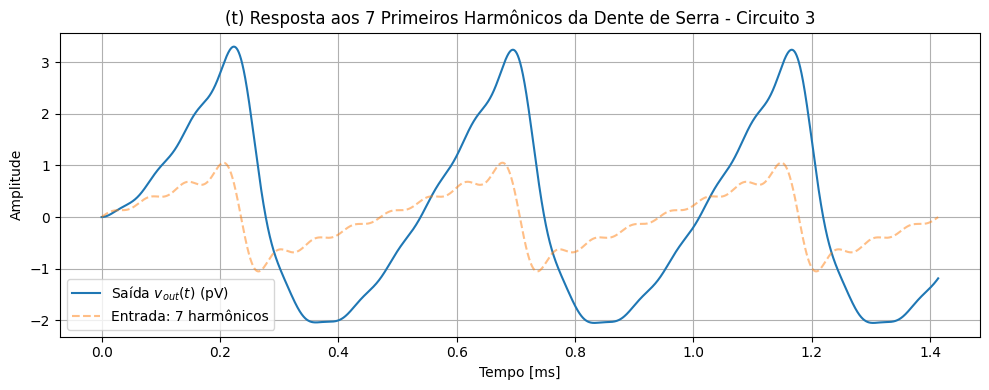

In [ ]:
# ─── Parâmetros do circuito ──────────────────────────────────────────────
R1 = R2 = 10e3           # 10 kΩ
C1 = 100e-9              # 100 nF
C2 = 15e-9               # 15 nF

K = C1 / (C2 * R1 * R2)
omega_0 = (1/R1 + 1/R2) / C2
system  = signal.TransferFunction([K], [1, omega_0])

# ─── Frequência fundamental da onda dente de serra ───────────────────────
f0 = omega_0 / (2 * np.pi)   # Hz
T  = 1 / f0
t  = np.linspace(0, 3*T, 6000)

# ─── Entrada: 7 primeiros harmônicos da dente de serra ──────────────────
u = np.zeros_like(t)
for k in range(1, 8):  # k = 1 a 7
    coef = (2 / np.pi) * ((-1)**(k + 1) / k)
    u += coef * np.sin(2 * np.pi * f0 * k * t)

# ─── Resposta do sistema ─────────────────────────────────────────────────
t_out, y, _ = signal.lsim(system, U=u, T=t)

# ─── Gráfico (saída em pico-volts para visualização) ────────────────────
plt.figure(figsize=(10, 4))
plt.plot(t*1e3, y*1e12, label='Saída $v_{out}(t)$ (pV)')
plt.plot(t*1e3, u, '--', label='Entrada: 7 harmônicos', alpha=0.5)
plt.title('(t) Resposta aos 7 Primeiros Harmônicos da Dente de Serra - Circuito 3')
plt.xlabel('Tempo [ms]')
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### Circuito 4

Com base no desenvolvimento presente no PDF do Trabalho Escrito, a função de transferência é: $H(s) = 1$.

#### Letra G - Diagrama de Pólos e Zeros

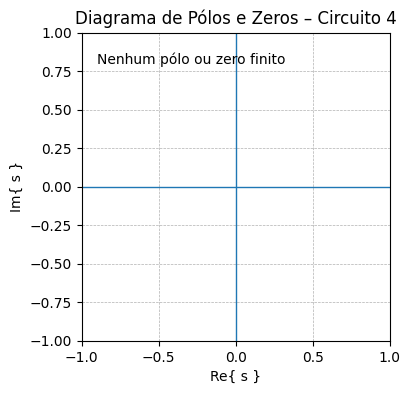

In [ ]:
# Cria a figura e o eixo
fig, ax = plt.subplots(figsize=(4, 4))

# Desenha os eixos real e imaginário
ax.axhline(0, linewidth=1)  # eixo Im{s}
ax.axvline(0, linewidth=1)  # eixo Re{s}

# Mensagem explicativa
ax.text(0.05, 0.9,
        "Nenhum pólo ou zero finito",
        transform=ax.transAxes)

# Configurações estéticas
ax.set_title("Diagrama de Pólos e Zeros – Circuito 4")
ax.set_xlabel("Re{ s }")
ax.set_ylabel("Im{ s }")
ax.set_xlim(-1, 1)
ax.set_ylim(-1, 1)
ax.set_aspect('equal', adjustable='box')
ax.grid(True, linestyle='--', linewidth=0.5)

# Exibe o gráfico
plt.show()

####Letra H - Diagrama de Bode

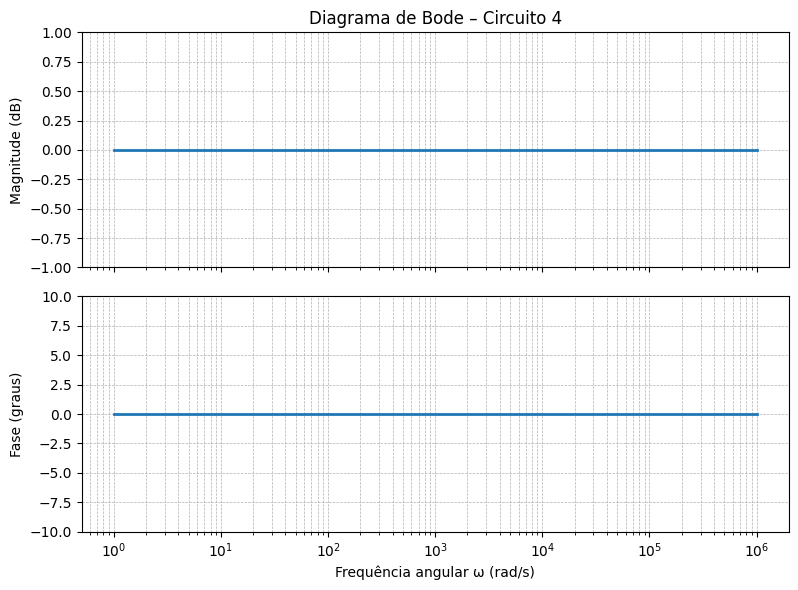

In [ ]:
# ---------------------------------------------
# 1) Faixa de frequência (rad/s) – escala log
# ---------------------------------------------
w = np.logspace(0, 6, 1000)          # 1 rad/s a 1 M rad/s

# ---------------------------------------------
# 2) Função de transferência H(s) = 1
#    →  |H| = 1  →  0 dB
#    →  ∠H = 0°
# ---------------------------------------------
H_mag_db    = 20 * np.log10(np.ones_like(w))  # 0 dB
H_phase_deg = np.zeros_like(w)                # 0°

# ---------------------------------------------
# 3) Criação de subplots (2 linhas, 1 coluna)
# ---------------------------------------------
fig, axs = plt.subplots(2, 1,
                        figsize=(8, 6),
                        sharex=True)

# --- Magnitude ---
axs[0].semilogx(w, H_mag_db, linewidth=2)
axs[0].set_title('Diagrama de Bode – Circuito 4')
axs[0].set_ylabel('Magnitude (dB)')
axs[0].grid(True, which='both',
            linestyle='--', linewidth=0.5)
axs[0].set_ylim(-1, 1)               # zoom em torno de 0 dB

# --- Fase ---
axs[1].semilogx(w, H_phase_deg, linewidth=2)
axs[1].set_xlabel('Frequência angular ω (rad/s)')
axs[1].set_ylabel('Fase (graus)')
axs[1].grid(True, which='both',
            linestyle='--', linewidth=0.5)
axs[1].set_ylim(-10, 10)             # zoom em torno de 0°

plt.tight_layout()
plt.show()

#### Letra I - Resposta ao Degrau Unitário

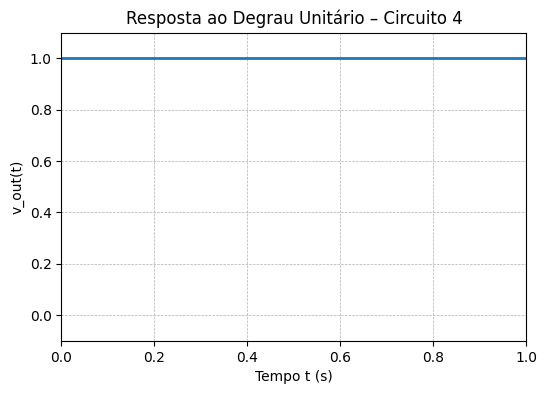

In [ ]:
# Vetor de tempo de 0 a 1 segundo com 1000 pontos
t = np.linspace(0, 1, 1000)

# Resposta ao degrau unitário: v_out(t) = 1 para t ≥ 0
y = np.ones_like(t)

# Plot da resposta
plt.figure(figsize=(6, 4))
plt.plot(t, y, linewidth=2)
plt.title('Resposta ao Degrau Unitário – Circuito 4')
plt.xlabel('Tempo t (s)')
plt.ylabel('v_out(t)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.ylim(-0.1, 1.1)
plt.xlim(0, 1)
plt.show()

#### Letra J - Resposta a Rampa Unitária

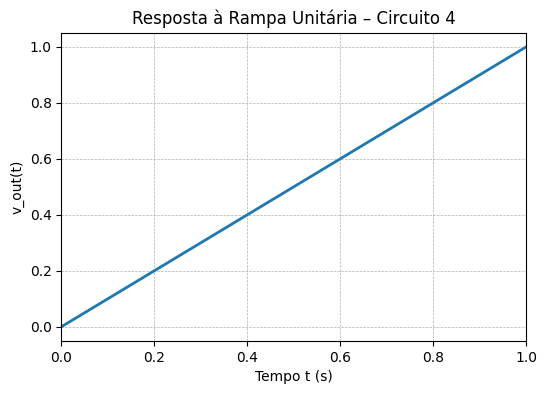

In [ ]:
# Vetor de tempo (0 a 1 s, 1000 pontos)
t = np.linspace(0, 1, 1000)

# Rampa unitária: v_out(t) = t para t ≥ 0
y = t  # porque H(s)=1 → saída = entrada

# Plot
plt.figure(figsize=(6, 4))
plt.plot(t, y, linewidth=2)
plt.title('Resposta à Rampa Unitária – Circuito 4')
plt.xlabel('Tempo t (s)')
plt.ylabel('v_out(t)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.ylim(-0.05, 1.05)
plt.xlim(0, 1)
plt.show()

#### Letra K - Resposta à uma Onda Quadrada de Frequência ω

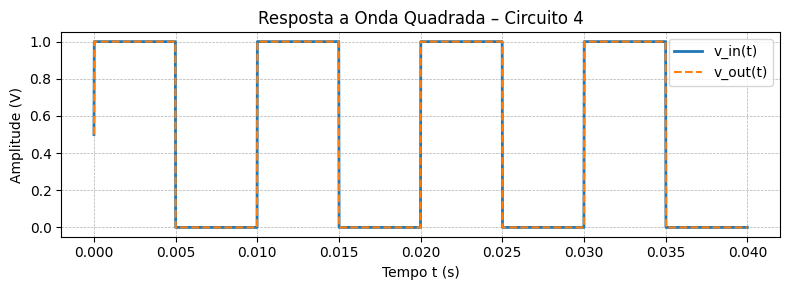

In [ ]:
# Parâmetros da onda
f = 100                       # Hz
omega = 2 * np.pi * f         # rad/s
T = 1 / f                     # período (s)

# Vetor de tempo: quatro períodos
t = np.linspace(0, 4 * T, 2000)

# Geração da onda quadrada unitária (0–1)
v_in = 0.5 * (np.sign(np.sin(omega * t)) + 1)

# Seguidor de tensão: saída = entrada
v_out = v_in

# Plot
plt.figure(figsize=(8, 3))
plt.plot(t, v_in, label='v_in(t)', linewidth=2)
plt.plot(t, v_out, '--', label='v_out(t)', linewidth=1.5)
plt.title('Resposta a Onda Quadrada – Circuito 4')
plt.xlabel('Tempo t (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

#### Letra L - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

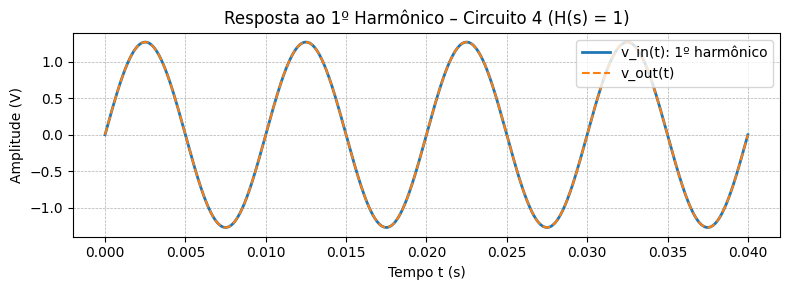

In [ ]:
# Frequência fundamental
f = 100                    # Hz
omega = 2 * np.pi * f      # rad/s
T = 1 / f                  # período (s)

# Vetor de tempo: 4 períodos
t = np.linspace(0, 4 * T, 2000)

# Primeiro harmônico da série de Fourier da onda quadrada
v_in = (4 / np.pi) * np.sin(omega * t)

# Saída (ganho unitário): v_out = v_in
v_out = v_in

# Gráfico
plt.figure(figsize=(8, 3))
plt.plot(t, v_in, label='v_in(t): 1º harmônico', linewidth=2)
plt.plot(t, v_out, '--', label='v_out(t)', linewidth=1.5)
plt.title('Resposta ao 1º Harmônico – Circuito 4 (H(s) = 1)')
plt.xlabel('Tempo t (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

#### Letra M - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

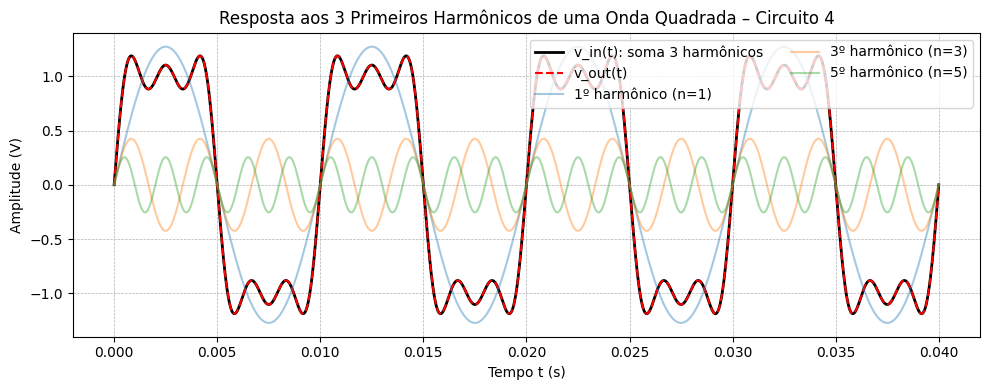

In [ ]:
f = 100                       # Hz (fundamental)
omega = 2 * np.pi * f         # rad/s
T = 1 / f                     # período fundamental
t = np.linspace(0, 4 * T, 2000)

# Harmônicos n = 1, 3, 5
v1 = (4 / np.pi)       * np.sin( 1 * omega * t)
v3 = (4 / (3 * np.pi)) * np.sin( 3 * omega * t)
v5 = (4 / (5 * np.pi)) * np.sin( 5 * omega * t)

# Sinal composto (entrada)
v_in  = v1 + v3 + v5
v_out = v_in            # H(s) = 1 → saída igual à entrada

plt.figure(figsize=(10, 4))
plt.plot(t, v_in, label='v_in(t): soma 3 harmônicos', linewidth=2, color='black')
plt.plot(t, v_out, '--', label='v_out(t)', linewidth=1.5, color='red')
plt.plot(t, v1, alpha=0.4, label='1º harmônico (n=1)')
plt.plot(t, v3, alpha=0.4, label='3º harmônico (n=3)')
plt.plot(t, v5, alpha=0.4, label='5º harmônico (n=5)')
plt.title('Resposta aos 3 Primeiros Harmônicos de uma Onda Quadrada – Circuito 4')
plt.xlabel('Tempo t (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend(loc='upper right', ncol=2)
plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

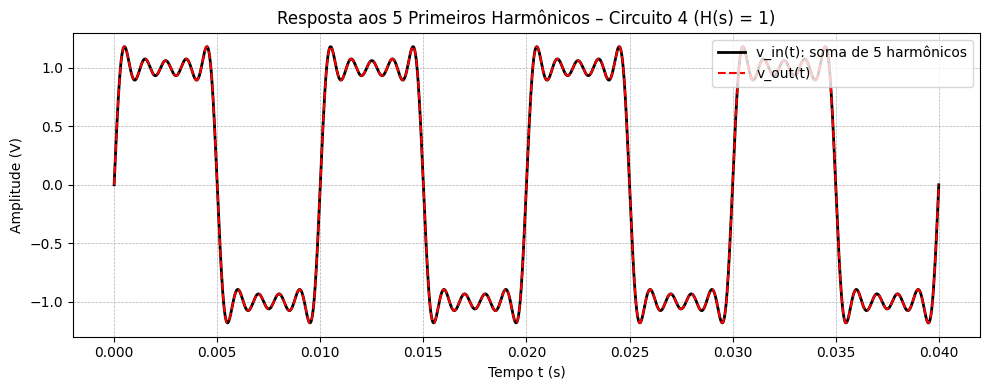

In [ ]:
# Parâmetros
f = 100                     # Hz
omega = 2 * np.pi * f       # rad/s
T = 1 / f
t = np.linspace(0, 4 * T, 2000)

# Harmônicos de ordem ímpar: n = 1, 3, 5, 7, 9
harmonics = [1, 3, 5, 7, 9]
v_in = np.zeros_like(t)

# Soma dos harmônicos
for n in harmonics:
    v_in += (4 / (n * np.pi)) * np.sin(n * omega * t)

# Saída do circuito (H(s)=1)
v_out = v_in

# Plot
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, label='v_in(t): soma de 5 harmônicos', linewidth=2, color='black')
plt.plot(t, v_out, '--', label='v_out(t)', linewidth=1.5, color='red')
plt.title('Resposta aos 5 Primeiros Harmônicos – Circuito 4 (H(s) = 1)')
plt.xlabel('Tempo t (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

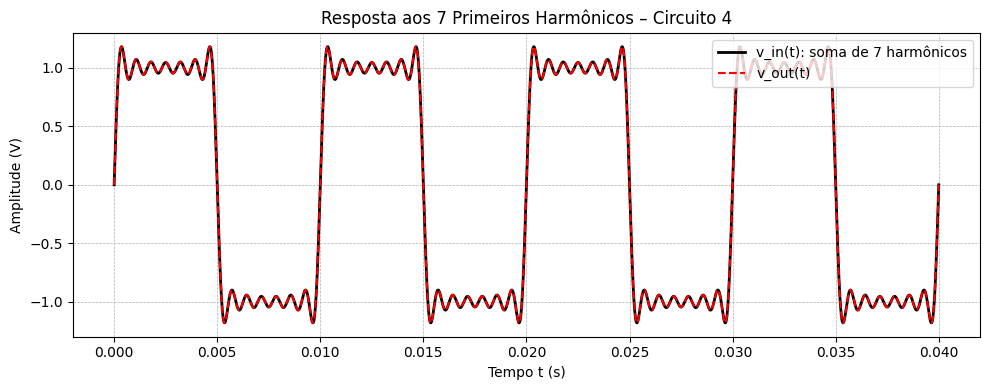

In [ ]:
# Parâmetros da onda quadrada
f = 100                      # Hz
omega = 2 * np.pi * f        # rad/s
T = 1 / f
t = np.linspace(0, 4 * T, 2000)

# Harmônicos: n = 1, 3, 5, 7, 9, 11, 13
harmonics = [1, 3, 5, 7, 9, 11, 13]
v_in = np.zeros_like(t)

# Soma dos 7 harmônicos
for n in harmonics:
    v_in += (4 / (n * np.pi)) * np.sin(n * omega * t)

# Saída do circuito (ganho unitário)
v_out = v_in

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, label='v_in(t): soma de 7 harmônicos', linewidth=2, color='black')
plt.plot(t, v_out, '--', label='v_out(t)', linewidth=1.5, color='red')
plt.title('Resposta aos 7 Primeiros Harmônicos – Circuito 4')
plt.xlabel('Tempo t (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

#### Letra P - Resposta a uma Dente de Serra de Frequência ω

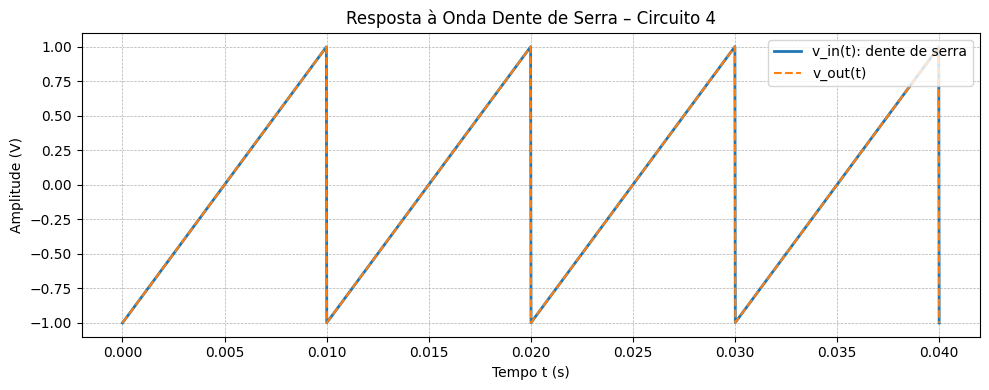

In [ ]:
# Frequência "sábia"
f = 100                      # Hz
omega = 2 * np.pi * f        # rad/s
T = 1 / f
t = np.linspace(0, 4 * T, 2000)

# Onda dente de serra normalizada (sobe linearmente de -1 a 1)
v_in = signal.sawtooth(omega * t, width=1)
v_out = v_in  # H(s) = 1 → saída = entrada

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, label='v_in(t): dente de serra', linewidth=2)
plt.plot(t, v_out, '--', label='v_out(t)', linewidth=1.5)
plt.title('Resposta à Onda Dente de Serra – Circuito 4')
plt.xlabel('Tempo t (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

#### Letra Q - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

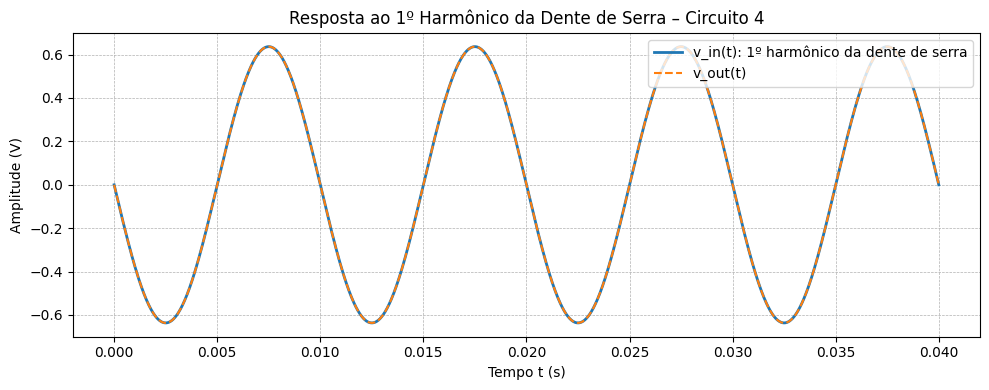

In [ ]:
# Frequência fundamental
f = 100                      # Hz
omega = 2 * np.pi * f
T = 1 / f
t = np.linspace(0, 4 * T, 2000)

# Primeiro harmônico da série de Fourier da dente de serra
v_in = - (2 / np.pi) * np.sin(omega * t)
v_out = v_in  # H(s) = 1

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, label='v_in(t): 1º harmônico da dente de serra', linewidth=2)
plt.plot(t, v_out, '--', label='v_out(t)', linewidth=1.5)
plt.title('Resposta ao 1º Harmônico da Dente de Serra – Circuito 4')
plt.xlabel('Tempo t (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

#### Letra R - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

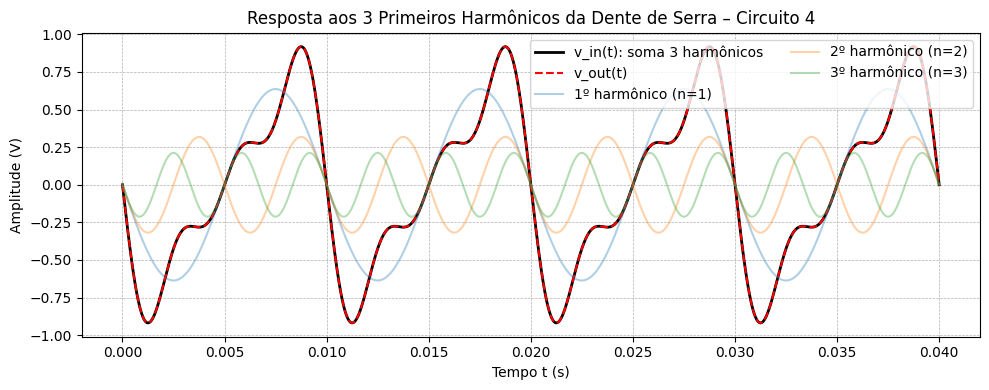

In [ ]:
# Parâmetros
f = 100      # Hz
omega = 2 * np.pi * f
T = 1 / f
t = np.linspace(0, 4 * T, 2000)

# Harmônicos n = 1, 2, 3
harmonics = [1, 2, 3]
v_in = np.zeros_like(t)

for n in harmonics:
    v_in += -(2 / (np.pi * n)) * np.sin(n * omega * t)

# Saída do seguidor de tensão
v_out = v_in

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, label='v_in(t): soma 3 harmônicos', linewidth=2, color='black')
plt.plot(t, v_out, '--', label='v_out(t)', linewidth=1.5, color='red')

# Componentes individuais (opcional)
for n in harmonics:
    plt.plot(t, -(2 / (np.pi * n)) * np.sin(n * omega * t),
             alpha=0.35, label=f'{n}º harmônico (n={n})')

plt.title('Resposta aos 3 Primeiros Harmônicos da Dente de Serra – Circuito 4')
plt.xlabel('Tempo t (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend(loc='upper right', ncol=2)
plt.tight_layout()
plt.show()

#### Letra S - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

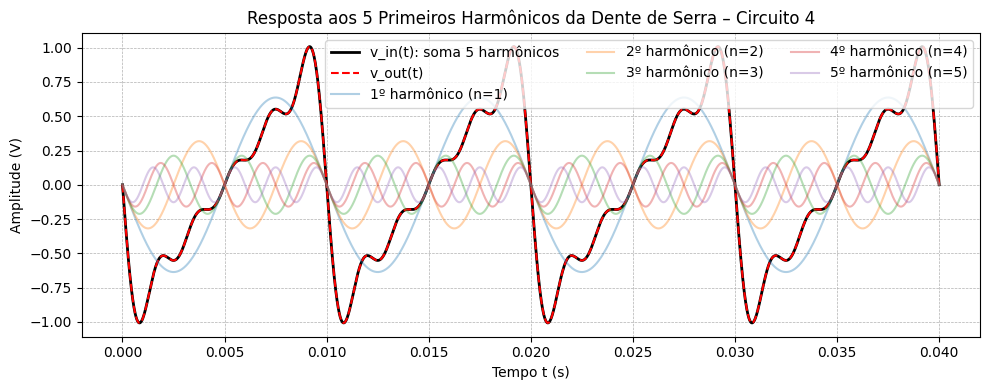

In [ ]:
# Frequência e tempo
f = 100
omega = 2 * np.pi * f
T = 1 / f
t = np.linspace(0, 4 * T, 2000)

# Harmônicos n = 1, 2, 3, 4, 5
harmonics = [1, 2, 3, 4, 5]
v_in = np.zeros_like(t)

# Soma dos harmônicos da série de Fourier
for n in harmonics:
    v_in += -(2 / (np.pi * n)) * np.sin(n * omega * t)

v_out = v_in  # H(s) = 1 → saída = entrada

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, label='v_in(t): soma 5 harmônicos', linewidth=2, color='black')
plt.plot(t, v_out, '--', label='v_out(t)', linewidth=1.5, color='red')

for n in harmonics:
    plt.plot(t, -(2 / (np.pi * n)) * np.sin(n * omega * t),
             alpha=0.35, label=f'{n}º harmônico (n={n})')

plt.title('Resposta aos 5 Primeiros Harmônicos da Dente de Serra – Circuito 4')
plt.xlabel('Tempo t (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend(loc='upper right', ncol=3)
plt.tight_layout()
plt.show()

#### Letra T - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

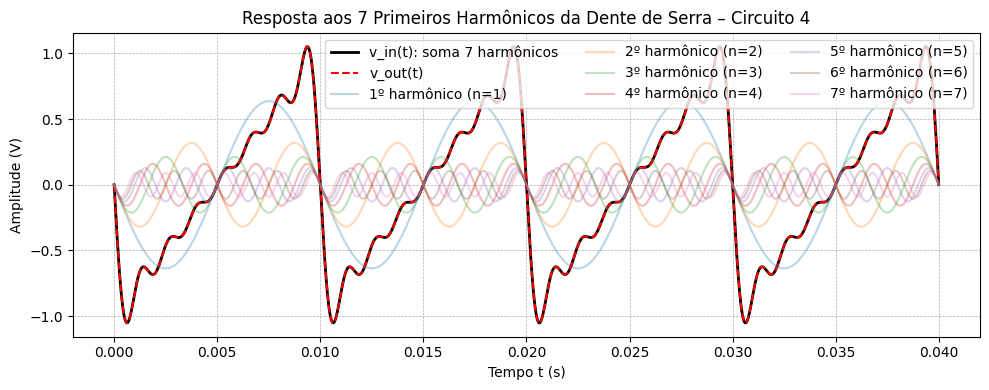

In [ ]:
f = 100
omega = 2 * np.pi * f
T = 1 / f
t = np.linspace(0, 4 * T, 2000)

# Harmônicos n = 1–7
harmonics = range(1, 8)
v_in = np.zeros_like(t)
for n in harmonics:
    v_in += -(2 / (np.pi * n)) * np.sin(n * omega * t)

v_out = v_in

plt.figure(figsize=(10, 4))
plt.plot(t, v_in, label='v_in(t): soma 7 harmônicos', linewidth=2, color='black')
plt.plot(t, v_out, '--', label='v_out(t)', linewidth=1.5, color='red')
for n in harmonics:
    plt.plot(t, -(2 / (np.pi * n)) * np.sin(n * omega * t),
             alpha=0.3, label=f'{n}º harmônico (n={n})')

plt.title('Resposta aos 7 Primeiros Harmônicos da Dente de Serra – Circuito 4')
plt.xlabel('Tempo t (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.legend(loc='upper right', ncol=3)
plt.tight_layout()
plt.show()

### Circuito 5

Com base no desenvolvimento presente no PDF do Trabalho Escrito, a função de transferência é: $H(s) = \frac{1}{R_{1}Cs}$.

<br>

Com os valores: $R_1 = 10k\Omega, C = 100\text{nF}$, temos: $H(s) = \frac{1}{0,001s}$

#### Letra G - Diagrama de Pólos e Zeros

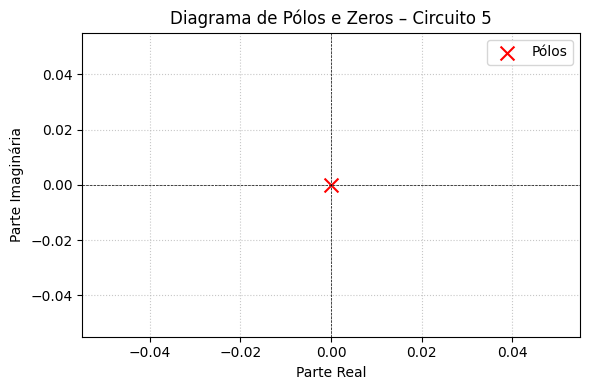

In [ ]:
# --- Parâmetros do circuito ---
R1 = 10e3       # 10 kΩ
C2 = 100e-9     # 100 nF

# --- Função de transferência H(s) = 1 / (R1 * C2 * s) ---
num = [1]
den = [R1 * C2, 0]  # H(s) = 1 / (0.001 * s)

# Criação do sistema de transferência
sys = signal.TransferFunction(num, den)

# Cálculo dos polos e zeros
zeros = np.roots(num)    # Nenhum zero finito
poles = np.roots(den)    # Polo em s = 0

# --- Plotagem ---
plt.figure(figsize=(6, 4))
plt.scatter(np.real(poles), np.imag(poles), marker='x', s=100, color='red', label='Pólos')
if zeros.size > 0:
    plt.scatter(np.real(zeros), np.imag(zeros), marker='o', s=100, facecolors='none', edgecolors='blue', label='Zeros')

plt.axhline(0, color='black', linestyle='--', linewidth=0.5)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5)

plt.title('Diagrama de Pólos e Zeros – Circuito 5')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginária')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

####Letra H - Diagrama de Bode

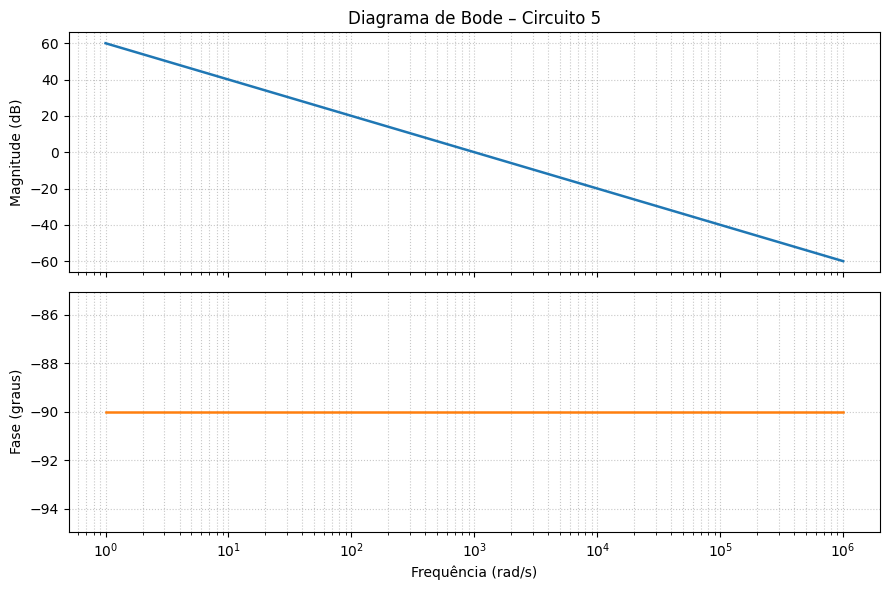

In [ ]:

# --------- parâmetros do circuito ----------
R1 = 10e3       # 10 kΩ
C2 = 100e-9     # 100 nF

# --------- H(s) = 1 / (R1·C2·s) -------------
num = [1]
den = [R1 * C2, 0]           # (R1·C2)·s

sys = signal.TransferFunction(num, den)

# --------- cálculo do Bode ------------------
w = np.logspace(0, 6, 1000)  # 1 rad/s → 1 M rad/s
w, mag, phase = signal.bode(sys, w)

# --------- gráfico --------------------------
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 6), sharex=True)

ax1.semilogx(w, mag, lw=1.8)
ax1.set_ylabel('Magnitude (dB)')
ax1.set_title('Diagrama de Bode – Circuito 5')
ax1.grid(which='both', ls=':', alpha=0.7)

ax2.semilogx(w, phase, color='tab:orange', lw=1.8)
ax2.set_ylabel('Fase (graus)')
ax2.set_xlabel('Frequência (rad/s)')
ax2.grid(which='both', ls=':', alpha=0.7)

plt.tight_layout()
plt.show()

#### Letra I - Resposta ao Degrau Unitário

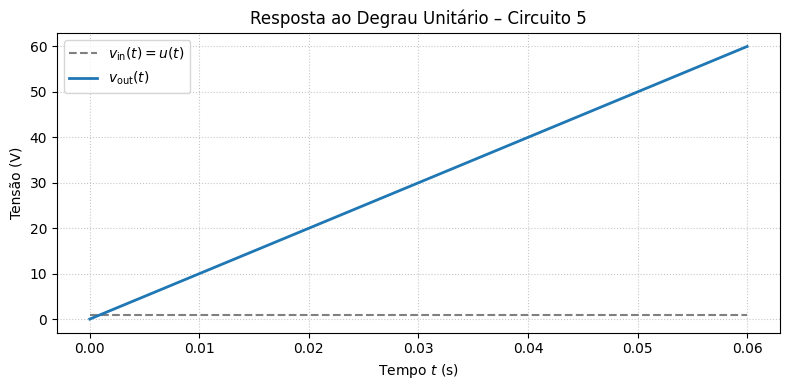

In [ ]:
# Parâmetros do circuito
R1 = 10e3        # 10 kΩ
C2 = 100e-9      # 100 nF

# Função de transferência H(s) = 1 / (R1 * C2 * s)
num = [1]
den = [R1 * C2, 0]
sys = signal.TransferFunction(num, den)

# Entrada: degrau unitário
t = np.linspace(0, 0.06, 1000)   # 0 a 60 ms
v_in = np.ones_like(t)          # u(t)

# Resposta ao degrau
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# Gráfico
plt.figure(figsize=(8, 4))
plt.plot(t, v_in, '--', color='gray', label=r'$v_{\mathrm{in}}(t)=u(t)$')
plt.plot(t_out, v_out, color='tab:blue', lw=2, label=r'$v_{\mathrm{out}}(t)$')
plt.title('Resposta ao Degrau Unitário – Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, ls=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra J - Resposta a Rampa Unitária

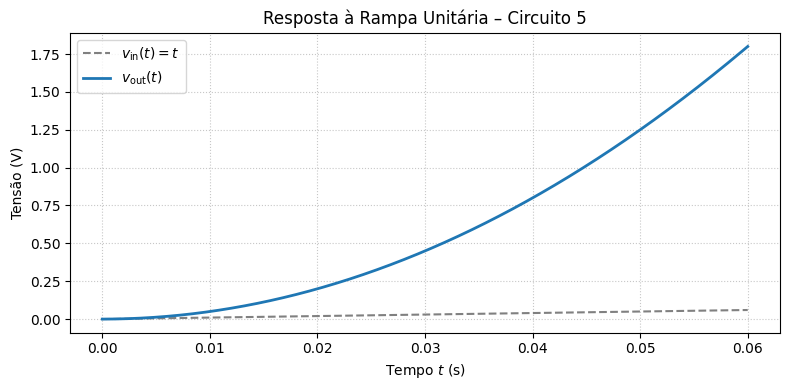

In [ ]:
# --- parâmetros do integrador ---
R1 = 10e3        # 10 kΩ
C2 = 100e-9      # 100 nF

# função de transferência: H(s) = 1 / (R1 * C2 * s)
num = [1]
den = [R1 * C2, 0]
sys = signal.TransferFunction(num, den)

# --- sinal de entrada: rampa unitária v_in(t) = t·u(t) ---
t = np.linspace(0, 0.06, 1000)     # 0 a 60 ms
v_in = t                           # rampa de inclinação 1 V/s

# --- resposta do sistema ---
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# --- plot ---
plt.figure(figsize=(8, 4))
plt.plot(t, v_in, '--', color='gray', label=r'$v_{\mathrm{in}}(t)=t$')
plt.plot(t_out, v_out, color='tab:blue', lw=2, label=r'$v_{\mathrm{out}}(t)$')
plt.title('Resposta à Rampa Unitária – Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, ls=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra K - Resposta a uma Onda Quadrada de Frequência ω

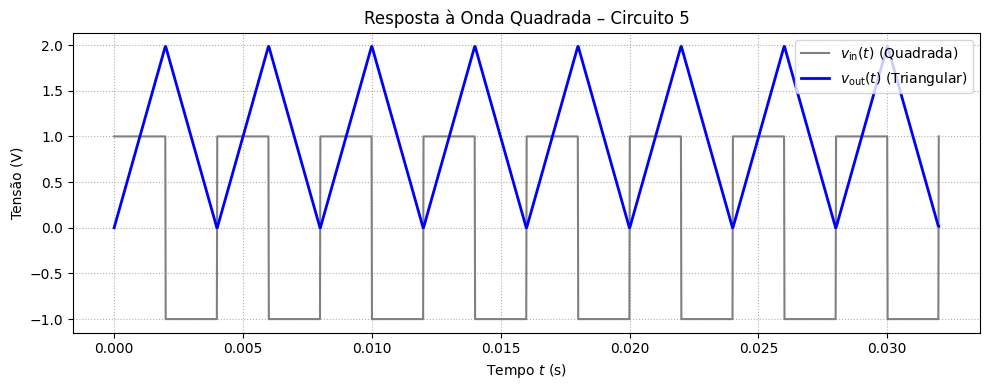

In [ ]:
# Parâmetros
R1 = 10e3        # 10 kΩ
C2 = 100e-9      # 100 nF
T = 4e-3         # Período da onda quadrada (4 ms)
f = 1 / T        # Frequência em Hz

# Sistema integrador
num = [1]
den = [R1 * C2, 0]
sys = signal.TransferFunction(num, den)

# Tempo de simulação
t = np.linspace(0, 8*T, 2000)  # 8 ciclos

# Entrada: onda quadrada de amplitude 1
v_in = signal.square(2 * np.pi * f * t)

# Resposta do sistema
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# Plotagem
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, 'gray', lw=1.5, label=r'$v_{\mathrm{in}}(t)$ (Quadrada)')
plt.plot(t_out, v_out, 'b', lw=2, label=r'$v_{\mathrm{out}}(t)$ (Triangular)')
plt.title('Resposta à Onda Quadrada – Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra L - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

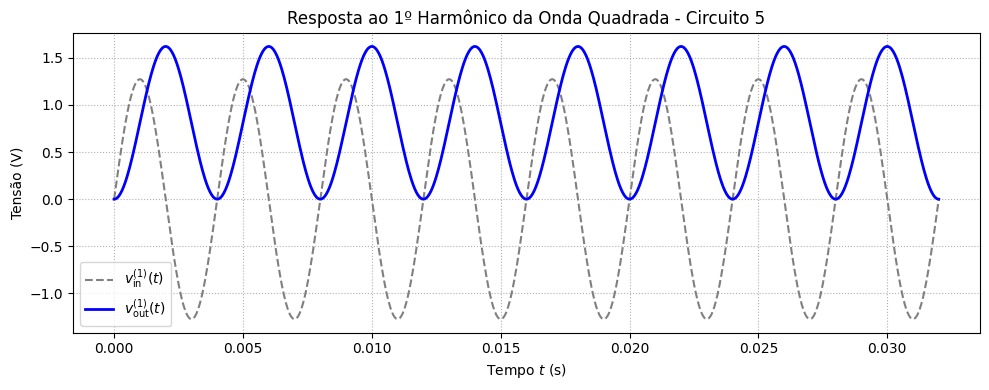

In [ ]:
# Parâmetros do circuito
R1 = 10e3       # 10 kΩ
C2 = 100e-9     # 100 nF
RC = R1 * C2

# Frequência do 1º harmônico
omega = 500 * np.pi    # rad/s
f = omega / (2 * np.pi)

# Entrada: primeiro harmônico da onda quadrada
t = np.linspace(0, 8 / f, 1000)
v_in = (4 / np.pi) * np.sin(omega * t)

# Sistema
num = [1]
den = [RC, 0]
sys = signal.TransferFunction(num, den)

# Resposta à entrada senoidal
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, '--', color='gray', label=r'$v_{\mathrm{in}}^{(1)}(t)$')
plt.plot(t_out, v_out, 'b', lw=2, label=r'$v_{\mathrm{out}}^{(1)}(t)$')
plt.title('Resposta ao 1º Harmônico da Onda Quadrada - Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra M - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

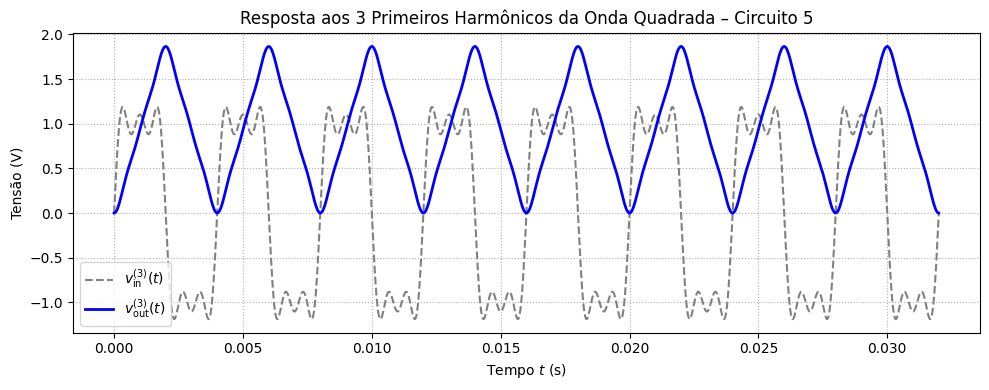

In [ ]:
# Parâmetros do circuito
R1 = 10e3        # 10 kΩ
C2 = 100e-9      # 100 nF
RC = R1 * C2

# Frequência fundamental
omega = 500 * np.pi
t = np.linspace(0, 8 / (omega / (2 * np.pi)), 2000)

# Entrada: 3 primeiros harmônicos (1, 3, 5)
v_in = (4 / np.pi) * (
    (1 / 1) * np.sin(1 * omega * t) +
    (1 / 3) * np.sin(3 * omega * t) +
    (1 / 5) * np.sin(5 * omega * t)
)

# Sistema integrador
num = [1]
den = [RC, 0]
sys = signal.TransferFunction(num, den)

# Resposta à soma dos harmônicos
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# Plotagem
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, '--', color='gray', label=r'$v_{\mathrm{in}}^{(3)}(t)$')
plt.plot(t_out, v_out, 'b', lw=2, label=r'$v_{\mathrm{out}}^{(3)}(t)$')
plt.title('Resposta aos 3 Primeiros Harmônicos da Onda Quadrada – Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

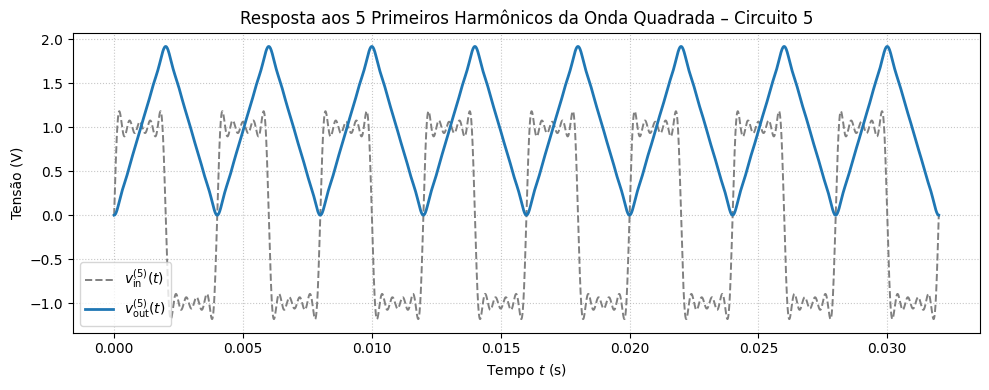

In [ ]:
# -------- parâmetros do circuito --------
R1 = 10e3          # 10 kΩ
C = 100e-9        # 100 nF
RC = R1 * C       # 1 ms

# -------- frequência fundamental --------
omega = 500 * np.pi            # rad/s  (f = 250 Hz)
f = omega / (2 * np.pi)
t = np.linspace(0, 8 / f, 4000)   # 8 períodos

# -------- entrada: 5 harmônicos ímpares -----------
harmonics = [1, 3, 5, 7, 9]
v_in = (4 / np.pi) * sum((1/n) * np.sin(n * omega * t) for n in harmonics)

# -------- sistema integrador ----------------------
num = [1]
den = [RC, 0]
sys = signal.TransferFunction(num, den)

# -------- resposta do sistema ---------------------
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# -------- plotagem -------------------------------
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, '--', color='gray', lw=1.4, label=r'$v_{\mathrm{in}}^{(5)}(t)$')
plt.plot(t_out, v_out, color='tab:blue', lw=2, label=r'$v_{\mathrm{out}}^{(5)}(t)$')
plt.title('Resposta aos 5 Primeiros Harmônicos da Onda Quadrada – Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, ls=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

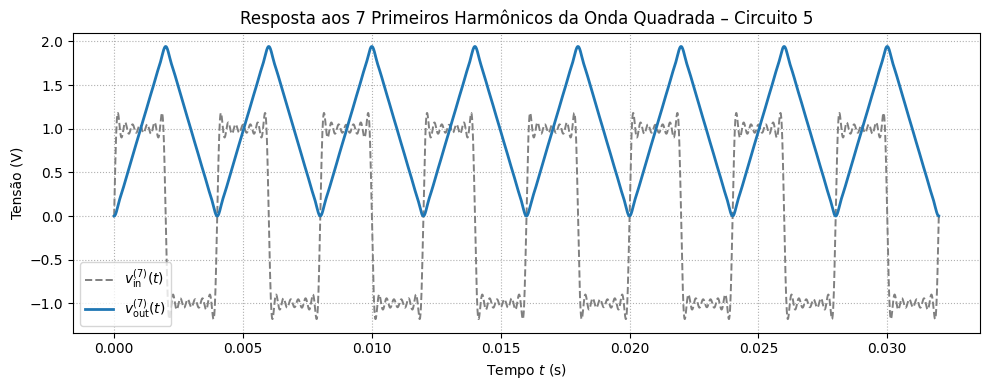

In [ ]:
# Parâmetros do circuito
R1 = 10e3         # 10 kΩ
C = 100e-9       # 100 nF
RC = R1 * C

# Frequência fundamental
omega = 500 * np.pi          # rad/s
f = omega / (2 * np.pi)
t = np.linspace(0, 8 / f, 4000)

# Entrada com 7 harmônicos ímpares: n = 1, 3, 5, 7, 9, 11, 13
harmonics = [1, 3, 5, 7, 9, 11, 13]
v_in = (4 / np.pi) * sum((1/n) * np.sin(n * omega * t) for n in harmonics)

# Sistema integrador
num = [1]
den = [RC, 0]
sys = signal.TransferFunction(num, den)

# Resposta à entrada harmônica
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# Plotagem
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, '--', color='gray', lw=1.4, label=r'$v_{\mathrm{in}}^{(7)}(t)$')
plt.plot(t_out, v_out, 'tab:blue', lw=2, label=r'$v_{\mathrm{out}}^{(7)}(t)$')
plt.title('Resposta aos 7 Primeiros Harmônicos da Onda Quadrada – Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra P - Resposta a uma Dente de Serra de Frequência ω

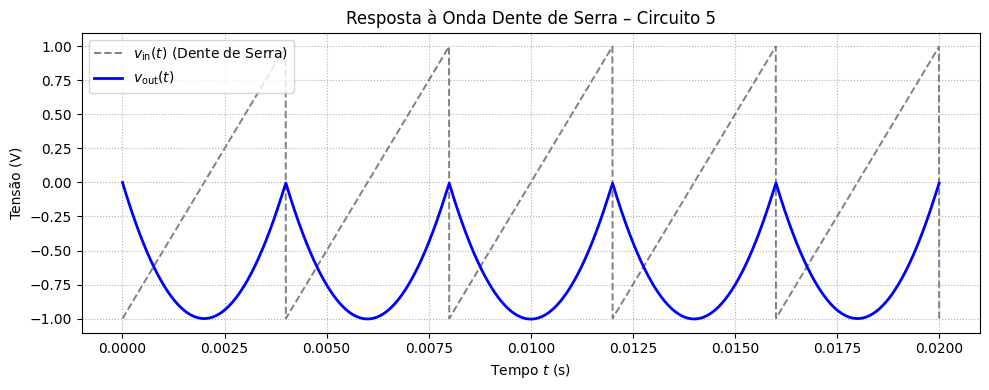

In [ ]:
# Parâmetros do circuito
R1 = 10e3          # 10 kΩ
C = 100e-9        # 100 nF
RC = R1 * C

# Frequência e tempo
omega = 500 * np.pi
f = omega / (2 * np.pi)
T = 1 / f
t = np.linspace(0, 5*T, 4000)

# Geração da onda dente de serra normalizada (-1 a 1)
v_in = signal.sawtooth(omega * t, width=1.0)

# Sistema integrador
num = [1]
den = [RC, 0]
sys = signal.TransferFunction(num, den)

# Resposta à entrada
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# Plotagem
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, '--', color='gray', lw=1.4, label=r'$v_{\mathrm{in}}(t)$ (Dente de Serra)')
plt.plot(t_out, v_out, 'b', lw=2, label=r'$v_{\mathrm{out}}(t)$')
plt.title('Resposta à Onda Dente de Serra – Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra Q - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

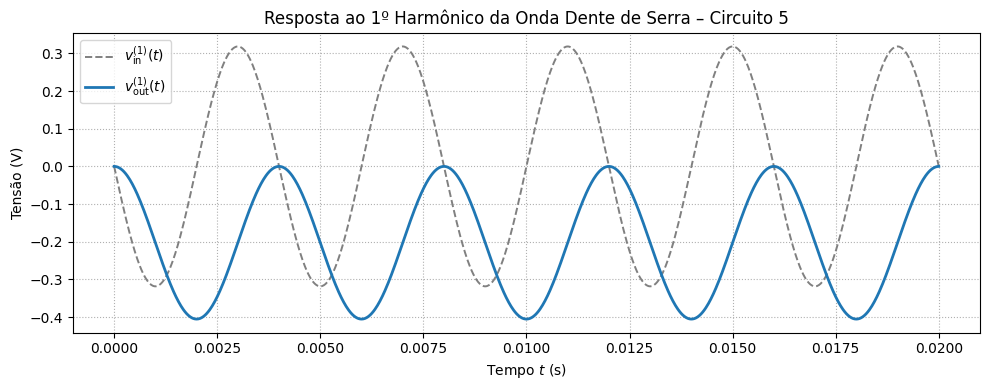

In [ ]:
# Parâmetros do circuito
R1 = 10e3        # 10 kΩ
C = 100e-9      # 100 nF
RC = R1 * C

# Frequência fundamental
omega = 500 * np.pi
f = omega / (2 * np.pi)
t = np.linspace(0, 5 / f, 1000)

# Primeiro harmônico da onda dente de serra
v_in = -(1 / np.pi) * np.sin(omega * t)

# Sistema integrador
num = [1]
den = [RC, 0]
sys = signal.TransferFunction(num, den)

# Resposta do sistema
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# Plotagem
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, '--', color='gray', lw=1.4, label=r'$v_{\mathrm{in}}^{(1)}(t)$')
plt.plot(t_out, v_out, 'tab:blue', lw=2, label=r'$v_{\mathrm{out}}^{(1)}(t)$')
plt.title('Resposta ao 1º Harmônico da Onda Dente de Serra – Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()


#### Letra R - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

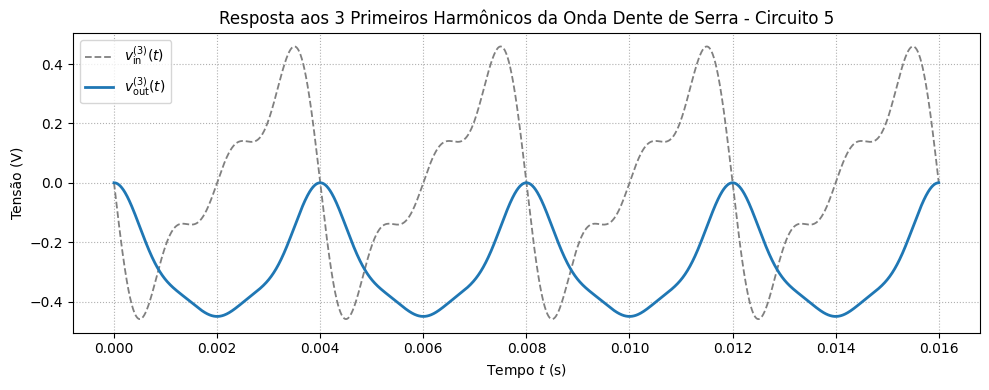

In [ ]:
# Parâmetros do circuito
R1 = 10e3         # 10 kΩ
C = 100e-9       # 100 nF
RC = R1 * C

# Frequência base
omega = 500 * np.pi
f = omega / (2 * np.pi)
t = np.linspace(0, 4 / f, 2000)

# Entrada com 3 primeiros harmônicos da dente de serra
v_in = -(1 / np.pi) * (
    np.sin(omega * t) +
    (1/2) * np.sin(2 * omega * t) +
    (1/3) * np.sin(3 * omega * t)
)

# Sistema integrador
num = [1]
den = [RC, 0]
sys = signal.TransferFunction(num, den)

# Resposta do sistema
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# Plotagem
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, '--', color='gray', lw=1.3, label=r'$v_{\mathrm{in}}^{(3)}(t)$')
plt.plot(t_out, v_out, 'tab:blue', lw=2, label=r'$v_{\mathrm{out}}^{(3)}(t)$')
plt.title('Resposta aos 3 Primeiros Harmônicos da Onda Dente de Serra - Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()


#### Letra S - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

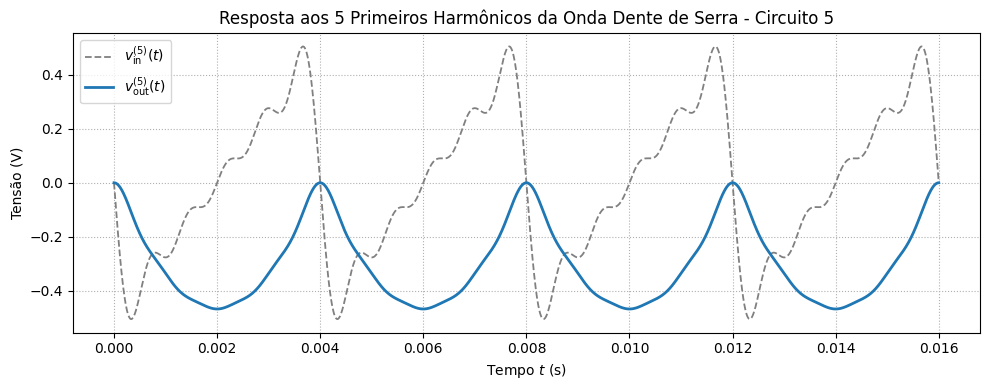

In [ ]:
# Parâmetros do circuito
R1 = 10e3       # 10 kΩ
C = 100e-9      # 100 nF
RC = R1 * C

# Frequência fundamental
omega = 500 * np.pi
f = omega / (2 * np.pi)
t = np.linspace(0, 4 / f, 2000)

# Construção da entrada com os 5 primeiros harmônicos
v_in = -(1 / np.pi) * sum(
    (1 / n) * np.sin(n * omega * t) for n in range(1, 6)
)

# Sistema integrador
num = [1]
den = [RC, 0]
sys = signal.TransferFunction(num, den)

# Resposta do sistema
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# Plotagem
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, '--', color='gray', lw=1.3, label=r'$v_{\mathrm{in}}^{(5)}(t)$')
plt.plot(t_out, v_out, 'tab:blue', lw=2, label=r'$v_{\mathrm{out}}^{(5)}(t)$')
plt.title('Resposta aos 5 Primeiros Harmônicos da Onda Dente de Serra - Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra T - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

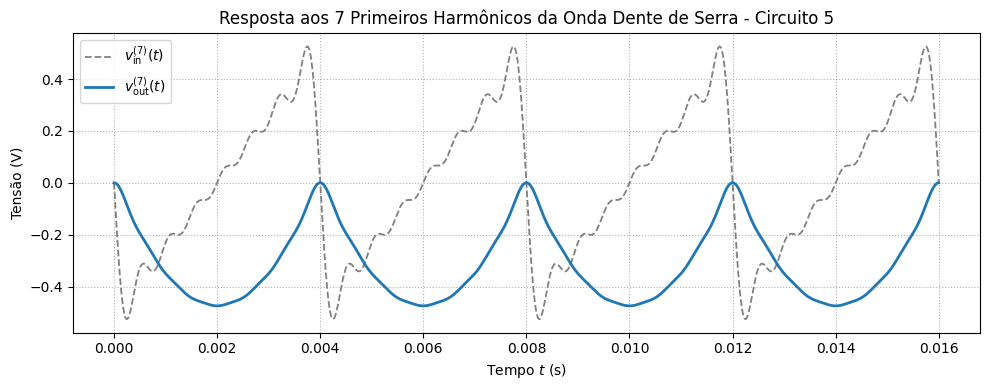

In [ ]:
# Parâmetros do circuito
R1 = 10e3       # 10 kΩ
C = 100e-9      # 100 nF
RC = R1 * C

# Frequência angular e tempo
omega = 500 * np.pi
f = omega / (2 * np.pi)
t = np.linspace(0, 4 / f, 3000)

# Construção do sinal com 7 harmônicos
v_in = -(1 / np.pi) * sum(
    (1 / n) * np.sin(n * omega * t) for n in range(1, 8)
)

# Sistema integrador
num = [1]
den = [RC, 0]
sys = signal.TransferFunction(num, den)

# Resposta do sistema
t_out, v_out, _ = signal.lsim(sys, U=v_in, T=t)

# Plotagem
plt.figure(figsize=(10, 4))
plt.plot(t, v_in, '--', lw=1.3, color='gray', label=r'$v_{\mathrm{in}}^{(7)}(t)$')
plt.plot(t_out, v_out, 'tab:blue', lw=2, label=r'$v_{\mathrm{out}}^{(7)}(t)$')
plt.title('Resposta aos 7 Primeiros Harmônicos da Onda Dente de Serra - Circuito 5')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('Tensão (V)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Circuito 6

Com base no desenvolvimento presente no PDF do Trabalho Escrito, a função de transferência é: $H(s) = \frac{\frac{1}{RC}}{s^2+\frac{3}{RC}s+\frac{1}{R^2C^2}}$.

<br>

Com os valores: $R_1 = 10k\Omega, C = 15\text{nF}$

#### Letra G - Diagrama de Pólos e Zeros

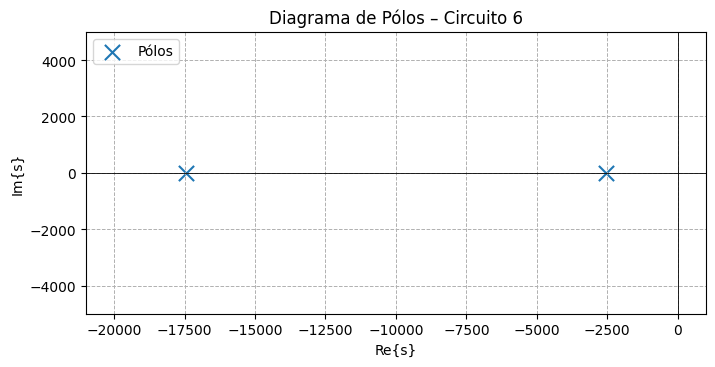

In [ ]:
# Coeficientes do denominador de H(s) = 6666.67 / (s² + 2e4 s + 4.44e7)
a = 1
b = 20_000
c = 4.44e7

# Cálculo das raízes do denominador  (pólos)
delta = b**2 - 4*a*c
s1 = (-b + np.sqrt(delta)) / (2*a)
s2 = (-b - np.sqrt(delta)) / (2*a)

# Plot do plano-s
plt.figure(figsize=(8, 6))
plt.axhline(0, color='black', linewidth=0.6)  # eixo imaginário
plt.axvline(0, color='black', linewidth=0.6)  # eixo real
plt.scatter([s1, s2], [0, 0], marker='x', s=120, label='Pólos')
plt.title('Diagrama de Pólos – Circuito 6')
plt.xlabel('Re{s}')
plt.ylabel('Im{s}')
plt.grid(True, which='both', linestyle='--', linewidth=0.7)
plt.legend()
plt.xlim(-21000, 1000)
plt.ylim(-5000, 5000)
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

####Letra H - Diagrama de Bode

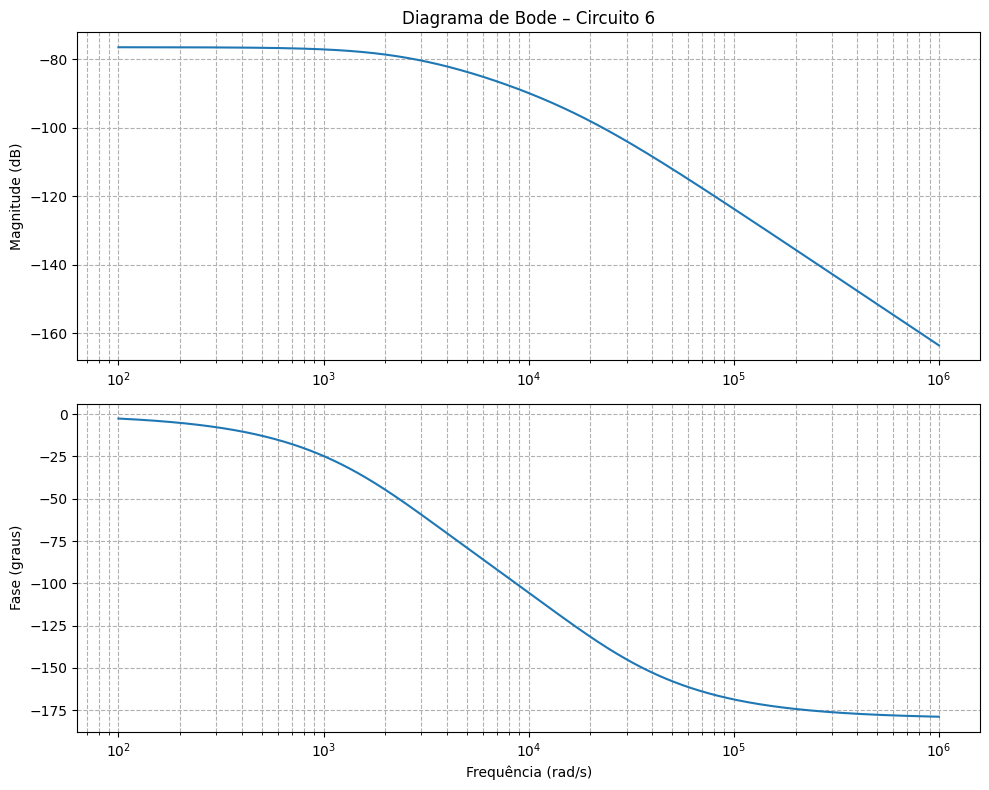

In [ ]:
# ------ parâmetros do circuito ------
R = 10e3      # 10 kΩ
C = 15e-9     # 15 nF

# ------ função de transferência H(s) ------
num = [1 / (R * C)]                 # 1 / (RC)
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]

system = signal.TransferFunction(num, den)

# ------ varredura de frequência ------
w = np.logspace(2, 6, 1000)         # 10² a 10⁶ rad/s
w, mag, phase = signal.bode(system, w)

# ------ gráfico combinado ------
plt.figure(figsize=(10, 8))

# Magnitude
plt.subplot(2, 1, 1)
plt.semilogx(w, mag)
plt.title('Diagrama de Bode – Circuito 6')
plt.ylabel('Magnitude (dB)')
plt.grid(True, which='both', linestyle='--')

# Fase
plt.subplot(2, 1, 2)
plt.semilogx(w, phase)
plt.xlabel('Frequência (rad/s)')
plt.ylabel('Fase (graus)')
plt.grid(True, which='both', linestyle='--')

plt.tight_layout()
plt.show()

#### Letra I - Resposta ao Degrau Unitário

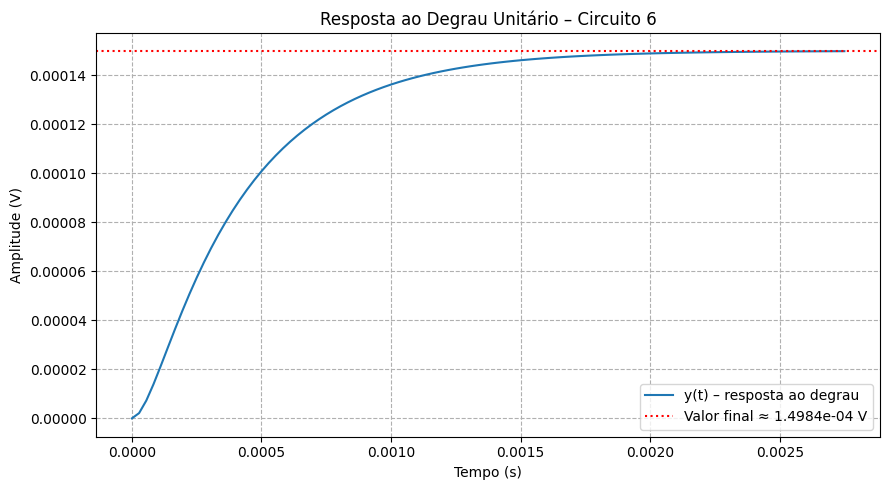

In [ ]:
# --- parâmetros do circuito ---
R = 10e3       # 10 kΩ
C = 15e-9      # 15 nF

# --- função de transferência H(s) ---
num = [1 / (R * C)]                       # 1/RC
den = [1, 3 / (R * C), 1 / (R**2 * C**2)] # s² + (3/RC)s + 1/(R²C²)
sys = signal.TransferFunction(num, den)

# --- resposta ao degrau unitário ---
t, y = signal.step(sys)

# --- plot ---
plt.figure(figsize=(9, 5))
plt.plot(t, y, label='y(t) – resposta ao degrau')
plt.axhline(y[-1], color='r', ls=':', label=f'Valor final ≈ {y[-1]:.4e} V')
plt.title('Resposta ao Degrau Unitário – Circuito 6')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, ls='--')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra J - Resposta a Rampa Unitária

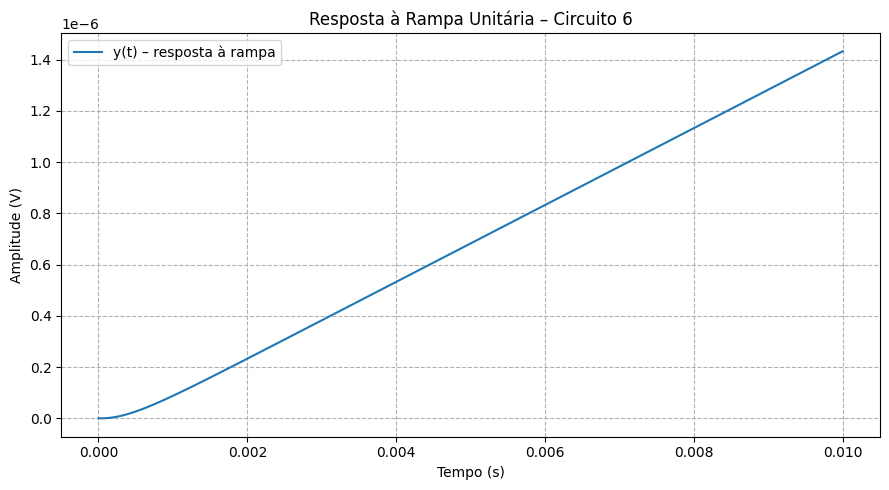

In [ ]:
# --- parâmetros do circuito ---
R = 10e3       # 10 kΩ
C = 15e-9      # 15 nF

# --- função de transferência H(s) = (1/RC)/(s² + (3/RC)s + 1/(R²C²)) ---
num = [1 / (R * C)]
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]
sys = signal.TransferFunction(num, den)

# --- entrada: rampa unitária x(t) = t·u(t) ---
t = np.linspace(0, 0.01, 1000)   # 0–10 ms
u = t                             # rampa

# --- resposta usando lsim ---
t_out, y_out, _ = signal.lsim(sys, U=u, T=t)

# --- gráfico ---
plt.figure(figsize=(9, 5))
plt.plot(t_out, y_out, label='y(t) – resposta à rampa')
plt.title('Resposta à Rampa Unitária – Circuito 6')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True, linestyle='--')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra K - Resposta a uma Onda Quadrada de Frequência ω

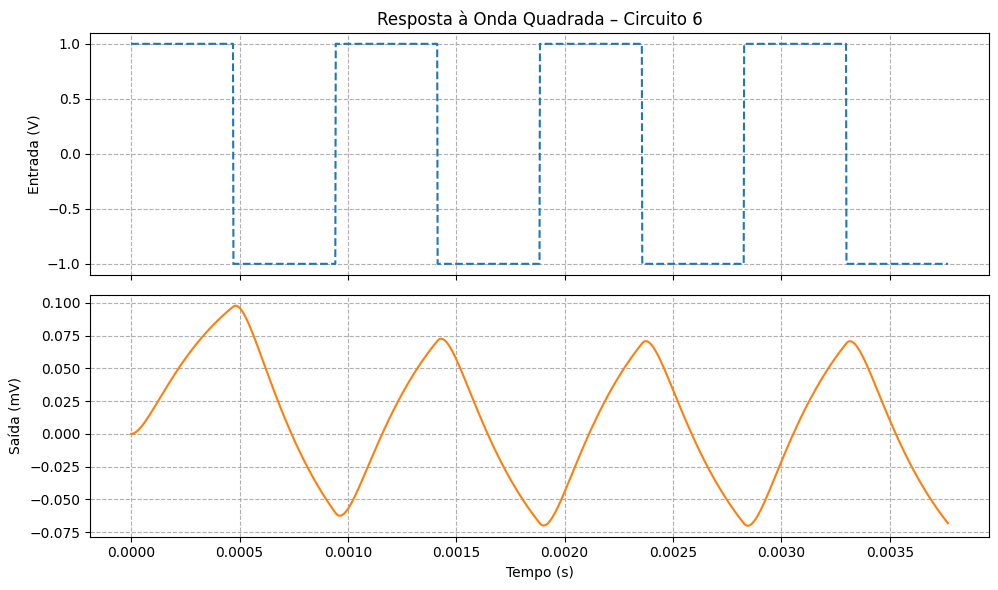

In [ ]:
# parâmetros do circuito
R = 10e3           # 10 kΩ
C = 15e-9          # 15 nF

# função de transferência H(s)
num = [1 / (R * C)]
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]
sys = signal.TransferFunction(num, den)

# onda quadrada na frequência central f0
f0 = 1 / (2 * np.pi * R * C)   # ≈ 1061 Hz
T, fs = 1 / f0, 5e5            # período e amostragem 500 kHz
t = np.arange(0, 4 * T, 1 / fs)
x = signal.square(2 * np.pi * f0 * t)  # ±1 V

# resposta do circuito
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# gráfico em dois subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

ax1.plot(t, x, 'C0--')
ax1.set_ylabel('Entrada (V)')
ax1.set_title('Resposta à Onda Quadrada – Circuito 6')
ax1.grid(True, linestyle='--')

ax2.plot(t_out, y_out * 1e3, 'C1')
ax2.set_xlabel('Tempo (s)')
ax2.set_ylabel('Saída (mV)')
ax2.grid(True, linestyle='--')

plt.tight_layout()
plt.show()

#### Letra L - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

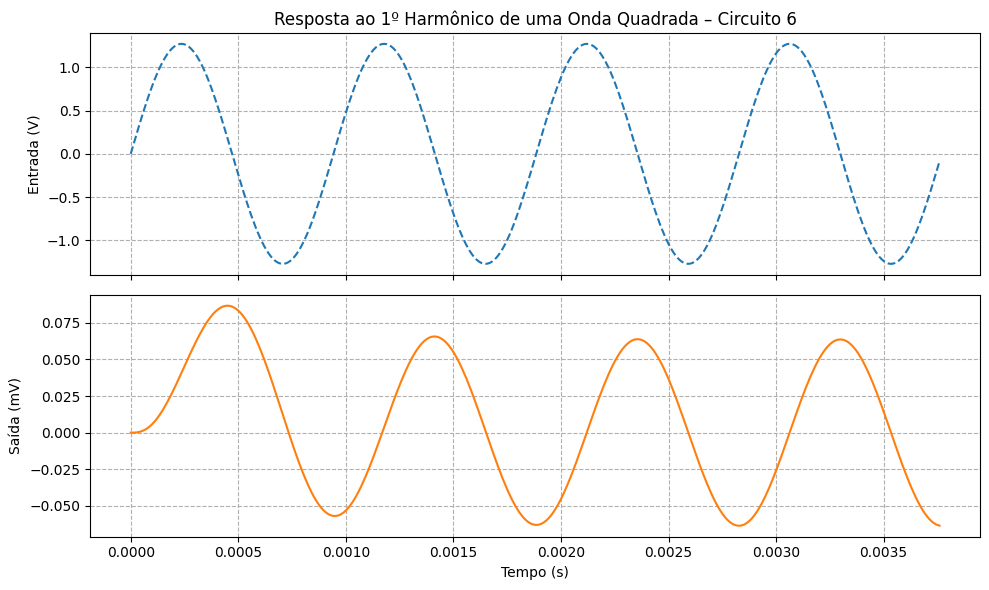

In [ ]:
# parâmetros do circuito
R = 10e3
C = 15e-9
num = [1 / (R * C)]
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]
sys = signal.TransferFunction(num, den)

# primeiro harmônico (frequência fundamental)
f1 = 1 / (2 * np.pi * R * C)
omega1 = 2 * np.pi * f1
T = 1 / f1
fs = 1e5
t = np.arange(0, 4*T, 1/fs)

# entrada: 1º harmônico da onda quadrada
x = (4 / np.pi) * np.sin(omega1 * t)

# resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# gráfico com duas escalas
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

ax1.plot(t, x, 'C0--')
ax1.set_ylabel('Entrada (V)')
ax1.set_title('Resposta ao 1º Harmônico de uma Onda Quadrada – Circuito 6')
ax1.grid(True, linestyle='--')

ax2.plot(t_out, y_out * 1e3, 'C1')
ax2.set_ylabel('Saída (mV)')
ax2.set_xlabel('Tempo (s)')
ax2.grid(True, linestyle='--')

plt.tight_layout()
plt.show()

#### Letra M - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

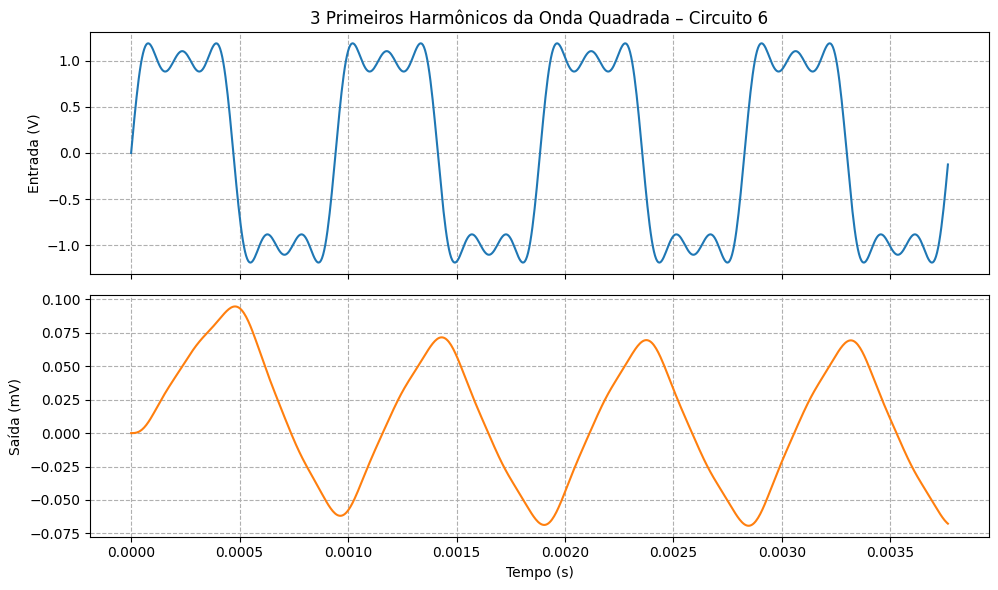

In [ ]:
# ----- parâmetros do circuito -----
R, C = 10e3, 15e-9
num = [1 / (R * C)]
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]
sys = signal.TransferFunction(num, den)

# ----- frequência fundamental -----
f0 = 1 / (2 * np.pi * R * C)          # ≈ 1 061 Hz
w0 = 2 * np.pi * f0
T  = 1 / f0
fs = 2e5                               # 200 kSa/s
t  = np.arange(0, 4*T, 1/fs)

# entrada: 3 primeiros harmônicos (4/π)[sin + 1/3 sin 3ωt + 1/5 sin 5ωt]
x  = (4/np.pi) * (
        np.sin(w0*t) +
        (1/3)*np.sin(3*w0*t) +
        (1/5)*np.sin(5*w0*t))

# resposta
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# ----- gráfico em duas escalas -----
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,6), sharex=True)

ax1.plot(t, x, 'C0')
ax1.set_ylabel('Entrada (V)')
ax1.set_title('3 Primeiros Harmônicos da Onda Quadrada – Circuito 6')
ax1.grid(True, ls='--')

ax2.plot(t_out, y_out*1e3, 'C1')
ax2.set_ylabel('Saída (mV)')
ax2.set_xlabel('Tempo (s)')
ax2.grid(True, ls='--')

plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

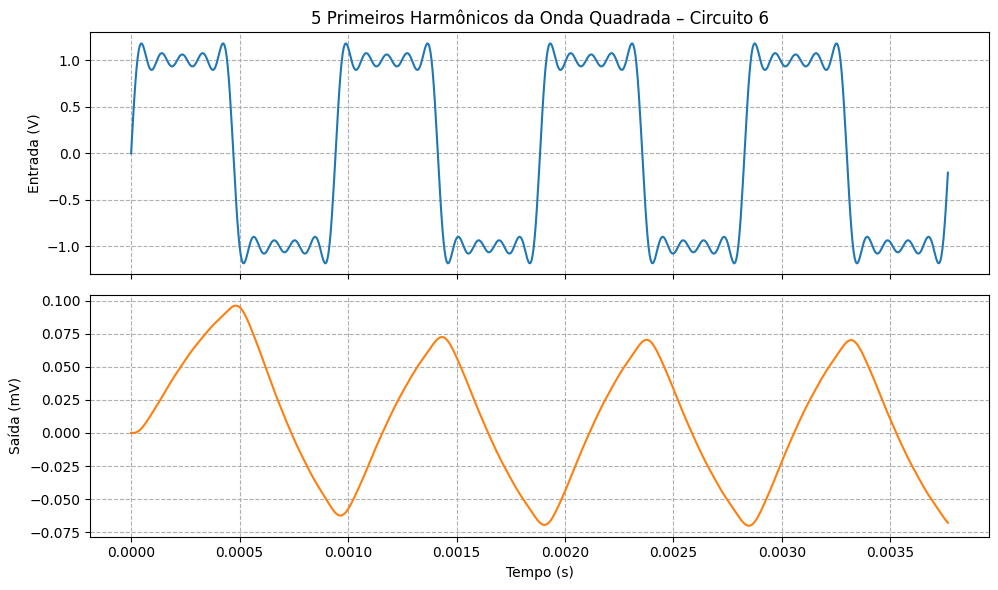

In [ ]:
# Parâmetros do circuito
R = 10e3
C = 15e-9
num = [1 / (R * C)]
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]
sys = signal.TransferFunction(num, den)

# Frequência fundamental e tempo
f0 = 1 / (2 * np.pi * R * C)
w0 = 2 * np.pi * f0
T = 1 / f0
fs = 2e5
t = np.arange(0, 4*T, 1/fs)

# Entrada com os 5 primeiros harmônicos ímpares da série de Fourier
x = (4/np.pi) * (
    np.sin(w0 * t) +
    (1/3) * np.sin(3*w0 * t) +
    (1/5) * np.sin(5*w0 * t) +
    (1/7) * np.sin(7*w0 * t) +
    (1/9) * np.sin(9*w0 * t)
)

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

ax1.plot(t, x, 'C0')
ax1.set_ylabel('Entrada (V)')
ax1.set_title('5 Primeiros Harmônicos da Onda Quadrada – Circuito 6')
ax1.grid(True, linestyle='--')

ax2.plot(t_out, y_out * 1e3, 'C1')
ax2.set_ylabel('Saída (mV)')
ax2.set_xlabel('Tempo (s)')
ax2.grid(True, linestyle='--')

plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

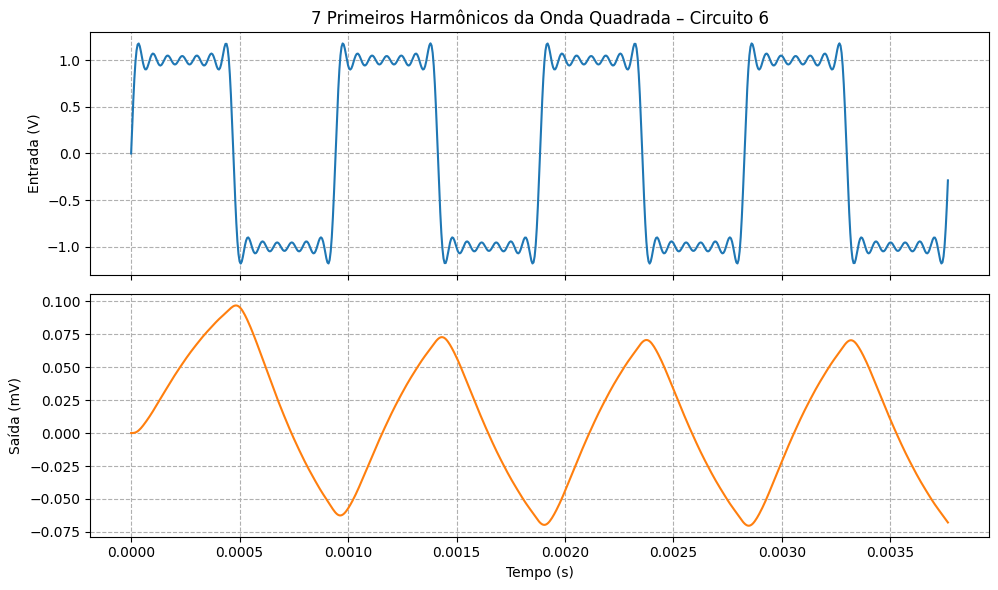

In [ ]:
# Parâmetros do circuito
R = 10e3
C = 15e-9
num = [1 / (R * C)]
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
f0 = 1 / (2 * np.pi * R * C)
w0 = 2 * np.pi * f0
T = 1 / f0
fs = 2e5
t = np.arange(0, 4*T, 1/fs)

# Entrada: 7 primeiros harmônicos ímpares
harmonicos = [1, 3, 5, 7, 9, 11, 13]
x = np.zeros_like(t)
for k in harmonicos:
    x += (1 / k) * np.sin(k * w0 * t)
x *= (4 / np.pi)

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráficos
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

ax1.plot(t, x, 'C0')
ax1.set_ylabel('Entrada (V)')
ax1.set_title('7 Primeiros Harmônicos da Onda Quadrada – Circuito 6')
ax1.grid(True, linestyle='--')

ax2.plot(t_out, y_out * 1e3, 'C1')
ax2.set_ylabel('Saída (mV)')
ax2.set_xlabel('Tempo (s)')
ax2.grid(True, linestyle='--')

plt.tight_layout()
plt.show()

#### Letra P - Resposta a uma Dente de Serra de Frequência ω

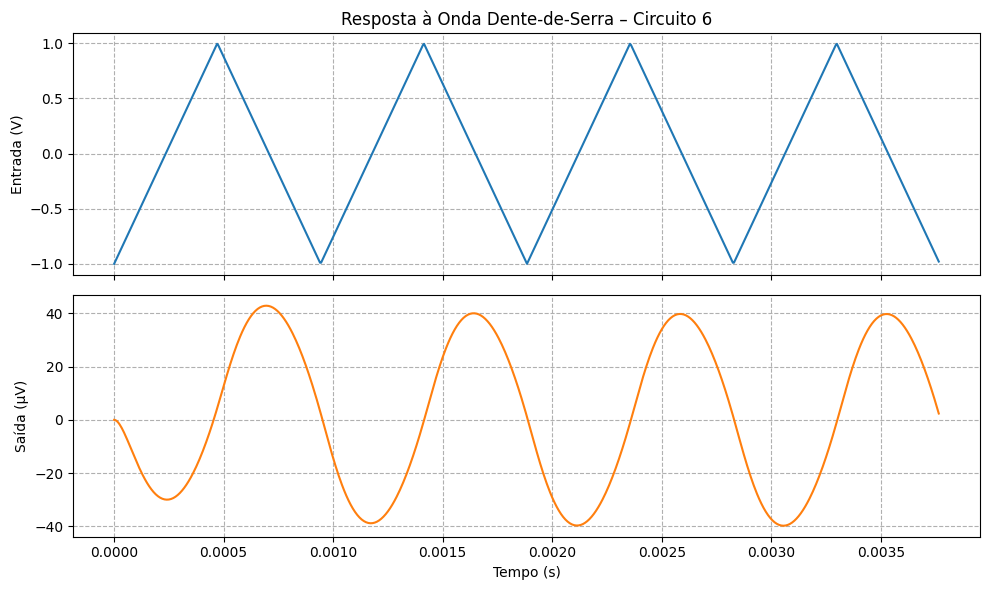

In [ ]:
# ---- parâmetros do circuito ----
R, C = 10e3, 15e-9
num = [1 / (R * C)]
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]
sys = signal.TransferFunction(num, den)

# ---- frequência fundamental (sábia escolha) ----
f0 = 1 / (2 * np.pi * R * C)           # ≈ 1061 Hz
w0 = 2 * np.pi * f0
T  = 1 / f0
fs = 2e5                               # 200 kSa/s
t  = np.arange(0, 4*T, 1/fs)

# ---- entrada: onda dente-de-serra ±1 V ----
x = signal.sawtooth(2 * np.pi * f0 * t, width=0.5)  # simétrica

# ---- resposta do sistema ----
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# ---- gráfico em duas escalas ----
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

ax1.plot(t, x, 'C0')
ax1.set_ylabel('Entrada (V)')
ax1.set_title('Resposta à Onda Dente-de-Serra – Circuito 6')
ax1.grid(True, ls='--')

ax2.plot(t_out, y_out * 1e6, 'C1')
ax2.set_ylabel('Saída (µV)')
ax2.set_xlabel('Tempo (s)')
ax2.grid(True, ls='--')

plt.tight_layout()
plt.show()

#### Letra Q - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

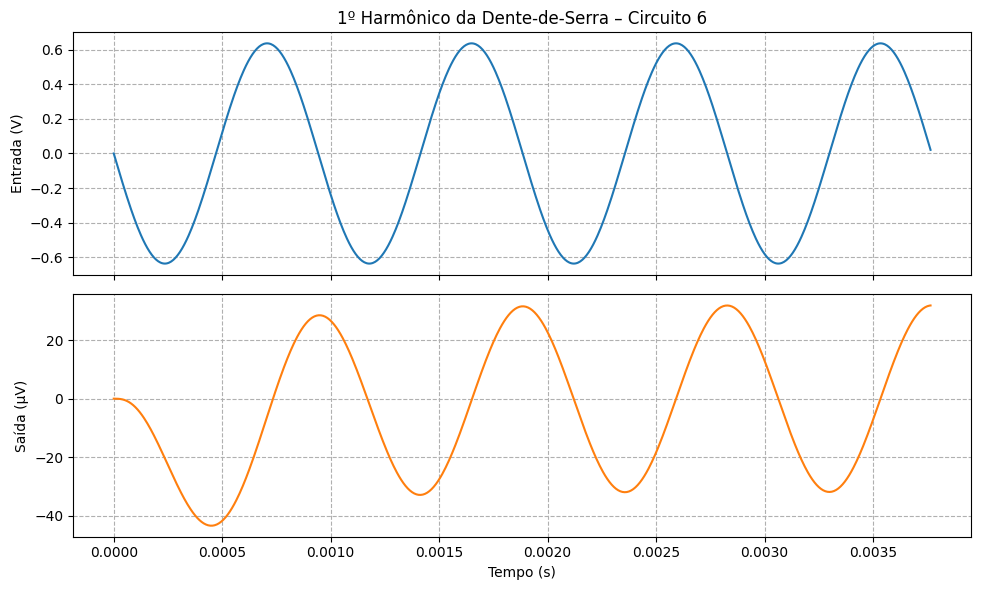

In [ ]:
# parâmetros do circuito
R = 10e3
C = 15e-9
num = [1 / (R * C)]
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]
sys = signal.TransferFunction(num, den)

# frequência fundamental da dente de serra
f0 = 1 / (2 * np.pi * R * C)
w0 = 2 * np.pi * f0
T = 1 / f0
fs = 2e5
t = np.arange(0, 4*T, 1/fs)

# entrada: 1º harmônico da dente-de-serra
x = -(2 / np.pi) * np.sin(w0 * t)

# resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# gráfico
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

ax1.plot(t, x, 'C0')
ax1.set_ylabel('Entrada (V)')
ax1.set_title('1º Harmônico da Dente-de-Serra – Circuito 6')
ax1.grid(True, linestyle='--')

ax2.plot(t_out, y_out * 1e6, 'C1')
ax2.set_ylabel('Saída (µV)')
ax2.set_xlabel('Tempo (s)')
ax2.grid(True, linestyle='--')

plt.tight_layout()
plt.show()

#### Letra R - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

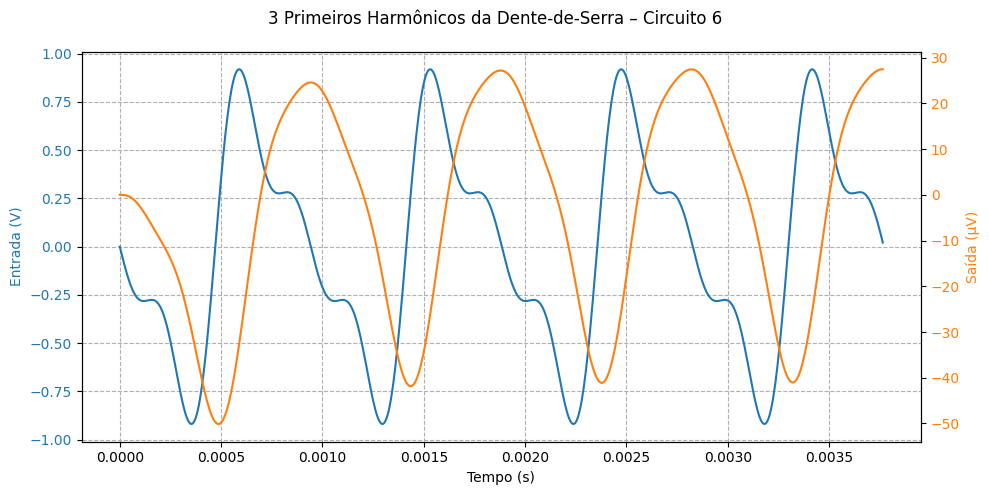

In [ ]:
# --- parâmetros do circuito ---
R = 10e3            # 10 kΩ
C = 15e-9           # 15 nF
num = [1/(R*C)]
den = [1, 3/(R*C), 1/(R**2*C**2)]
sys = signal.TransferFunction(num, den)

# --- frequência fundamental da dente-de-serra ---
f0 = 1/(2*np.pi*R*C)      # ≈ 1061 Hz
w0 = 2*np.pi*f0
T  = 1/f0
fs = 2e5                  # 200 kSa/s
t  = np.arange(0, 4*T, 1/fs)

# --- entrada: 3 primeiros harmônicos ---
x = -(2/np.pi)*(
       np.sin(1*w0*t)
     - 0.5*np.sin(2*w0*t)
     + (1/3)*np.sin(3*w0*t)
)

# --- resposta do sistema ---
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# --- gráfico: entrada (V) e saída (µV) no mesmo eixo de tempo ---
fig, ax1 = plt.subplots(figsize=(10,5))

ax1.plot(t, x, 'C0', label='Entrada (V)')
ax1.set_xlabel('Tempo (s)')
ax1.set_ylabel('Entrada (V)', color='C0')
ax1.tick_params(axis='y', labelcolor='C0')
ax1.grid(True, linestyle='--')

ax2 = ax1.twinx()
ax2.plot(t_out, y_out*1e6, 'C1', label='Saída (µV)')
ax2.set_ylabel('Saída (µV)', color='C1')
ax2.tick_params(axis='y', labelcolor='C1')

fig.suptitle('3 Primeiros Harmônicos da Dente-de-Serra – Circuito 6')
fig.tight_layout()
plt.show()

#### Letra S - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

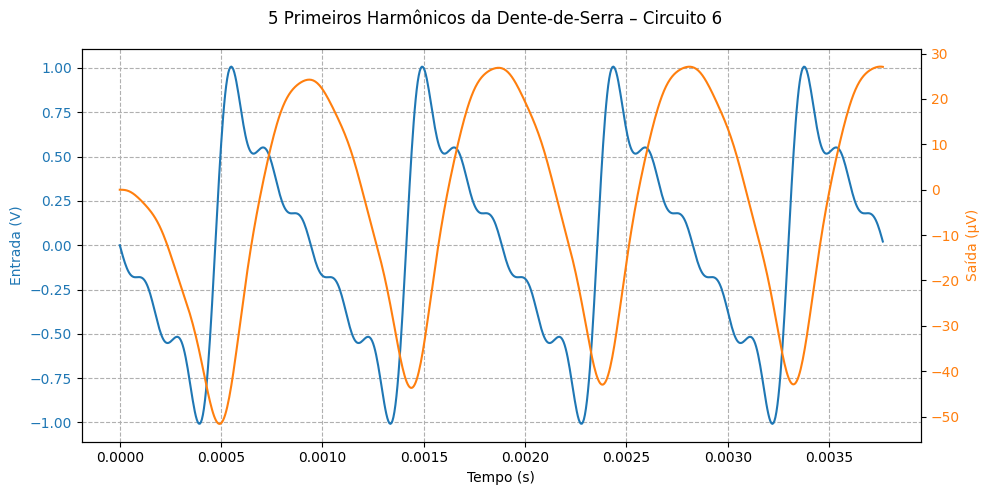

In [ ]:
# Parâmetros do circuito
R = 10e3
C = 15e-9
num = [1 / (R * C)]
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]
sys = signal.TransferFunction(num, den)

# Frequência fundamental da onda dente-de-serra
f0 = 1 / (2 * np.pi * R * C)
w0 = 2 * np.pi * f0
T = 1 / f0
fs = 2e5
t = np.arange(0, 4*T, 1/fs)

# Entrada: 5 primeiros harmônicos da dente-de-serra
x = -(2 / np.pi) * (
    np.sin(w0 * t)
    - (1/2) * np.sin(2 * w0 * t)
    + (1/3) * np.sin(3 * w0 * t)
    - (1/4) * np.sin(4 * w0 * t)
    + (1/5) * np.sin(5 * w0 * t)
)

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico combinado (entrada e saída)
fig, ax1 = plt.subplots(figsize=(10, 5))

ax1.plot(t, x, 'C0', label='Entrada (V)')
ax1.set_xlabel('Tempo (s)')
ax1.set_ylabel('Entrada (V)', color='C0')
ax1.tick_params(axis='y', labelcolor='C0')
ax1.grid(True, linestyle='--')

ax2 = ax1.twinx()
ax2.plot(t_out, y_out * 1e6, 'C1', label='Saída (µV)')
ax2.set_ylabel('Saída (µV)', color='C1')
ax2.tick_params(axis='y', labelcolor='C1')

fig.suptitle('5 Primeiros Harmônicos da Dente-de-Serra – Circuito 6')
fig.tight_layout()
plt.show()

#### Letra T - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

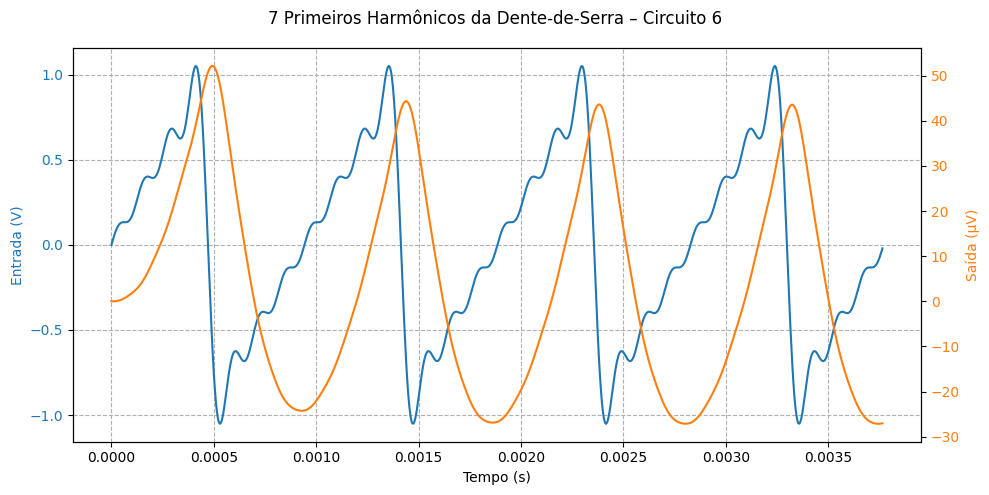

In [ ]:
# --- Parâmetros do circuito ---
R = 10e3
C = 15e-9
num = [1 / (R * C)]
den = [1, 3 / (R * C), 1 / (R**2 * C**2)]
sys = signal.TransferFunction(num, den)

# --- Frequência fundamental ---
f0 = 1 / (2 * np.pi * R * C)     # ≈ 1061 Hz
w0 = 2 * np.pi * f0
T = 1 / f0
fs = 2e5
t = np.arange(0, 4*T, 1/fs)

# --- Entrada: 7 primeiros harmônicos da dente-de-serra ---
x = np.zeros_like(t)
for k in range(1, 8):
    x += ((-1)**k) / k * np.sin(k * w0 * t)
x *= -(2 / np.pi)

# --- Resposta do sistema ---
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# --- Gráfico: Entrada (V) e Saída (µV) ---
fig, ax1 = plt.subplots(figsize=(10, 5))

ax1.plot(t, x, 'C0', label='Entrada (V)')
ax1.set_xlabel('Tempo (s)')
ax1.set_ylabel('Entrada (V)', color='C0')
ax1.tick_params(axis='y', labelcolor='C0')
ax1.grid(True, linestyle='--')

ax2 = ax1.twinx()
ax2.plot(t_out, y_out * 1e6, 'C1', label='Saída (µV)')
ax2.set_ylabel('Saída (µV)', color='C1')
ax2.tick_params(axis='y', labelcolor='C1')

fig.suptitle('7 Primeiros Harmônicos da Dente-de-Serra – Circuito 6')
fig.tight_layout()
plt.show()

### Circuito 7

Com base no desenvolvimento presente no PDF do Trabalho Escrito, a função de transferência é: $H(s) = -\frac{100}{s}$.

#### Letra G - Diagrama de Pólos e Zeros

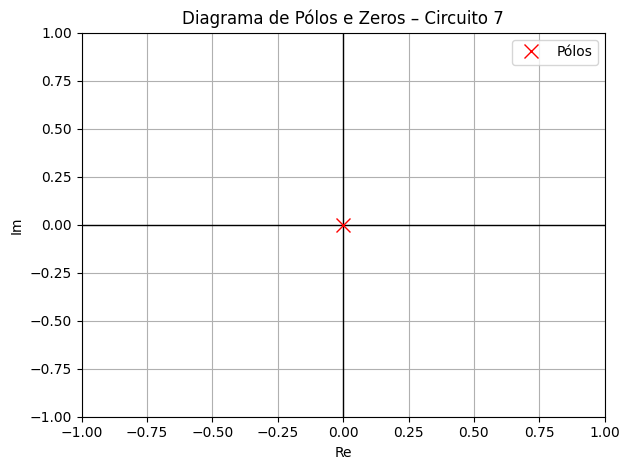

In [ ]:
# Pólos e zeros da função H(s) = -100/s
poles = [0]
zeros = []

# Criar gráfico do plano s
fig, ax = plt.subplots()
ax.axhline(0, color='black', linewidth=1)  # eixo real
ax.axvline(0, color='black', linewidth=1)  # eixo imaginário

# Plotar pólos e zeros
ax.plot(np.real(poles), np.imag(poles), 'x', label='Pólos', markersize=10, color='red')
if zeros:
    ax.plot(np.real(zeros), np.imag(zeros), 'o', label='Zeros', markersize=10, color='blue')

# Ajustes visuais
ax.set_xlim(-1, 1)
ax.set_ylim(-1, 1)
ax.set_xlabel('Re')
ax.set_ylabel('Im')
ax.set_title('Diagrama de Pólos e Zeros – Circuito 7')
ax.legend()
ax.grid(True)
plt.tight_layout()
plt.show()

####Letra H - Diagrama de Bode

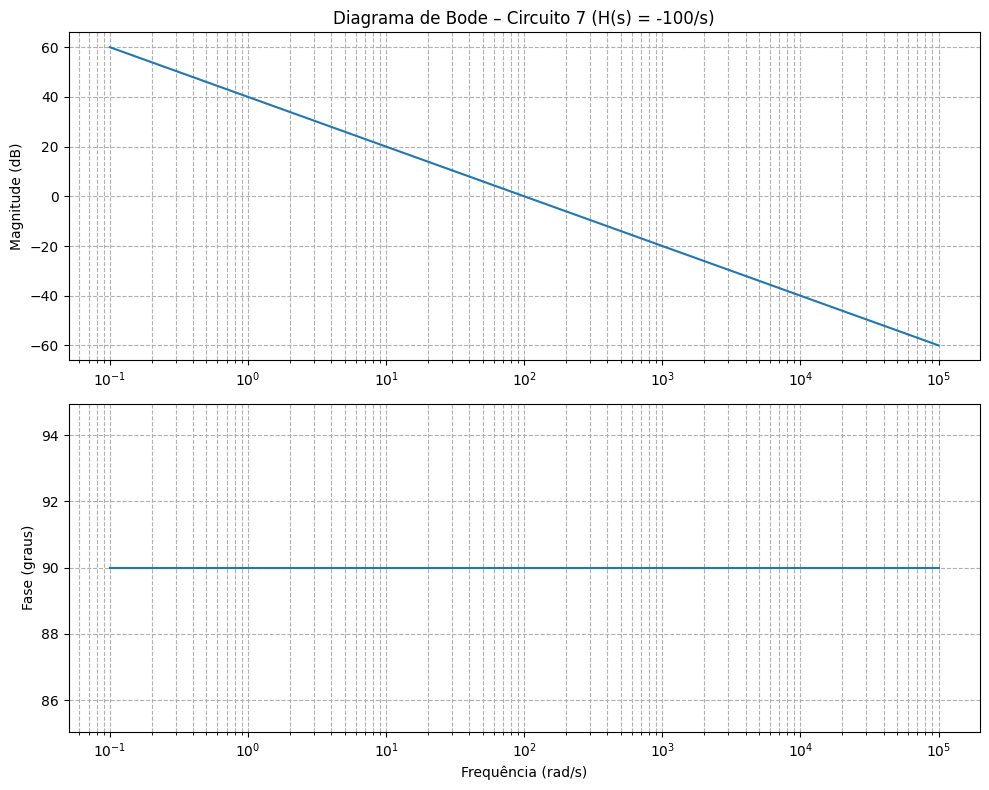

In [ ]:
# H(s) = -100 / s
num = [-100]
den = [1, 0]
sys = signal.TransferFunction(num, den)

# Frequência logarítmica de varredura
w = np.logspace(-1, 5, 800)  # de 0.1 a 100000 rad/s

# Obter magnitude e fase
w, mag, phase = signal.bode(sys, w)

# Gráfico Bode combinado
plt.figure(figsize=(10, 8))

# Magnitude
plt.subplot(2, 1, 1)
plt.semilogx(w, mag)
plt.title('Diagrama de Bode – Circuito 7 (H(s) = -100/s)')
plt.ylabel('Magnitude (dB)')
plt.grid(True, which='both', ls='--')

# Fase
plt.subplot(2, 1, 2)
plt.semilogx(w, phase)
plt.xlabel('Frequência (rad/s)')
plt.ylabel('Fase (graus)')
plt.grid(True, which='both', ls='--')

plt.tight_layout()
plt.show()

#### Letra I - Resposta ao Degrau Unitário

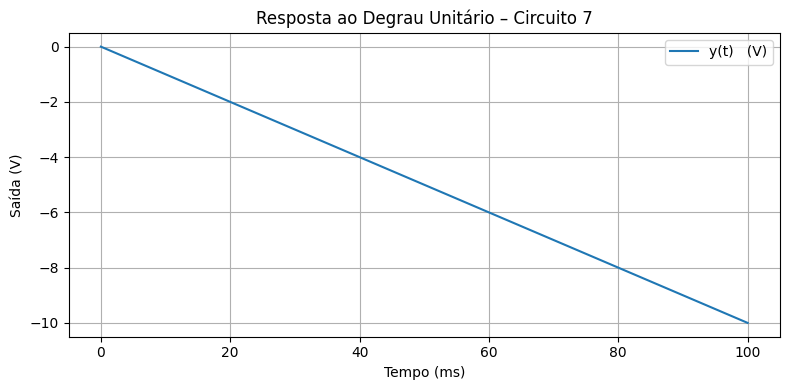

In [ ]:
# H(s) = -100/s
sys = signal.TransferFunction([-100], [1, 0])

# simular 100 ms
t = np.linspace(0, 0.1, 1000)
t_out, y_out = signal.step(sys, T=t)   # resposta ao degrau unitário

# gráfico
plt.figure(figsize=(8, 4))
plt.plot(t_out*1e3, y_out, label='y(t)   (V)')
plt.title('Resposta ao Degrau Unitário – Circuito 7')
plt.xlabel('Tempo (ms)')
plt.ylabel('Saída (V)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra J - Resposta a Rampa Unitária

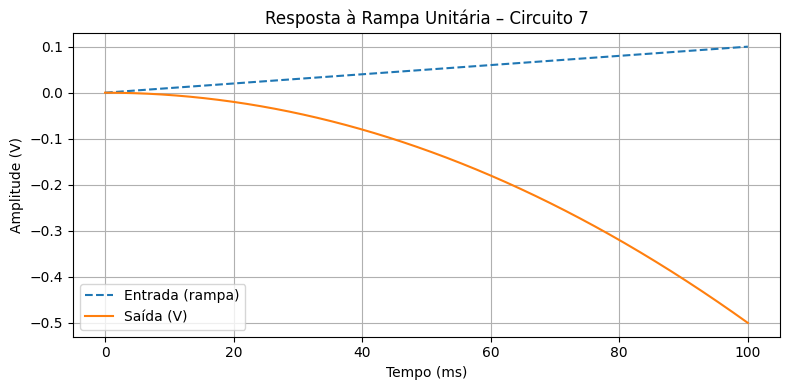

In [ ]:
# Sistema: H(s) = -100/s
sys = signal.TransferFunction([-100], [1, 0])

# Tempo de simulação (até 0.1 s)
t = np.linspace(0, 0.1, 1000)
u = t  # entrada rampa unitária

# Resposta à rampa
t_out, y_out, _ = signal.lsim(sys, U=u, T=t)

# Gráfico
plt.figure(figsize=(8, 4))
plt.plot(t_out * 1e3, u, '--', label='Entrada (rampa)')
plt.plot(t_out * 1e3, y_out, label='Saída (V)')
plt.title('Resposta à Rampa Unitária – Circuito 7')
plt.xlabel('Tempo (ms)')
plt.ylabel('Amplitude (V)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra K - Resposta a uma Onda Quadrada de Frequência ω

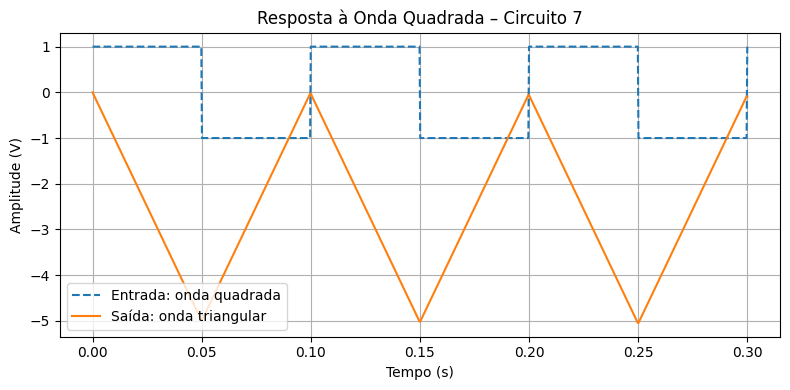

In [ ]:
# Parâmetros da onda quadrada
f = 10  # frequência em Hz
omega = 2 * np.pi * f
T = 1 / f

# Tempo de simulação
t = np.linspace(0, 3 * T, 1000)
x = signal.square(omega * t)  # entrada: onda quadrada de frequência ω

# Sistema H(s) = -100 / s
sys = signal.TransferFunction([-100], [1, 0])

# Simulação
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico
plt.figure(figsize=(8, 4))
plt.plot(t_out, x, '--', label='Entrada: onda quadrada')
plt.plot(t_out, y_out, label='Saída: onda triangular')
plt.title('Resposta à Onda Quadrada – Circuito 7')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra L - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

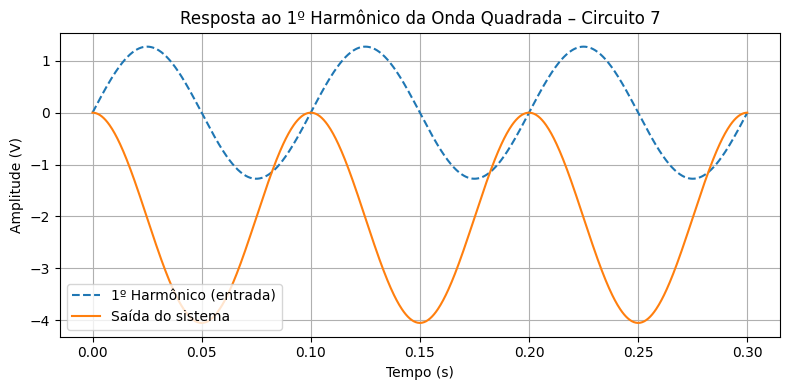

In [ ]:
# Frequência fundamental
f = 10
omega = 2 * np.pi * f

# Entrada: 1º harmônico da onda quadrada (senoidal)
t = np.linspace(0, 3 / f, 1000)
x1 = (4 / np.pi) * np.sin(omega * t)

# Sistema: H(s) = -100 / s
sys = signal.TransferFunction([-100], [1, 0])

# Resposta à senoide
t_out, y_out, _ = signal.lsim(sys, U=x1, T=t)

# Gráfico
plt.figure(figsize=(8, 4))
plt.plot(t, x1, '--', label='1º Harmônico (entrada)')
plt.plot(t, y_out, label='Saída do sistema')
plt.title('Resposta ao 1º Harmônico da Onda Quadrada – Circuito 7')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra M - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

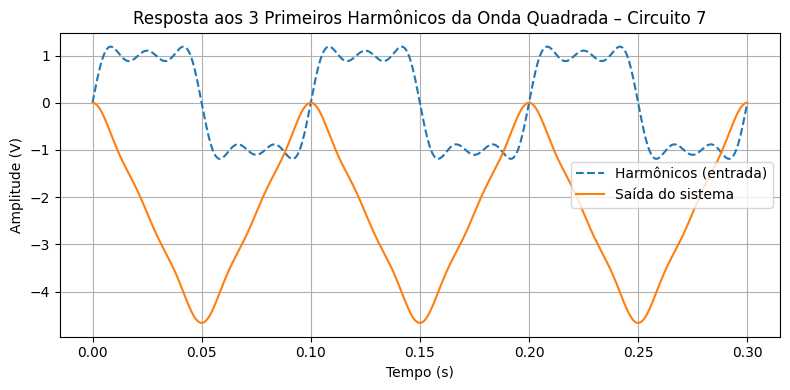

In [ ]:
# Frequência fundamental
f = 10
omega = 2 * np.pi * f
t = np.linspace(0, 3 / f, 1000)

# Entrada: 3 primeiros harmônicos da onda quadrada
x3 = (4 / np.pi) * (
    np.sin(omega * t)
    + (1/3) * np.sin(3 * omega * t)
    + (1/5) * np.sin(5 * omega * t)
)

# Sistema: H(s) = -100 / s
sys = signal.TransferFunction([-100], [1, 0])

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x3, T=t)

# Gráfico
plt.figure(figsize=(8, 4))
plt.plot(t, x3, '--', label='Harmônicos (entrada)')
plt.plot(t, y_out, label='Saída do sistema')
plt.title('Resposta aos 3 Primeiros Harmônicos da Onda Quadrada – Circuito 7')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

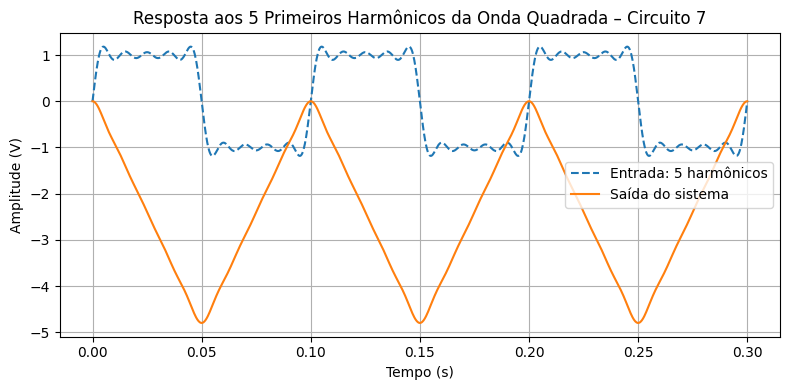

In [ ]:
# Frequência fundamental
f = 10
omega = 2 * np.pi * f
t = np.linspace(0, 3 / f, 1000)

# Entrada: 5 primeiros harmônicos da onda quadrada
x5 = (4 / np.pi) * (
    np.sin(omega * t)
    + (1/3) * np.sin(3 * omega * t)
    + (1/5) * np.sin(5 * omega * t)
    + (1/7) * np.sin(7 * omega * t)
    + (1/9) * np.sin(9 * omega * t)
)

# Sistema: H(s) = -100 / s
sys = signal.TransferFunction([-100], [1, 0])

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x5, T=t)

# Gráfico
plt.figure(figsize=(8, 4))
plt.plot(t, x5, '--', label='Entrada: 5 harmônicos')
plt.plot(t, y_out, label='Saída do sistema')
plt.title('Resposta aos 5 Primeiros Harmônicos da Onda Quadrada – Circuito 7')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

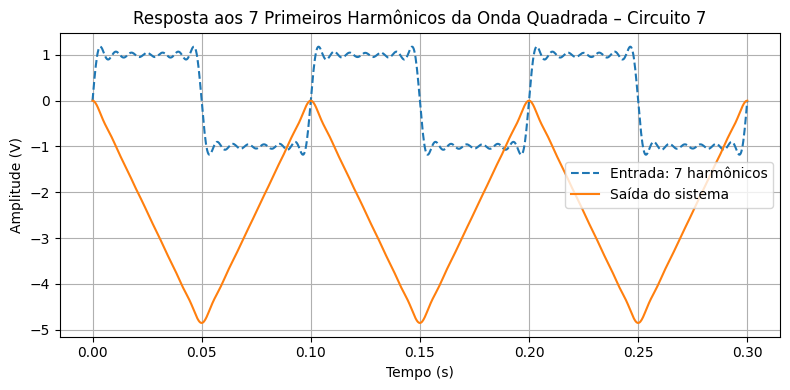

In [ ]:
# Frequência fundamental
f = 10
omega = 2 * np.pi * f
t = np.linspace(0, 3 / f, 1000)

# Entrada: 7 primeiros harmônicos ímpares da onda quadrada
harmonicos = [1, 3, 5, 7, 9, 11, 13]
x7 = np.zeros_like(t)
for k in harmonicos:
    x7 += (1 / k) * np.sin(k * omega * t)
x7 *= (4 / np.pi)

# Sistema: H(s) = -100 / s
sys = signal.TransferFunction([-100], [1, 0])

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x7, T=t)

# Gráfico
plt.figure(figsize=(8, 4))
plt.plot(t, x7, '--', label='Entrada: 7 harmônicos')
plt.plot(t, y_out, label='Saída do sistema')
plt.title('Resposta aos 7 Primeiros Harmônicos da Onda Quadrada – Circuito 7')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra P - Resposta a uma Dente de Serra de Frequência ω

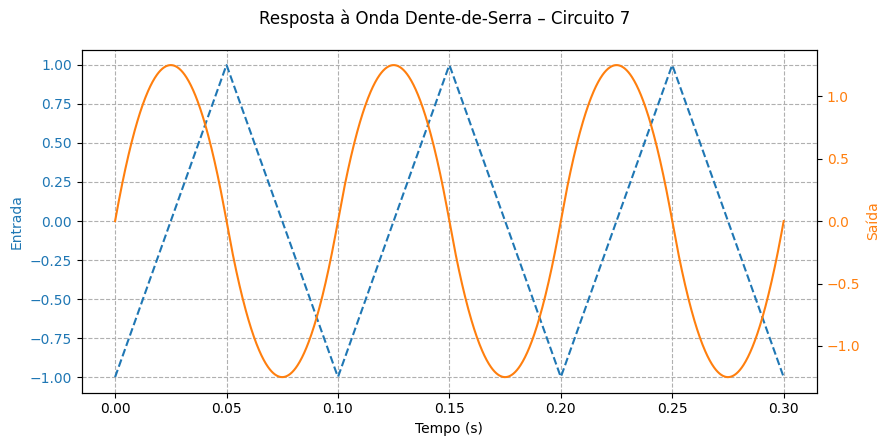

In [ ]:
# Frequência da dente-de-serra
f0 = 10  # Hz
omega0 = 2 * np.pi * f0
T = 1 / f0
t = np.linspace(0, 3 * T, 1500)

# Entrada: onda dente-de-serra simétrica entre -1V e +1V
x = signal.sawtooth(omega0 * t, width=0.5)

# Sistema: H(s) = -100 / s
sys = signal.TransferFunction([-100], [1, 0])

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico da entrada e da saída
fig, ax1 = plt.subplots(figsize=(9, 4.5))

ax1.plot(t_out, x, 'C0--', label='Entrada (V)')
ax1.set_xlabel('Tempo (s)')
ax1.set_ylabel('Entrada', color='C0')
ax1.tick_params(axis='y', labelcolor='C0')
ax1.grid(True, ls='--')

ax2 = ax1.twinx()
ax2.plot(t_out, y_out, 'C1', label='Saída (V)')
ax2.set_ylabel('Saída', color='C1')
ax2.tick_params(axis='y', labelcolor='C1')

fig.suptitle('Resposta à Onda Dente-de-Serra – Circuito 7')
fig.tight_layout()
plt.show()

#### Letra Q - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

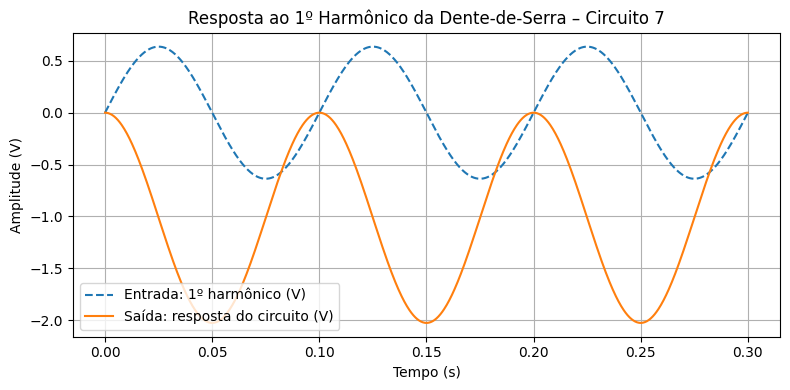

In [ ]:
# frequência fundamental
f0 = 10        # Hz
omega = 2 * np.pi * f0
t = np.linspace(0, 3 / f0, 1000)

# entrada: 1º harmônico da dente-de-serra (±1 V)
x1 = (2 / np.pi) * np.sin(omega * t)

# sistema integrador: H(s) = -100 / s
sys = signal.TransferFunction([-100], [1, 0])

# resposta ao seno
t_out, y_out, _ = signal.lsim(sys, U=x1, T=t)

# gráfico
plt.figure(figsize=(8, 4))
plt.plot(t, x1, '--', label='Entrada: 1º harmônico (V)')
plt.plot(t_out, y_out, label='Saída: resposta do circuito (V)')
plt.title('Resposta ao 1º Harmônico da Dente-de-Serra – Circuito 7')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude (V)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra R - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

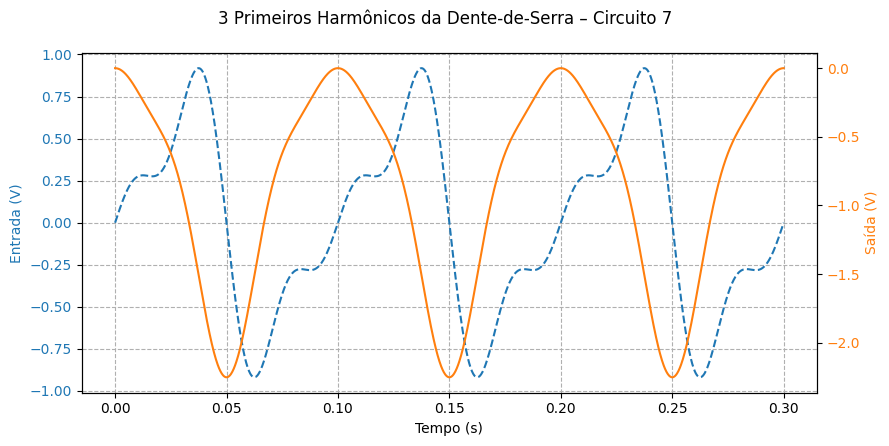

In [ ]:
# frequência fundamental
f0     = 10                      # Hz
omega  = 2 * np.pi * f0
T      = 1 / f0
t      = np.linspace(0, 3*T, 1500)

# entrada: 3 primeiros harmônicos da dente-de-serra
x3 = (2 / np.pi) * (
        np.sin(omega * t)
      - 0.5 * np.sin(2 * omega * t)
      + (1/3) * np.sin(3 * omega * t)
     )

# sistema integrador inversor H(s) = -100 / s
sys = signal.TransferFunction([-100], [1, 0])

# resposta do sistema
tout, yout, _ = signal.lsim(sys, U=x3, T=t)

# gráfico (mesmo eixo de tempo, dois eixos Y)
fig, ax1 = plt.subplots(figsize=(9, 4.5))

ax1.plot(tout, x3, 'C0--', label='Entrada (V)')
ax1.set_xlabel('Tempo (s)')
ax1.set_ylabel('Entrada (V)', color='C0')
ax1.tick_params(axis='y', labelcolor='C0')
ax1.grid(True, ls='--')

ax2 = ax1.twinx()
ax2.plot(tout, yout, 'C1', label='Saída (V)')
ax2.set_ylabel('Saída (V)', color='C1')
ax2.tick_params(axis='y', labelcolor='C1')

fig.suptitle('3 Primeiros Harmônicos da Dente-de-Serra – Circuito 7')
fig.tight_layout()
plt.show()

#### Letra S - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

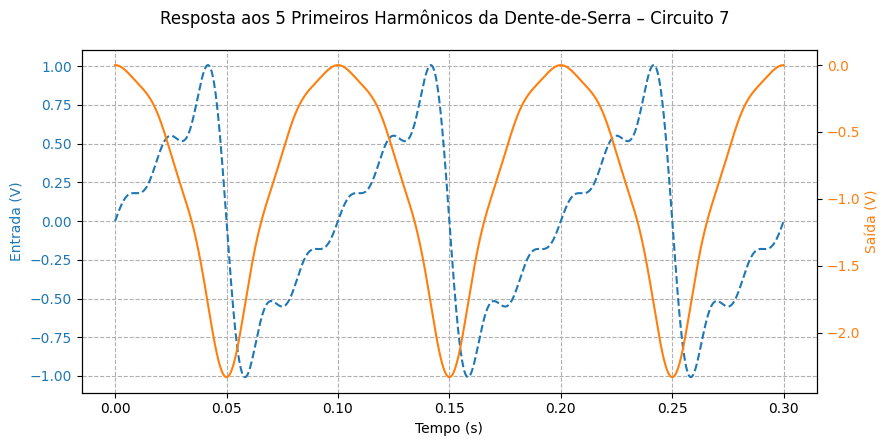

In [ ]:
# Parâmetros
f0 = 10
omega = 2 * np.pi * f0
T = 1 / f0
t = np.linspace(0, 3*T, 1500)

# Entrada: 5 primeiros harmônicos da dente-de-serra
x5 = (2 / np.pi) * (
    np.sin(omega * t)
    - (1/2) * np.sin(2 * omega * t)
    + (1/3) * np.sin(3 * omega * t)
    - (1/4) * np.sin(4 * omega * t)
    + (1/5) * np.sin(5 * omega * t)
)

# Sistema: integrador inversor
sys = signal.TransferFunction([-100], [1, 0])

# Resposta
t_out, y_out, _ = signal.lsim(sys, U=x5, T=t)

# Gráfico
fig, ax1 = plt.subplots(figsize=(9, 4.5))

ax1.plot(t_out, x5, 'C0--', label='Entrada: 5 harmônicos')
ax1.set_xlabel('Tempo (s)')
ax1.set_ylabel('Entrada (V)', color='C0')
ax1.tick_params(axis='y', labelcolor='C0')
ax1.grid(True, ls='--')

ax2 = ax1.twinx()
ax2.plot(t_out, y_out, 'C1', label='Saída (V)')
ax2.set_ylabel('Saída (V)', color='C1')
ax2.tick_params(axis='y', labelcolor='C1')

fig.suptitle('Resposta aos 5 Primeiros Harmônicos da Dente-de-Serra – Circuito 7')
fig.tight_layout()
plt.show()

#### Letra T - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

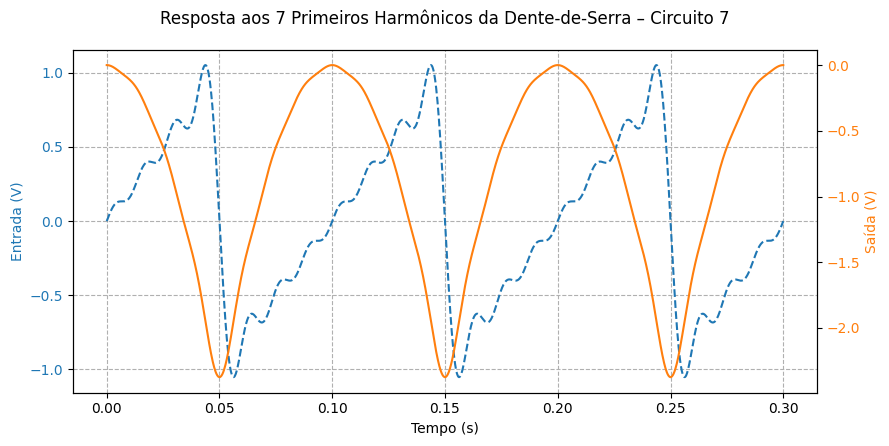

In [ ]:
# Frequência fundamental
f0 = 10
omega = 2 * np.pi * f0
T = 1 / f0
t = np.linspace(0, 3 * T, 1500)

# Entrada: 7 primeiros harmônicos da dente-de-serra
x7 = (2 / np.pi) * (
    np.sin(omega * t)
    - (1/2) * np.sin(2 * omega * t)
    + (1/3) * np.sin(3 * omega * t)
    - (1/4) * np.sin(4 * omega * t)
    + (1/5) * np.sin(5 * omega * t)
    - (1/6) * np.sin(6 * omega * t)
    + (1/7) * np.sin(7 * omega * t)
)

# Sistema: H(s) = -100 / s
sys = signal.TransferFunction([-100], [1, 0])

# Resposta
t_out, y_out, _ = signal.lsim(sys, U=x7, T=t)

# Gráfico
fig, ax1 = plt.subplots(figsize=(9, 4.5))

ax1.plot(t_out, x7, 'C0--', label='Entrada: 7 harmônicos')
ax1.set_xlabel('Tempo (s)')
ax1.set_ylabel('Entrada (V)', color='C0')
ax1.tick_params(axis='y', labelcolor='C0')
ax1.grid(True, ls='--')

ax2 = ax1.twinx()
ax2.plot(t_out, y_out, 'C1', label='Saída (V)')
ax2.set_ylabel('Saída (V)', color='C1')
ax2.tick_params(axis='y', labelcolor='C1')

fig.suptitle('Resposta aos 7 Primeiros Harmônicos da Dente-de-Serra – Circuito 7')
fig.tight_layout()
plt.show()

## Questão 2

Com base no desenvolvimento presente no PDF do Trabalho Escrito, a função de transferência é: $H(s) = \frac{12s+104}{s+4}$.

### Letra B - Diagrama de Pólos e Zeros

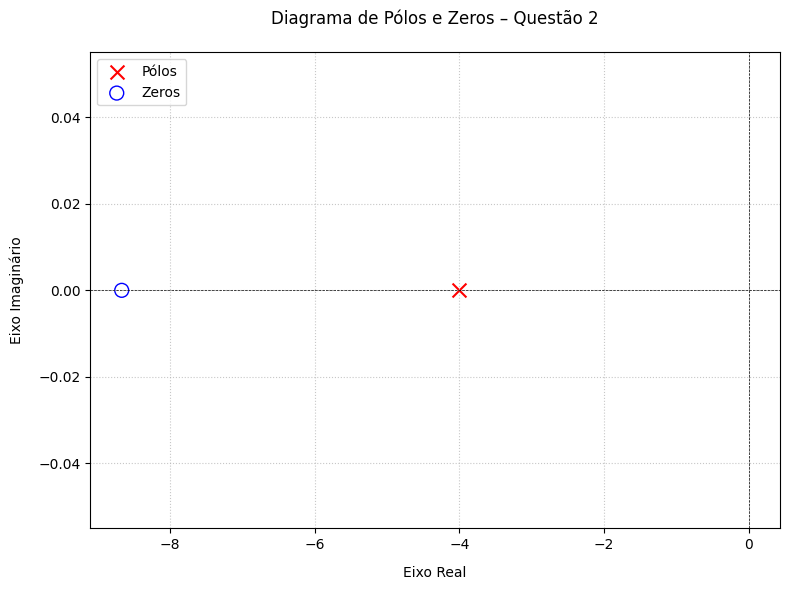

In [ ]:
# Função de transferência H(s) = (12s + 104)/(s + 4)
num = [12, 104]
den = [1, 4]
sys = signal.TransferFunction(num, den)

# Cálculo dos polos e zeros
zeros = sys.zeros
poles = sys.poles

# Gráfico
plt.figure(figsize=(8, 6))
plt.scatter(np.real(poles), np.imag(poles), marker='x', s=100, color='r', label='Pólos')
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', s=100, facecolors='none', edgecolors='b', label='Zeros')

# Configurações
plt.axhline(0, color='black', lw=0.5, linestyle='--')
plt.axvline(0, color='black', lw=0.5, linestyle='--')
plt.title('Diagrama de Pólos e Zeros – Questão 2', pad=20)
plt.xlabel('Eixo Real', labelpad=10)
plt.ylabel('Eixo Imaginário', labelpad=10)
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

###Letra C - Diagrama de Bode

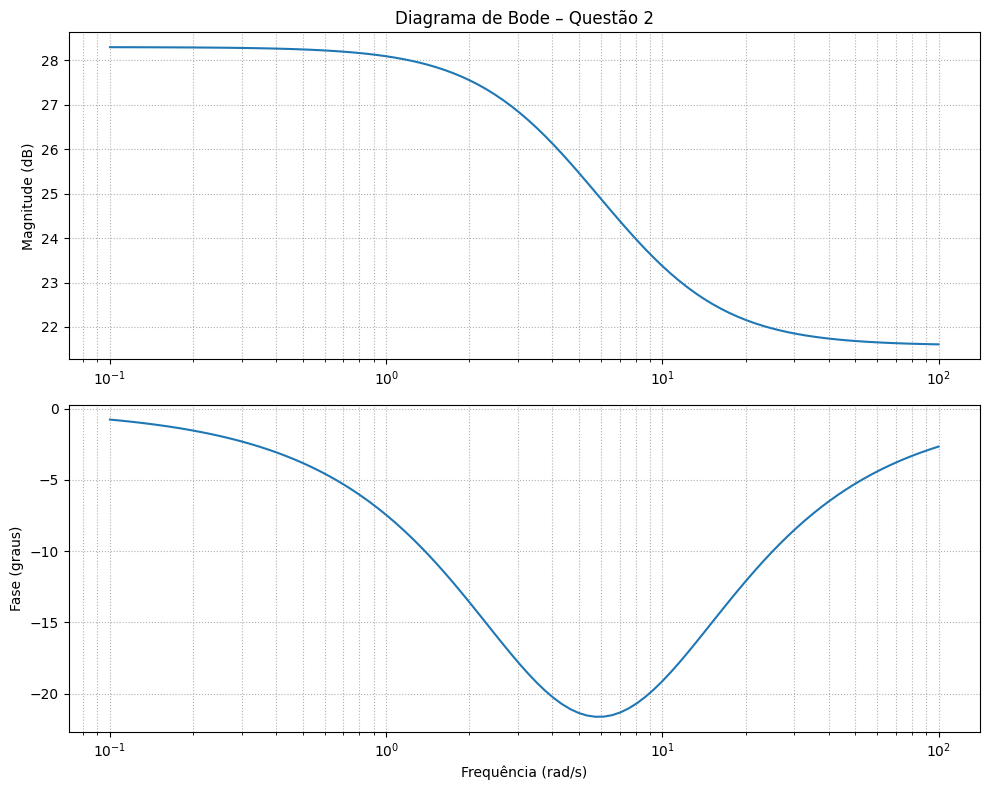

In [ ]:
# Função de transferência H(s) = (12s + 104)/(s + 4)
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Frequências e resposta de Bode
w, mag, phase = signal.bode(system)

# Plot
plt.figure(figsize=(10, 8))

# Magnitude
plt.subplot(2, 1, 1)
plt.semilogx(w, mag)
plt.title('Diagrama de Bode – Questão 2')
plt.ylabel('Magnitude (dB)')
plt.grid(True, which='both', linestyle=':')

# Fase
plt.subplot(2, 1, 2)
plt.semilogx(w, phase)
plt.xlabel('Frequência (rad/s)')
plt.ylabel('Fase (graus)')
plt.grid(True, which='both', linestyle=':')

plt.tight_layout()
plt.show()


### Letra F - Resposta ao Degrau Unitário

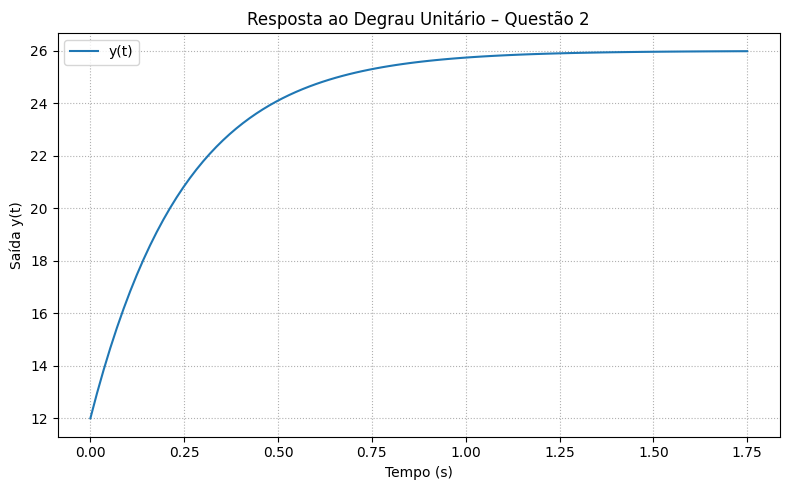

In [ ]:
# Função de transferência H(s) = (12s + 104)/(s + 4)
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Resposta ao degrau
t, y = signal.step(system)

# Gráfico
plt.figure(figsize=(8, 5))
plt.plot(t, y, label='y(t)')
plt.title('Resposta ao Degrau Unitário – Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Saída y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Letra G - Resposta a Rampa Unitária

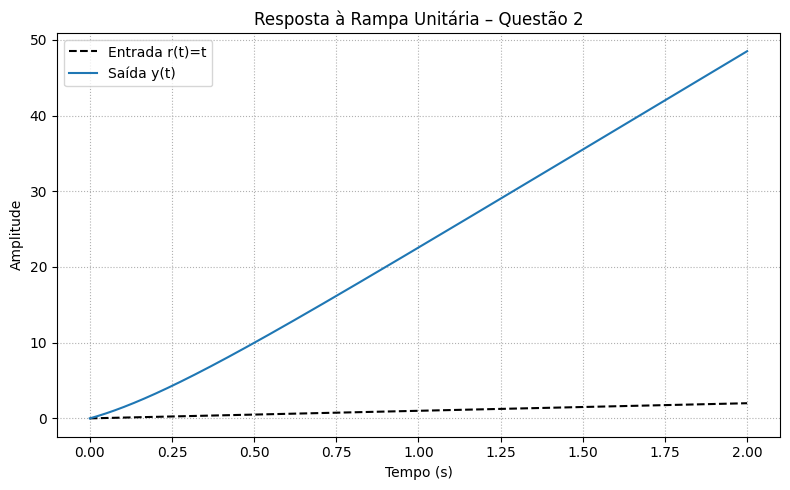

In [ ]:
# Função de transferência H(s) = (12s + 104)/(s + 4)
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Geração da rampa unitária
t = np.linspace(0, 2, 1000)           # 0-2 s
u = t                                 # rampa: u(t)=t

# Simulação da resposta com lsim
tout, y, _ = signal.lsim(system, U=u, T=t)

# Plot
plt.figure(figsize=(8, 5))
plt.plot(tout, u, 'k--', label='Entrada r(t)=t')
plt.plot(tout, y,  label='Saída y(t)')
plt.title('Resposta à Rampa Unitária – Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Letra H - Resposta à uma Onda Quadrada de Frequência ω

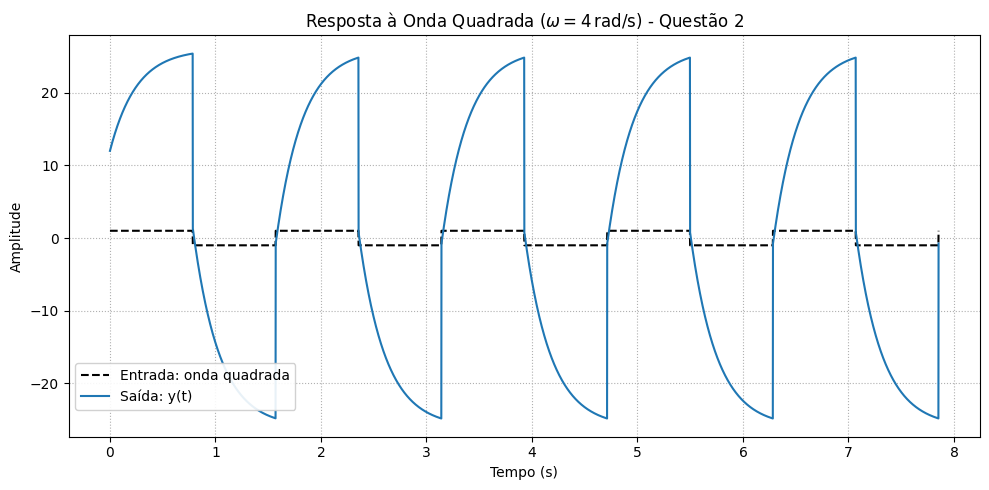

In [ ]:
# Sistema: H(s) = (12s + 104) / (s + 4)
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Frequência "sábia": ω = 4 rad/s (canto do pólo)
omega = 4
T = 2 * np.pi / omega

# Onda quadrada ±1
t = np.linspace(0, 5*T, 5000)
u = signal.square(omega * t)

# Resposta
tout, y, _ = signal.lsim(system, U=u, T=t)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(tout, u, 'k--', label='Entrada: onda quadrada')
plt.plot(tout, y, label='Saída: y(t)')
plt.title(r'Resposta à Onda Quadrada ($\omega = 4\,$rad/s) - Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.tight_layout()
plt.show()


### Letra I - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

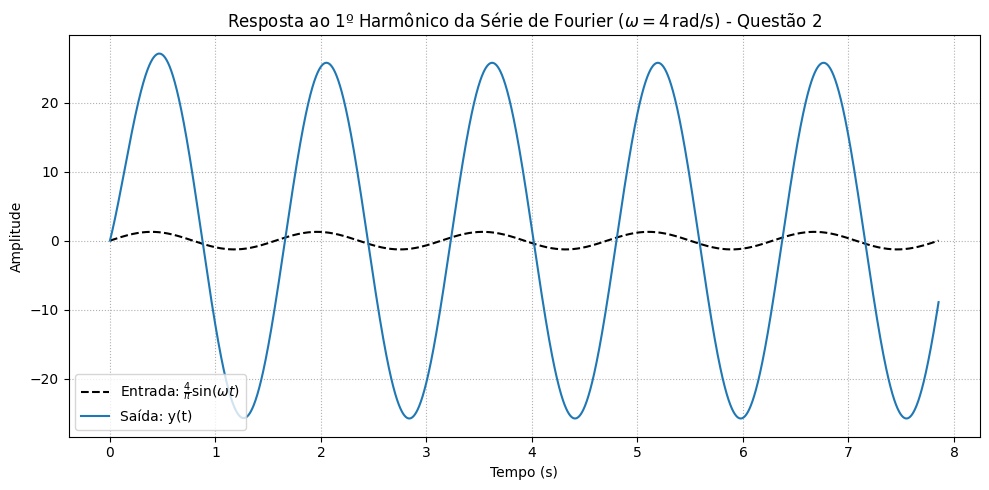

In [ ]:
# Sistema
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Frequência do 1º harmônico (fundamental da onda quadrada)
omega = 4
T = 2 * np.pi / omega

# Entrada: primeiro harmônico da série de Fourier
t = np.linspace(0, 5*T, 5000)
u = (4 / np.pi) * np.sin(omega * t)

# Resposta
tout, y, _ = signal.lsim(system, U=u, T=t)

# Gráfico
plt.figure(figsize=(10, 5))
plt.plot(tout, u, 'k--', label=r'Entrada: $\frac{4}{\pi}\sin(\omega t)$')
plt.plot(tout, y, label='Saída: y(t)')
plt.title(r'Resposta ao 1º Harmônico da Série de Fourier ($\omega = 4\,$rad/s) - Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Letra J - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

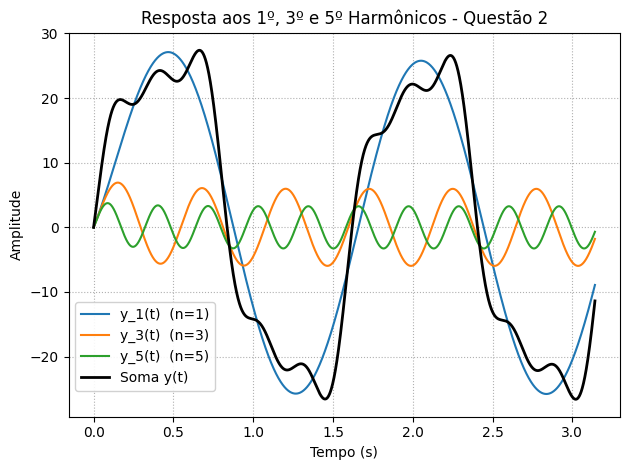

In [ ]:
# Função de transferência H(s) = (12s + 104)/(s + 4)
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Frequência fundamental
omega = 4          # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)   # duas épocas para visualização
u_total = np.zeros_like(t)
y_total = np.zeros_like(t)

# Gera e acumula 1º, 3º e 5º harmônicos
for n in [1, 3, 5]:
    u_n = (4 / (np.pi * n)) * np.sin(n * omega * t)   # entrada
    tout, y_n, _ = signal.lsim(system, U=u_n, T=t)    # saída
    u_total += u_n
    y_total += y_n
    plt.plot(t, y_n, label=f'y_{n}(t)  (n={n})')

# Gráficos
plt.plot(t, y_total, 'k', linewidth=2, label='Soma y(t)')
plt.title('Resposta aos 1º, 3º e 5º Harmônicos - Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.tight_layout()
plt.show()

### Letra K - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

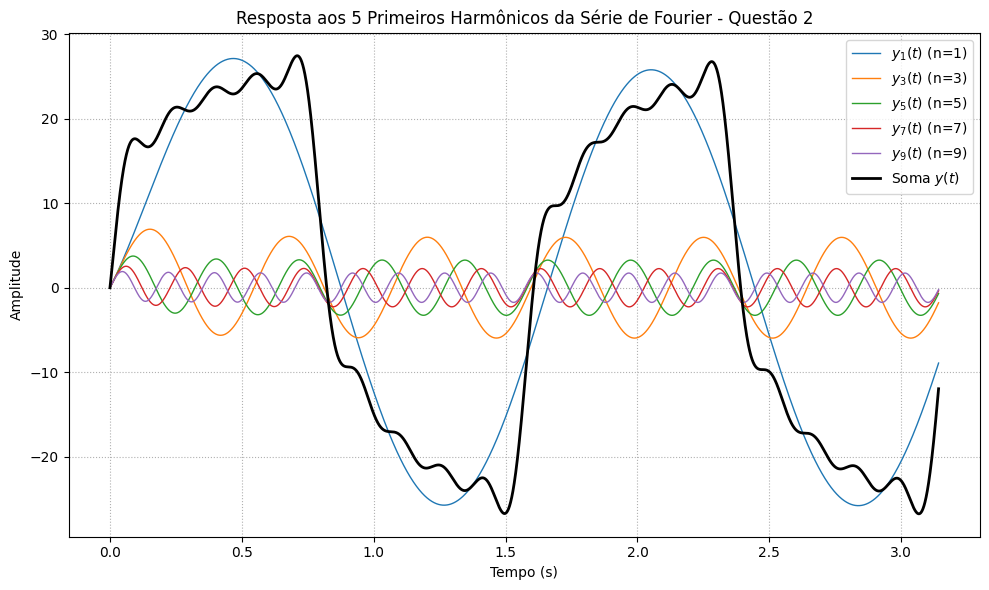

In [ ]:
# Sistema: H(s) = (12s + 104)/(s + 4)
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Frequência fundamental da onda quadrada
omega = 4  # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)  # duas épocas

# Inicialização das somas
u_total = np.zeros_like(t)
y_total = np.zeros_like(t)

# Lista dos primeiros 5 harmônicos ímpares: n = 1, 3, 5, 7, 9
harmonicos = [1, 3, 5, 7, 9]

plt.figure(figsize=(10, 6))

# Geração e acumulação das respostas
for n in harmonicos:
    u_n = (4 / (np.pi * n)) * np.sin(n * omega * t)  # entrada: harmônico n
    tout, y_n, _ = signal.lsim(system, U=u_n, T=t)   # saída para H(s)
    u_total += u_n
    y_total += y_n
    plt.plot(t, y_n, label=f'$y_{n}(t)$ (n={n})', linewidth=1)

# Soma total
plt.plot(t, y_total, 'k', linewidth=2, label='Soma $y(t)$')
plt.title('Resposta aos 5 Primeiros Harmônicos da Série de Fourier - Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Letra L - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

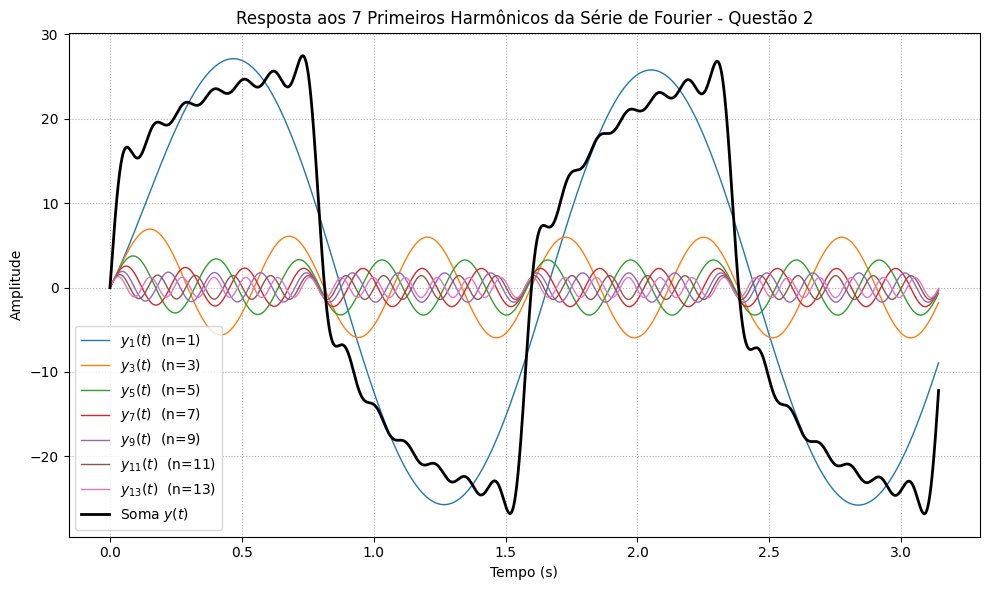

In [ ]:
# Função de transferência H(s) = (12s + 104)/(s + 4)
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Frequência fundamental da onda quadrada
omega = 4            # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2 * T, 5000)   # duas épocas de observação

# Inicializa acumuladores
u_total = np.zeros_like(t)
y_total = np.zeros_like(t)

# Primeiros 7 harmônicos ímpares: n = 1, 3, 5, 7, 9, 11, 13
harmonics = [1, 3, 5, 7, 9, 11, 13]

plt.figure(figsize=(10, 6))

for n in harmonics:
    u_n = (4 / (np.pi * n)) * np.sin(n * omega * t)  # entrada harmônica
    _, y_n, _ = signal.lsim(system, U=u_n, T=t)      # saída filtrada
    u_total += u_n
    y_total += y_n
    plt.plot(t, y_n, label=f'$y_{{{n}}}(t)$  (n={n})', linewidth=1)

# Soma final dos harmônicos
plt.plot(t, y_total, 'k', linewidth=2, label='Soma $y(t)$')
plt.title('Resposta aos 7 Primeiros Harmônicos da Série de Fourier - Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Letra M - Resposta a uma Dente de Serra de Frequência ω

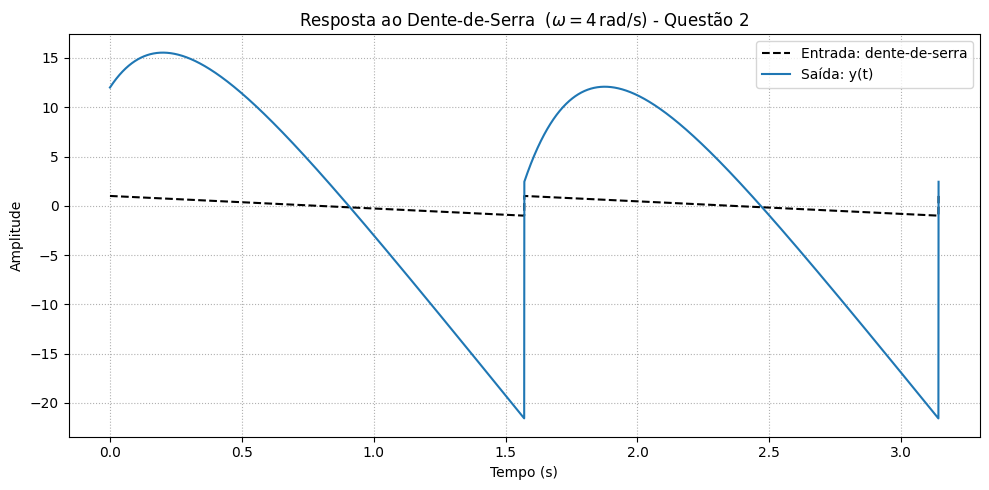

In [ ]:
# Função de transferência H(s) = (12s + 104) / (s + 4)
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Frequência fundamental (escolha "sábia")
omega = 4           # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)          # duas épocas

# Gera o dente-de-serra (amplitude ±1, média zero)
u = signal.sawtooth(omega * t, width=0)   # width=0 ⇒ rampa cresce

# Calcula a saída do sistema
tout, y, _ = signal.lsim(system, U=u, T=t)

# Plota entrada e saída
plt.figure(figsize=(10, 5))
plt.plot(tout, u, 'k--', label='Entrada: dente-de-serra')
plt.plot(tout, y,  label='Saída: y(t)')
plt.title(r'Resposta ao Dente-de-Serra  ($\omega = 4\,$rad/s) - Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Letra N - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

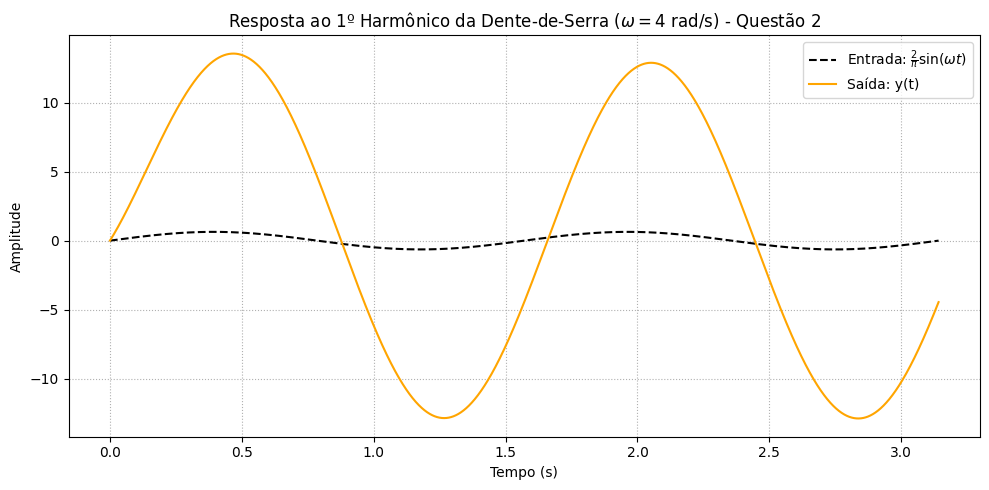

In [ ]:
# Função de transferência: H(s) = (12s + 104) / (s + 4)
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Frequência fundamental
omega = 4  # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)  # duas épocas

# Primeiro harmônico da série de Fourier do dente-de-serra
u = (2 / np.pi) * np.sin(omega * t)

# Resposta do sistema
tout, y, _ = signal.lsim(system, U=u, T=t)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(t, u, 'k--', label=r'Entrada: $\frac{2}{\pi} \sin(\omega t)$')
plt.plot(t, y, color='orange', label='Saída: y(t)')
plt.title(r'Resposta ao 1º Harmônico da Dente-de-Serra ($\omega = 4$ rad/s) - Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Letra O - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

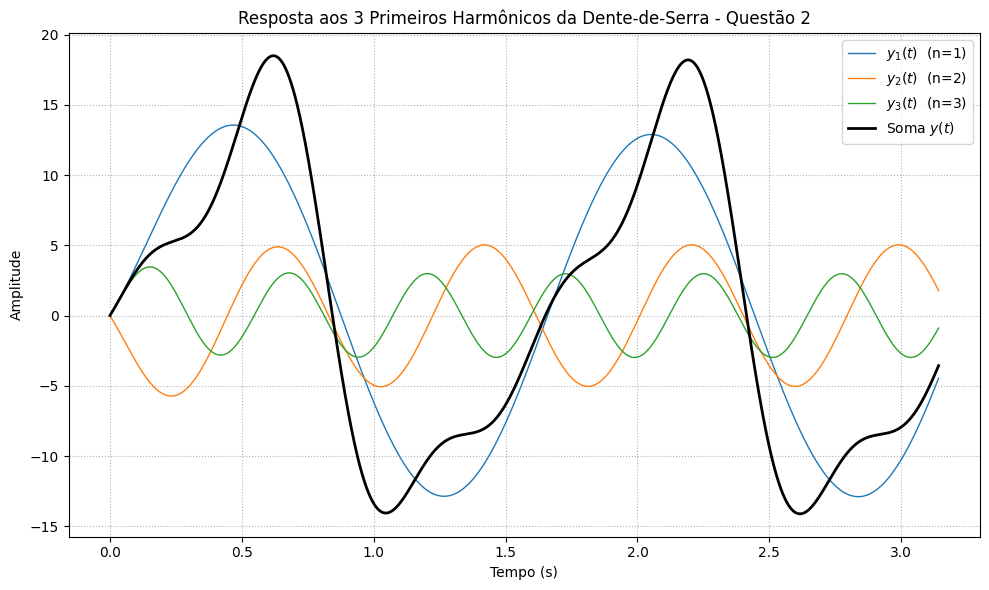

In [ ]:
# Função de transferência: H(s) = (12s + 104)/(s + 4)
num = [12, 104]
den = [1, 4]
system = signal.TransferFunction(num, den)

# Frequência fundamental do dente-de-serra
omega = 4          # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)   # duas épocas para visualização

# Inicializa sinais de entrada e saída
u_total = np.zeros_like(t)
y_total = np.zeros_like(t)

# Três primeiros harmônicos (n = 1, 2, 3)
harmonics = [1, 2, 3]

plt.figure(figsize=(10, 6))

for n in harmonics:
    coef = (2 / np.pi) * ((-1)**(n + 1)) / n     # coeficiente da série
    u_n = coef * np.sin(n * omega * t)           # entrada harmônica
    _, y_n, _ = signal.lsim(system, U=u_n, T=t)  # saída filtrada

    u_total += u_n
    y_total += y_n

    plt.plot(t, y_n, label=fr'$y_{n}(t)$  (n={n})', linewidth=1)

# Plota soma total
plt.plot(t, y_total, 'k', linewidth=2, label='Soma $y(t)$')
plt.title('Resposta aos 3 Primeiros Harmônicos da Dente-de-Serra - Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Letra P - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

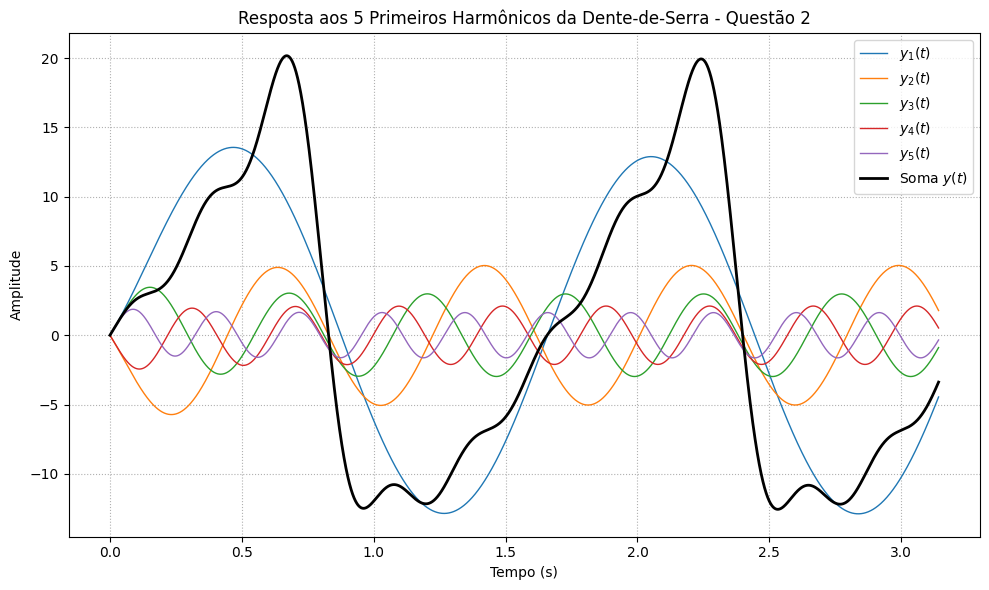

In [ ]:
# --- Sistema ----------------------------------------------------------
num = [12, 104]           # numerador  (12s + 104)
den = [1, 4]              # denominador (s + 4)
system = signal.TransferFunction(num, den)

# --- Parâmetros da dente-de-serra -------------------------------------
omega = 4                 # rad/s  (frequência fundamental)
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)          # duas épocas para visualizar

# --- Acumulação dos 5 primeiros harmônicos ----------------------------
u_sum = np.zeros_like(t)
y_sum = np.zeros_like(t)

plt.figure(figsize=(10, 6))
for n in [1, 2, 3, 4, 5]:
    coef = (2 / np.pi) * ((-1)**(n + 1)) / n   # coeficiente da série
    u_n = coef * np.sin(n * omega * t)         # entrada harmônica
    _, y_n, _ = signal.lsim(system, U=u_n, T=t)  # saída filtrada
    u_sum += u_n
    y_sum += y_n
    plt.plot(t, y_n, lw=1, label=fr'$y_{n}(t)$')

# --- Soma total --------------------------------------------------------
plt.plot(t, y_sum, 'k', lw=2, label='Soma $y(t)$')
plt.title('Resposta aos 5 Primeiros Harmônicos da Dente-de-Serra - Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()


### Letra Q - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω


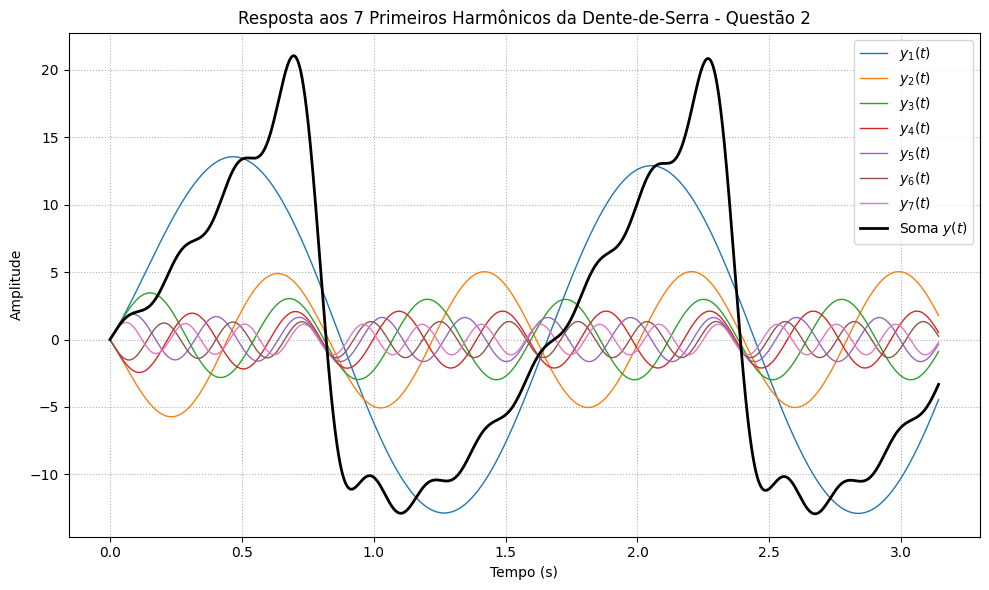

In [ ]:
# --- Sistema ----------------------------------------------------------
num = [12, 104]           # numerador  (12s + 104)
den = [1, 4]              # denominador (s + 4)
system = signal.TransferFunction(num, den)

# --- Parâmetros da dente-de-serra -------------------------------------
omega = 4                 # rad/s  (frequência fundamental)
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)          # duas épocas para visualizar

y_sum = np.zeros_like(t)
plt.figure(figsize=(10, 6))
for n in range(1, 8):  # n = 1 … 7

    coef = (2/np.pi)*((-1)**(n+1))/n
    u_n  = coef*np.sin(n*omega*t)
    _, y_n, _ = signal.lsim(system, U=u_n, T=t)
    y_sum += y_n
    plt.plot(t, y_n, lw=1, label=fr'$y_{n}(t)$')

plt.plot(t, y_sum, 'k', lw=2, label='Soma $y(t)$')
plt.title('Resposta aos 7 Primeiros Harmônicos da Dente-de-Serra - Questão 2')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

## Questão 3



### Diagrama em Blocos 1

Com base no desenvolvimento presente no PDF do Trabalho Escrito, a função de transferência é: $H(s) = \frac{1}{s^2+s+1}$.

#### Letra C - Diagrama de Pólos e Zeros

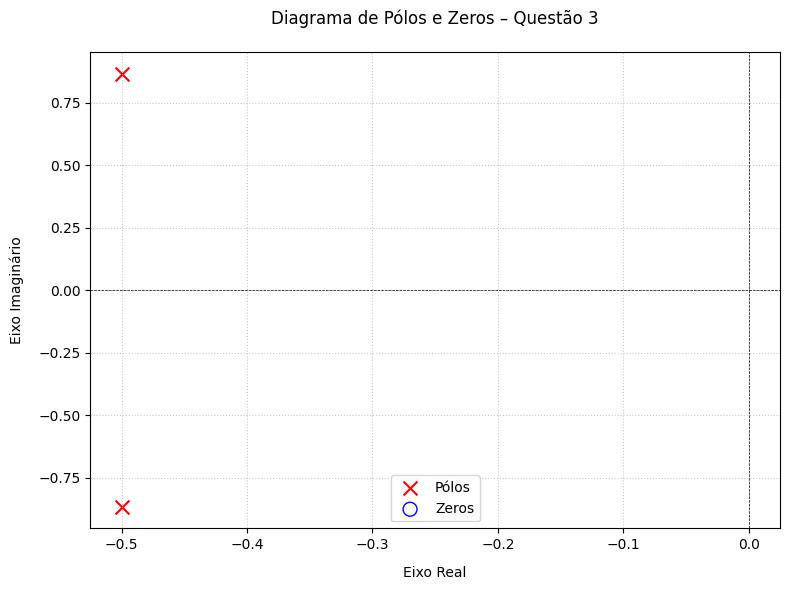

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Cálculo dos polos e zeros
zeros = system.zeros
poles = system.poles

# Gráfico
plt.figure(figsize=(8, 6))
plt.scatter(np.real(poles), np.imag(poles), marker='x', s=100, color='r', label='Pólos')
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', s=100, facecolors='none', edgecolors='b', label='Zeros')

# Configurações
plt.axhline(0, color='black', lw=0.5, linestyle='--')
plt.axvline(0, color='black', lw=0.5, linestyle='--')
plt.title('Diagrama de Pólos e Zeros – Questão 3', pad=20)
plt.xlabel('Eixo Real', labelpad=10)
plt.ylabel('Eixo Imaginário', labelpad=10)
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

####Letra D - Diagrama de Bode

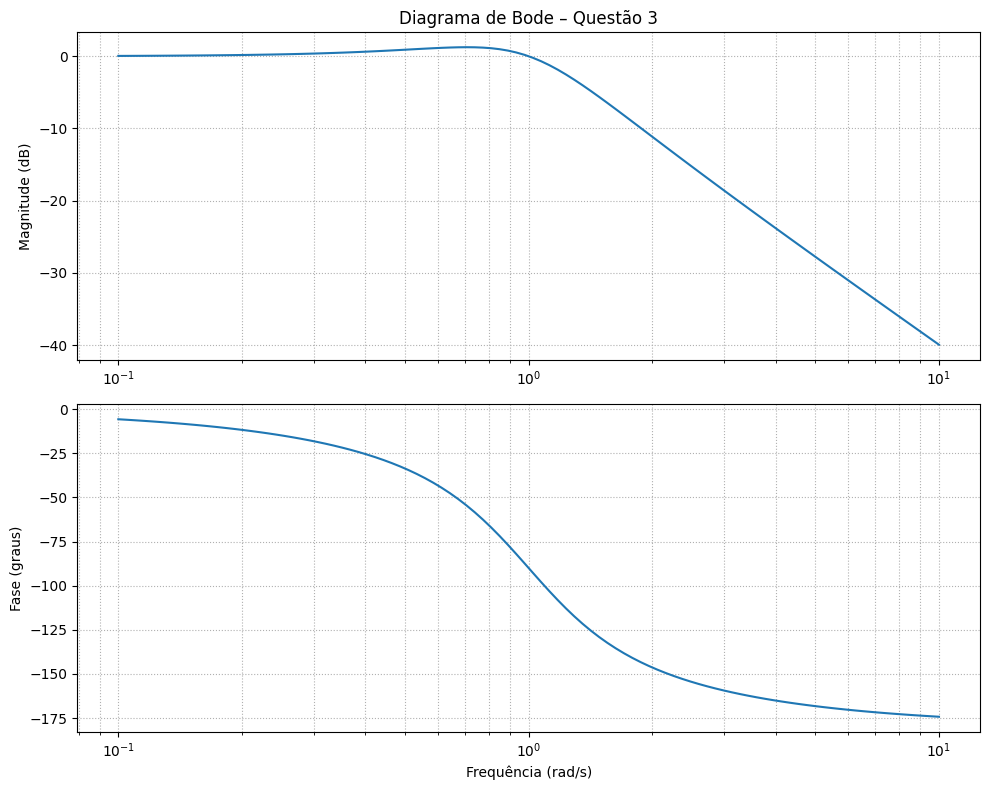

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Frequências e resposta de Bode
w, mag, phase = signal.bode(system)

# Plot
plt.figure(figsize=(10, 8))

# Magnitude
plt.subplot(2, 1, 1)
plt.semilogx(w, mag)
plt.title('Diagrama de Bode – Questão 3')
plt.ylabel('Magnitude (dB)')
plt.grid(True, which='both', linestyle=':')

# Fase
plt.subplot(2, 1, 2)
plt.semilogx(w, phase)
plt.xlabel('Frequência (rad/s)')
plt.ylabel('Fase (graus)')
plt.grid(True, which='both', linestyle=':')

plt.tight_layout()
plt.show()


#### Letra E - Resposta ao Degrau Unitário

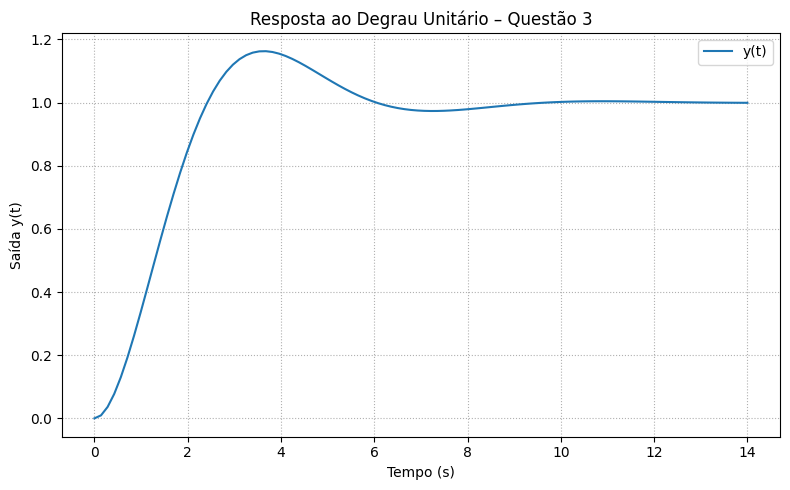

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Resposta ao degrau
t, y = signal.step(system)

# Gráfico
plt.figure(figsize=(8, 5))
plt.plot(t, y, label='y(t)')
plt.title('Resposta ao Degrau Unitário – Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Saída y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra F - Resposta a Rampa Unitária

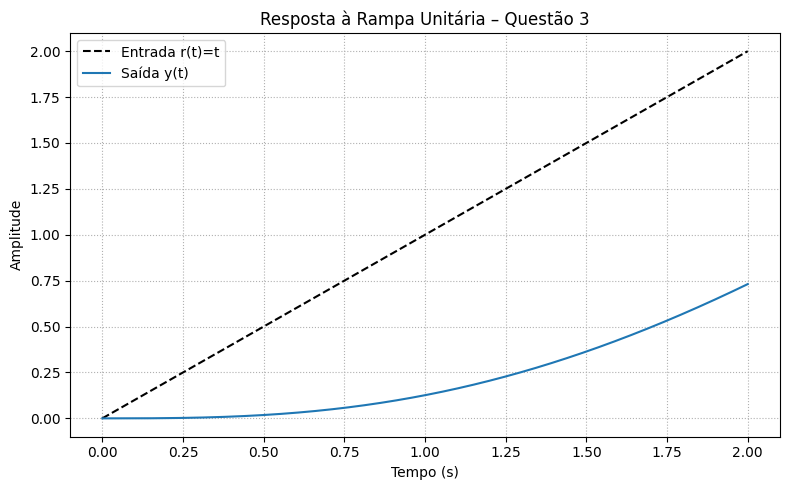

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Geração da rampa unitária
t = np.linspace(0, 2, 1000)           # 0-2 s
u = t                                 # rampa: u(t)=t

# Simulação da resposta com lsim
tout, y, _ = signal.lsim(system, U=u, T=t)

# Plot
plt.figure(figsize=(8, 5))
plt.plot(tout, u, 'k--', label='Entrada r(t)=t')
plt.plot(tout, y,  label='Saída y(t)')
plt.title('Resposta à Rampa Unitária – Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra G - Resposta à uma Onda Quadrada de Frequência ω

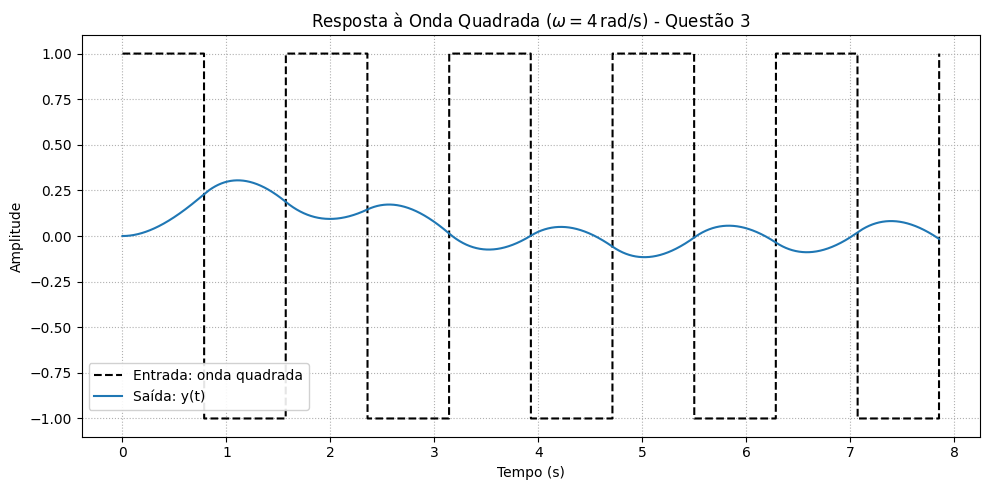

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Frequência "sábia": ω = 4 rad/s (canto do pólo)
omega = 4
T = 2 * np.pi / omega

# Onda quadrada ±1
t = np.linspace(0, 5*T, 5000)
u = signal.square(omega * t)

# Resposta
tout, y, _ = signal.lsim(system, U=u, T=t)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(tout, u, 'k--', label='Entrada: onda quadrada')
plt.plot(tout, y, label='Saída: y(t)')
plt.title(r'Resposta à Onda Quadrada ($\omega = 4\,$rad/s) - Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.05), frameon=True, framealpha=0.9)
plt.tight_layout()
plt.show()


#### Letra H - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

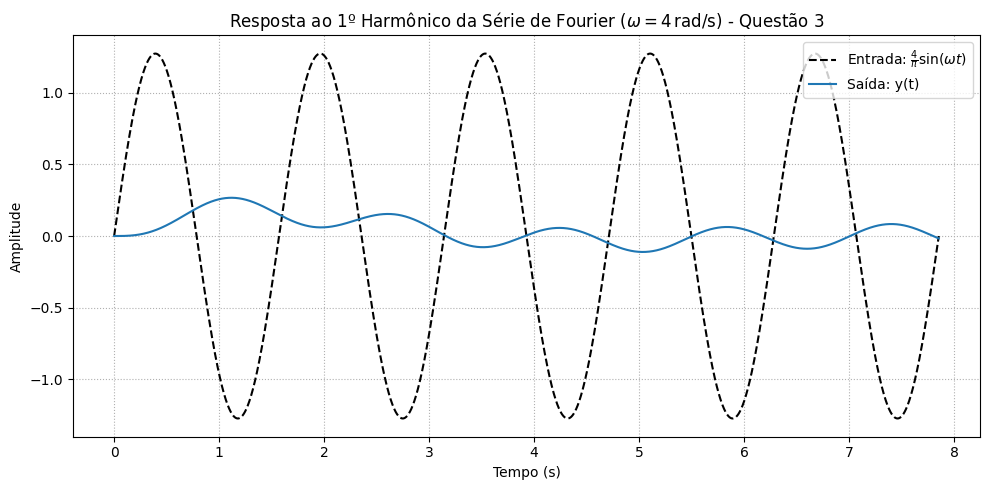

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Frequência do 1º harmônico (fundamental da onda quadrada)
omega = 4
T = 2 * np.pi / omega

# Entrada: primeiro harmônico da série de Fourier
t = np.linspace(0, 5*T, 5000)
u = (4 / np.pi) * np.sin(omega * t)

# Resposta
tout, y, _ = signal.lsim(system, U=u, T=t)

# Gráfico
plt.figure(figsize=(10, 5))
plt.plot(tout, u, 'k--', label=r'Entrada: $\frac{4}{\pi}\sin(\omega t)$')
plt.plot(tout, y, label='Saída: y(t)')
plt.title(r'Resposta ao 1º Harmônico da Série de Fourier ($\omega = 4\,$rad/s) - Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra I - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

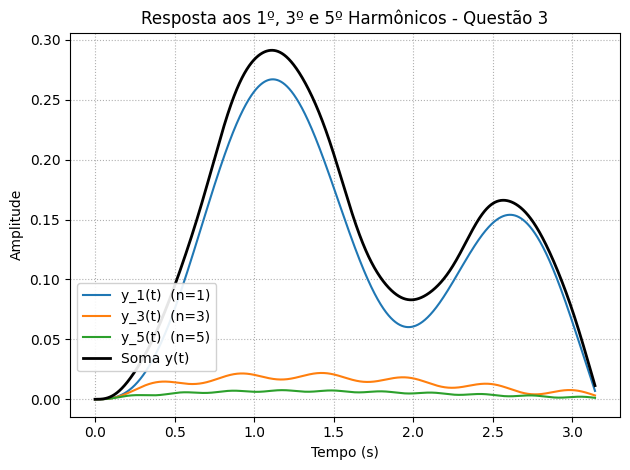

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Frequência fundamental
omega = 4          # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)   # duas épocas para visualização
u_total = np.zeros_like(t)
y_total = np.zeros_like(t)

# Gera e acumula 1º, 3º e 5º harmônicos
for n in [1, 3, 5]:
    u_n = (4 / (np.pi * n)) * np.sin(n * omega * t)   # entrada
    tout, y_n, _ = signal.lsim(system, U=u_n, T=t)    # saída
    u_total += u_n
    y_total += y_n
    plt.plot(t, y_n, label=f'y_{n}(t)  (n={n})')

# Gráficos
plt.plot(t, y_total, 'k', linewidth=2, label='Soma y(t)')
plt.title('Resposta aos 1º, 3º e 5º Harmônicos - Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend(loc='lower left', bbox_to_anchor=(0, 0.1), frameon=True, framealpha=0.9)
plt.tight_layout()
plt.show()

#### Letra J - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

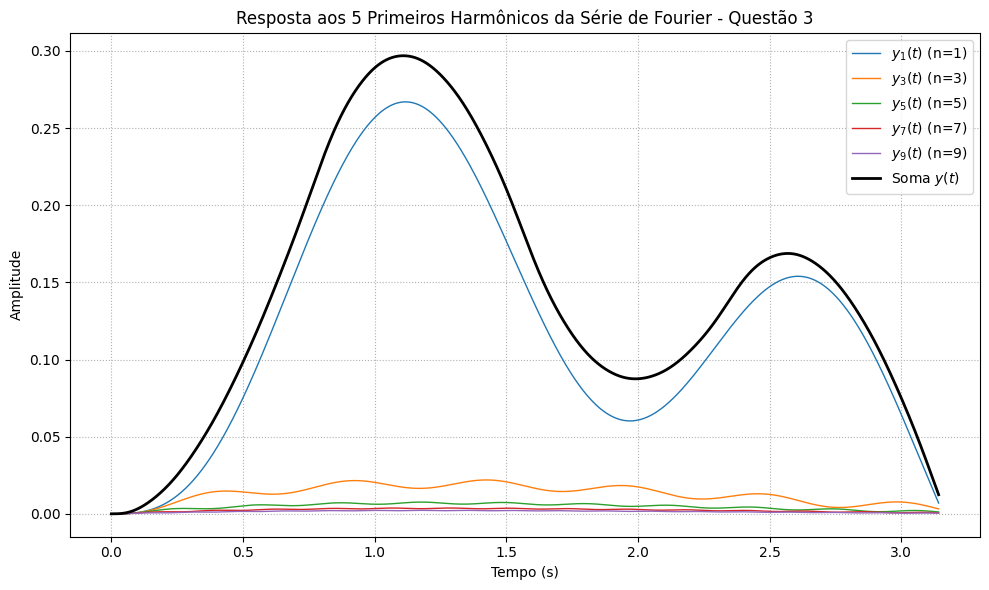

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Frequência fundamental da onda quadrada
omega = 4  # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)  # duas épocas

# Inicialização das somas
u_total = np.zeros_like(t)
y_total = np.zeros_like(t)

# Lista dos primeiros 5 harmônicos ímpares: n = 1, 3, 5, 7, 9
harmonicos = [1, 3, 5, 7, 9]

plt.figure(figsize=(10, 6))

# Geração e acumulação das respostas
for n in harmonicos:
    u_n = (4 / (np.pi * n)) * np.sin(n * omega * t)  # entrada: harmônico n
    tout, y_n, _ = signal.lsim(system, U=u_n, T=t)   # saída para H(s)
    u_total += u_n
    y_total += y_n
    plt.plot(t, y_n, label=f'$y_{n}(t)$ (n={n})', linewidth=1)

# Soma total
plt.plot(t, y_total, 'k', linewidth=2, label='Soma $y(t)$')
plt.title('Resposta aos 5 Primeiros Harmônicos da Série de Fourier - Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra K - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

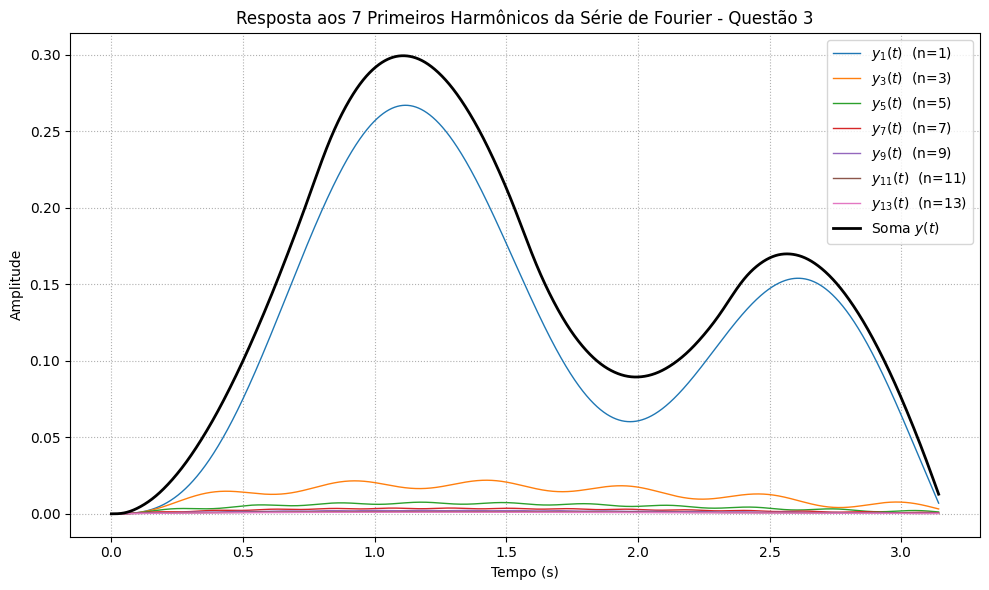

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Frequência fundamental da onda quadrada
omega = 4            # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2 * T, 5000)   # duas épocas de observação

# Inicializa acumuladores
u_total = np.zeros_like(t)
y_total = np.zeros_like(t)

# Primeiros 7 harmônicos ímpares: n = 1, 3, 5, 7, 9, 11, 13
harmonics = [1, 3, 5, 7, 9, 11, 13]

plt.figure(figsize=(10, 6))

for n in harmonics:
    u_n = (4 / (np.pi * n)) * np.sin(n * omega * t)  # entrada harmônica
    _, y_n, _ = signal.lsim(system, U=u_n, T=t)      # saída filtrada
    u_total += u_n
    y_total += y_n
    plt.plot(t, y_n, label=f'$y_{{{n}}}(t)$  (n={n})', linewidth=1)

# Soma final dos harmônicos
plt.plot(t, y_total, 'k', linewidth=2, label='Soma $y(t)$')
plt.title('Resposta aos 7 Primeiros Harmônicos da Série de Fourier - Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra L - Resposta a uma Dente de Serra de Frequência ω

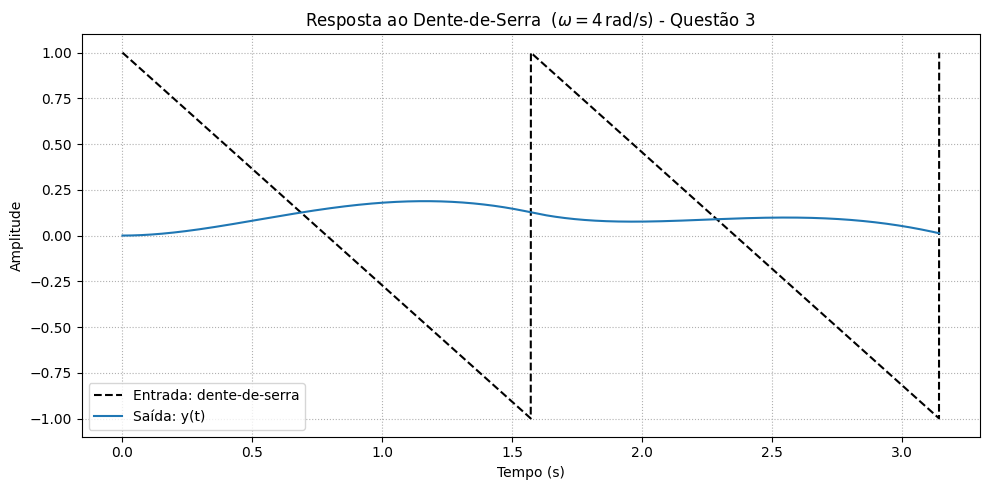

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Frequência fundamental (escolha "sábia")
omega = 4           # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)          # duas épocas

# Gera o dente-de-serra (amplitude ±1, média zero)
u = signal.sawtooth(omega * t, width=0)   # width=0 ⇒ rampa cresce

# Calcula a saída do sistema
tout, y, _ = signal.lsim(system, U=u, T=t)

# Plota entrada e saída
plt.figure(figsize=(10, 5))
plt.plot(tout, u, 'k--', label='Entrada: dente-de-serra')
plt.plot(tout, y,  label='Saída: y(t)')
plt.title(r'Resposta ao Dente-de-Serra  ($\omega = 4\,$rad/s) - Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra M - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

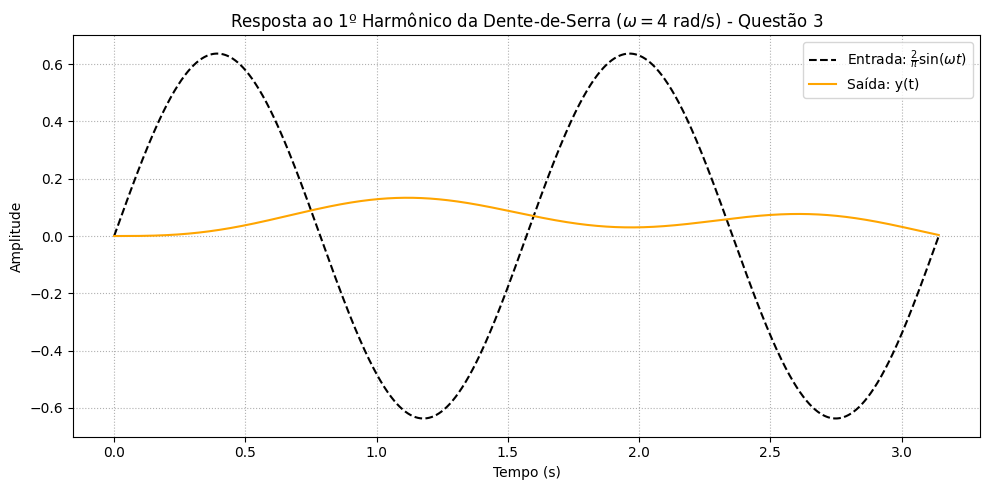

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Frequência fundamental
omega = 4  # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)  # duas épocas

# Primeiro harmônico da série de Fourier do dente-de-serra
u = (2 / np.pi) * np.sin(omega * t)

# Resposta do sistema
tout, y, _ = signal.lsim(system, U=u, T=t)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(t, u, 'k--', label=r'Entrada: $\frac{2}{\pi} \sin(\omega t)$')
plt.plot(t, y, color='orange', label='Saída: y(t)')
plt.title(r'Resposta ao 1º Harmônico da Dente-de-Serra ($\omega = 4$ rad/s) - Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

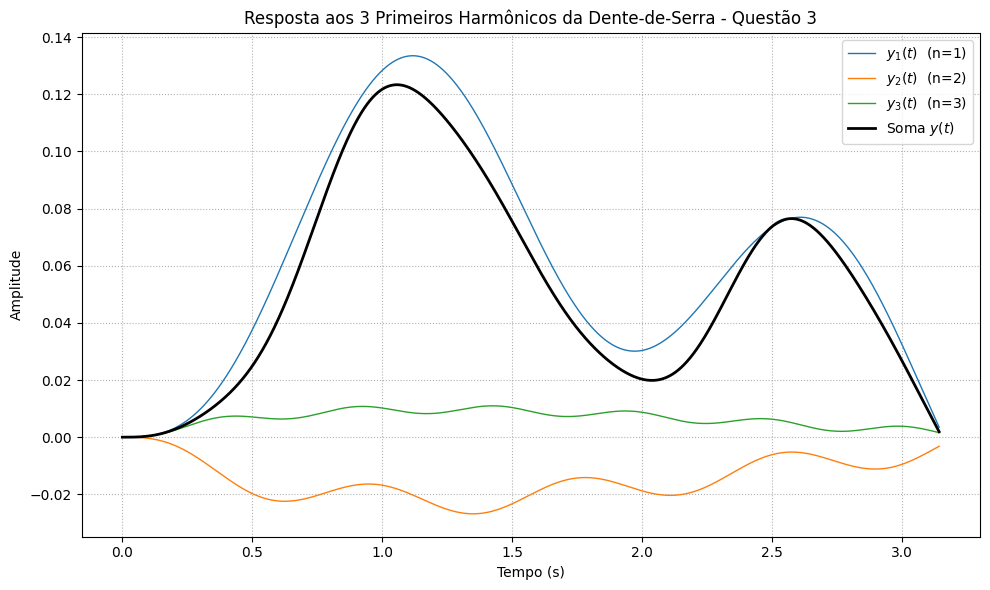

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# Frequência fundamental do dente-de-serra
omega = 4          # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)   # duas épocas para visualização

# Inicializa sinais de entrada e saída
u_total = np.zeros_like(t)
y_total = np.zeros_like(t)

# Três primeiros harmônicos (n = 1, 2, 3)
harmonics = [1, 2, 3]

plt.figure(figsize=(10, 6))

for n in harmonics:
    coef = (2 / np.pi) * ((-1)**(n + 1)) / n     # coeficiente da série
    u_n = coef * np.sin(n * omega * t)           # entrada harmônica
    _, y_n, _ = signal.lsim(system, U=u_n, T=t)  # saída filtrada

    u_total += u_n
    y_total += y_n

    plt.plot(t, y_n, label=fr'$y_{n}(t)$  (n={n})', linewidth=1)

# Plota soma total
plt.plot(t, y_total, 'k', linewidth=2, label='Soma $y(t)$')
plt.title('Resposta aos 3 Primeiros Harmônicos da Dente-de-Serra - Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

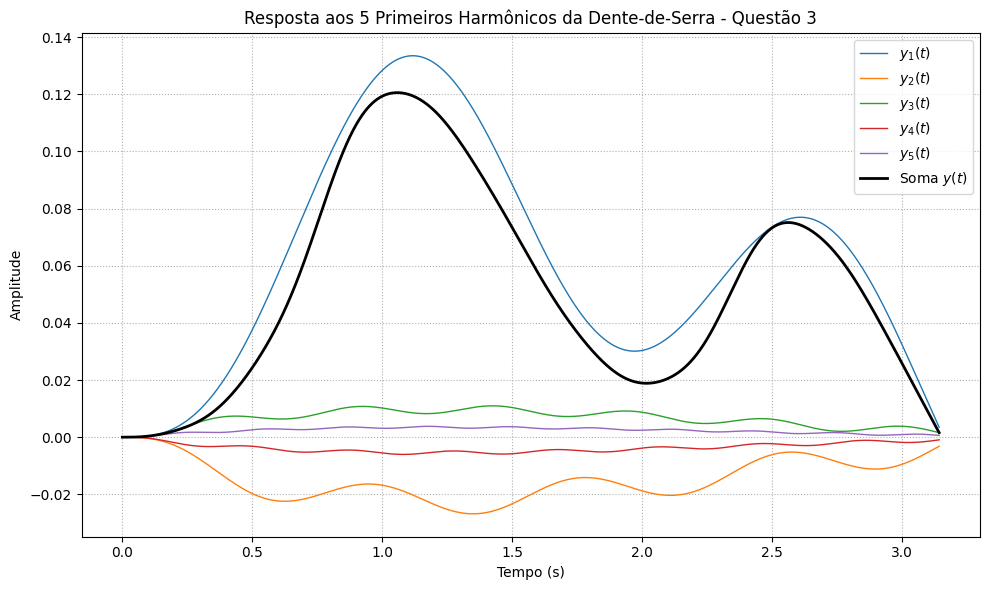

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# --- Parâmetros da dente-de-serra -------------------------------------
omega = 4                 # rad/s  (frequência fundamental)
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)          # duas épocas para visualizar

# --- Acumulação dos 5 primeiros harmônicos ----------------------------
u_sum = np.zeros_like(t)
y_sum = np.zeros_like(t)

plt.figure(figsize=(10, 6))
for n in [1, 2, 3, 4, 5]:
    coef = (2 / np.pi) * ((-1)**(n + 1)) / n   # coeficiente da série
    u_n = coef * np.sin(n * omega * t)         # entrada harmônica
    _, y_n, _ = signal.lsim(system, U=u_n, T=t)  # saída filtrada
    u_sum += u_n
    y_sum += y_n
    plt.plot(t, y_n, lw=1, label=fr'$y_{n}(t)$')

# --- Soma total --------------------------------------------------------
plt.plot(t, y_sum, 'k', lw=2, label='Soma $y(t)$')
plt.title('Resposta aos 5 Primeiros Harmônicos da Dente-de-Serra - Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()


#### Letra P - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω


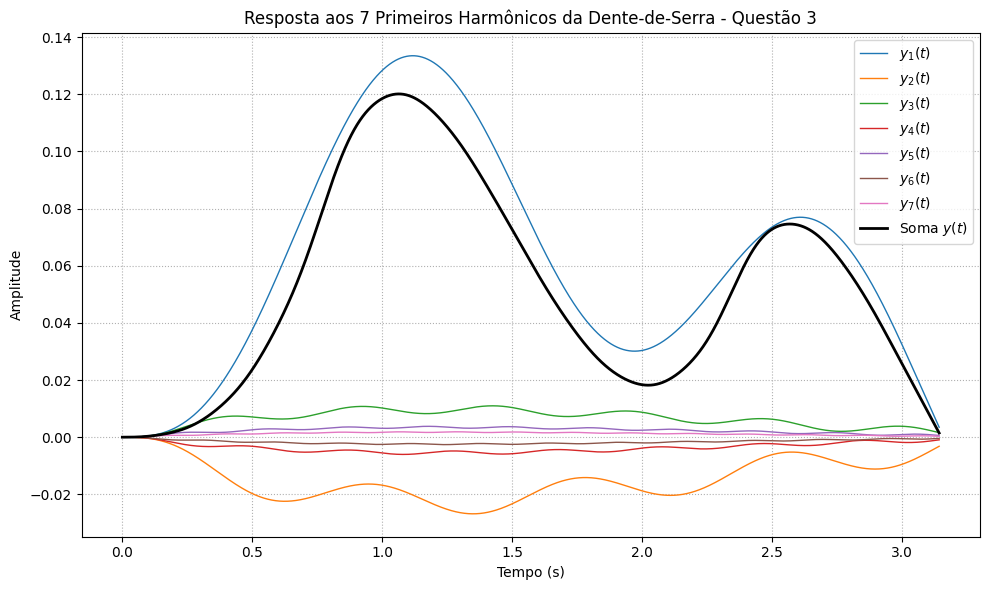

In [ ]:
# Função de transferência: H(s) = 1 / (s^2 + s + 1)
num = [1]
den = [1, 1, 1]
system = signal.TransferFunction(num, den)

# --- Parâmetros da dente-de-serra -------------------------------------
omega = 4                 # rad/s  (frequência fundamental)
T = 2 * np.pi / omega
t = np.linspace(0, 2*T, 5000)          # duas épocas para visualizar

y_sum = np.zeros_like(t)
plt.figure(figsize=(10, 6))
for n in range(1, 8):  # n = 1 … 7

    coef = (2/np.pi)*((-1)**(n+1))/n
    u_n  = coef*np.sin(n*omega*t)
    _, y_n, _ = signal.lsim(system, U=u_n, T=t)
    y_sum += y_n
    plt.plot(t, y_n, lw=1, label=fr'$y_{n}(t)$')

plt.plot(t, y_sum, 'k', lw=2, label='Soma $y(t)$')
plt.title('Resposta aos 7 Primeiros Harmônicos da Dente-de-Serra - Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

### Diagrama em Blocos 2

Com base no desenvolvimento presente no PDF do Trabalho Escrito, a função de transferência é: $H(s) = \frac{7}{s^2 + 14s + 63}$.

#### Letra C - Diagrama de Pólos e Zeros

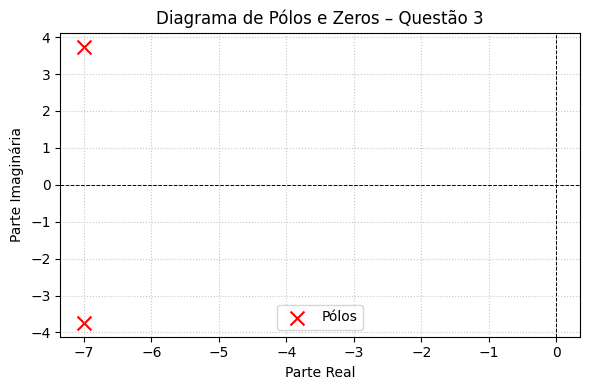

In [ ]:
# Função de transferência H(s) = 7 / (s^2 + 14 s + 63)
num = [7]                # numerador constante
den = [1, 14, 63]        # s² + 14 s + 63

sys = signal.TransferFunction(num, den)

# Cálculo de pólos e zeros
zeros = np.roots(num)          # vazio (array([], dtype=float64))
poles = np.roots(den)          # [-7 ± j*sqrt(14)]

# Gráfico
plt.figure(figsize=(6,4))
plt.axhline(0, color='black', lw=0.7, ls='--')
plt.axvline(0, color='black', lw=0.7, ls='--')

plt.scatter(np.real(poles), np.imag(poles),
            marker='x', s=100, color='red', label='Pólos')
if zeros.size > 0:             # não haverá zeros finitos
    plt.scatter(np.real(zeros), np.imag(zeros),
                marker='o', facecolors='none', edgecolors='blue', s=100,
                label='Zeros')

plt.title('Diagrama de Pólos e Zeros – Questão 3')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginária')
plt.grid(True, ls=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

####Letra D - Diagrama de Bode

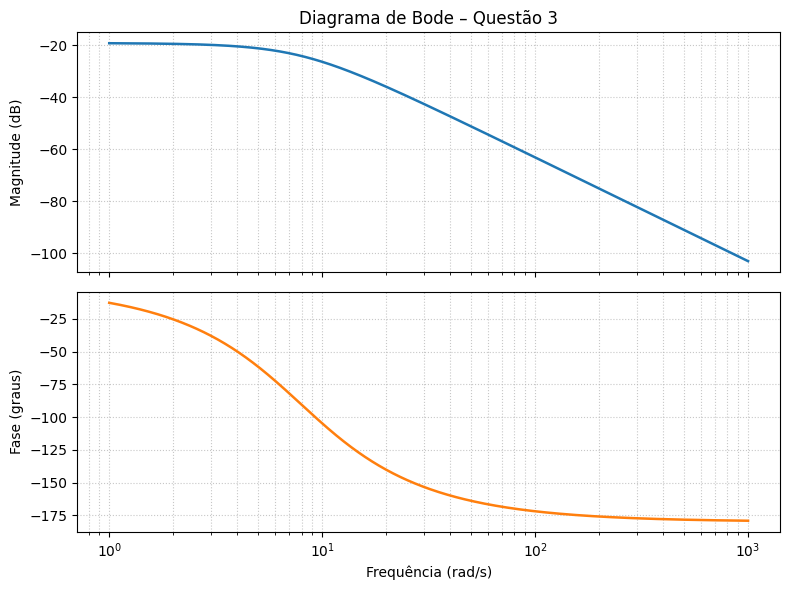

In [ ]:
# ---- Função de transferência H(s) = 7 / (s² + 14 s + 63) ----
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# ---- Cálculo do Bode ---------------------------------------
w = np.logspace(0, 3, 1000)          # 1   rad/s  → 1000 rad/s
w, mag, phase = signal.bode(sys, w)

# ---- Plot --------------------------------------------------
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6), sharex=True)

ax1.semilogx(w, mag, lw=1.8)
ax1.set_ylabel('Magnitude (dB)')
ax1.set_title(r'Diagrama de Bode – Questão 3')
ax1.grid(True, which='both', ls=':', alpha=0.7)

ax2.semilogx(w, phase, color='tab:orange', lw=1.8)
ax2.set_ylabel('Fase (graus)')
ax2.set_xlabel('Frequência (rad/s)')
ax2.grid(True, which='both', ls=':', alpha=0.7)

plt.tight_layout()
plt.show()

#### Letra E - Resposta ao Degrau Unitário

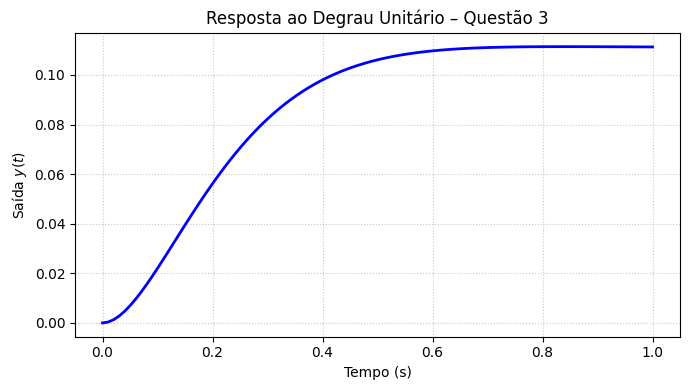

In [ ]:
# Definição da função de transferência: H(s) = 7 / (s^2 + 14s + 63)
num = [7]
den = [1, 14, 63]
system = signal.TransferFunction(num, den)

# Cálculo da resposta ao degrau unitário
t, y = signal.step(system)

# Plot do gráfico
plt.figure(figsize=(7, 4))
plt.plot(t, y, color='blue', lw=2)
plt.title('Resposta ao Degrau Unitário – Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Saída $y(t)$')
plt.grid(True, ls=':', alpha=0.7)
plt.tight_layout()
plt.show()

#### Letra F - Resposta a Rampa Unitária

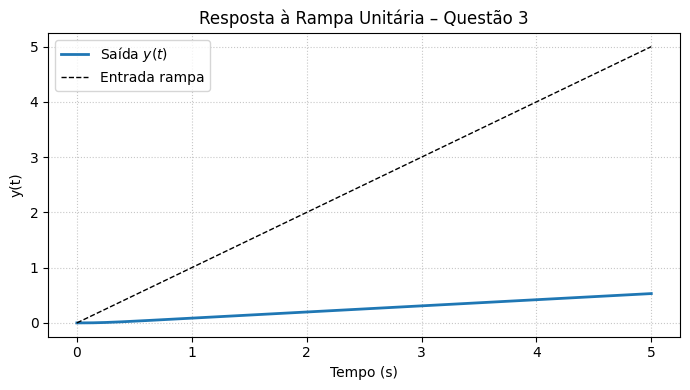

In [ ]:
# Função de transferência: H(s) = 7 / (s² + 14s + 63)
num = [7]
den = [1, 14, 63]
system = signal.TransferFunction(num, den)

# Entrada rampa: x(t) = t -> X(s) = 1/s²
t = np.linspace(0, 5, 1000)
u_rampa = t  # entrada rampa

# Simulação da resposta
t_out, y_out, _ = signal.lsim(system, U=u_rampa, T=t)

# Plot da resposta
plt.figure(figsize=(7, 4))
plt.plot(t_out, y_out, lw=2, label='Saída $y(t)$')
plt.plot(t, u_rampa, 'k--', lw=1, label='Entrada rampa')
plt.title('Resposta à Rampa Unitária – Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, ls=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra G - Resposta à uma Onda Quadrada de Frequência ω

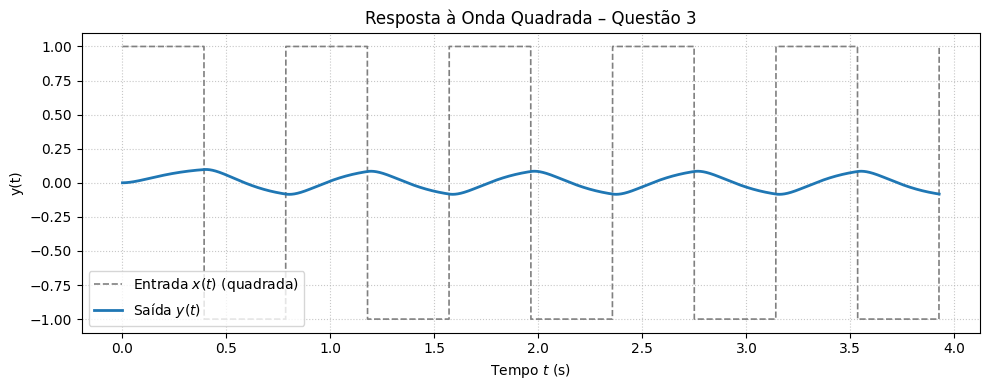

In [ ]:
# -------- sistema: H(s) = 7 / (s^2 + 14 s + 63)
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# -------- entrada: onda quadrada de frequência ω ≈ ω_n
omega = 8.0                 # rad/s   (≈ √63)
f = omega / (2 * np.pi)     # Hz
T = 1 / f                   # período (≈ 0,787 s)

t = np.linspace(0, 5*T, 4000)
x_sq = signal.square(omega * t)       # amplitude ±1

# -------- saída do sistema
t_out, y_out, _ = signal.lsim(sys, U=x_sq, T=t)

# -------- plot
plt.figure(figsize=(10, 4))
plt.plot(t, x_sq, '--', color='gray', lw=1.2, label=r'Entrada $x(t)$ (quadrada)')
plt.plot(t_out, y_out, color='tab:blue', lw=2, label=r'Saída $y(t)$')
plt.title(r'Resposta à Onda Quadrada – Questão 3')
plt.xlabel('Tempo $t$ (s)')
plt.ylabel('y(t)')
plt.grid(True, ls=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra H - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

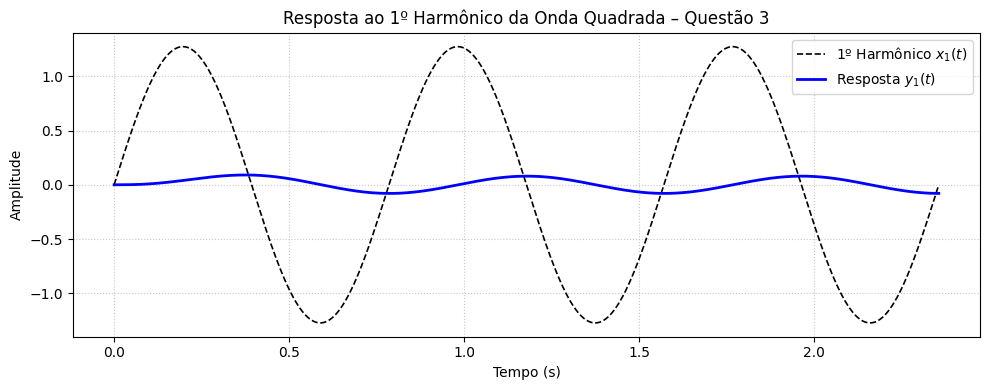

In [ ]:
# Sistema: H(s) = 7 / (s² + 14s + 63)
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# Frequência fundamental da onda quadrada
omega = 8  # rad/s
T = 2 * np.pi / omega

# Entrada: 1º harmônico da série de Fourier
t = np.linspace(0, 3*T, 2000)
x1 = (4/np.pi) * np.sin(omega * t)

# Resposta do sistema a x1(t)
t_out, y_out, _ = signal.lsim(sys, U=x1, T=t)

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, x1, 'k--', lw=1.2, label=r'1º Harmônico $x_1(t)$')
plt.plot(t_out, y_out, 'b-', lw=2, label=r'Resposta $y_1(t)$')
plt.title(r'Resposta ao 1º Harmônico da Onda Quadrada – Questão 3')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra I - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

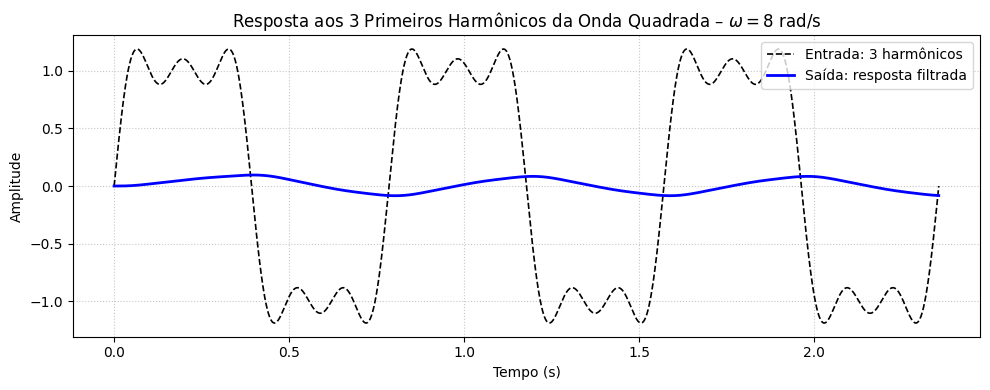

In [ ]:
# Sistema: H(s) = 7 / (s² + 14s + 63)
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
omega = 8  # rad/s
T = 2 * np.pi / omega

# Tempo e sinal de entrada: 3 primeiros harmônicos
t = np.linspace(0, 3*T, 3000)
x = (4/np.pi) * (
    np.sin(omega * t) +
    (1/3) * np.sin(3 * omega * t) +
    (1/5) * np.sin(5 * omega * t)
)

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, x, 'k--', lw=1.2, label='Entrada: 3 harmônicos')
plt.plot(t_out, y_out, 'b-', lw=2, label='Saída: resposta filtrada')
plt.title('Resposta aos 3 Primeiros Harmônicos da Onda Quadrada – $\omega = 8$ rad/s')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra J - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

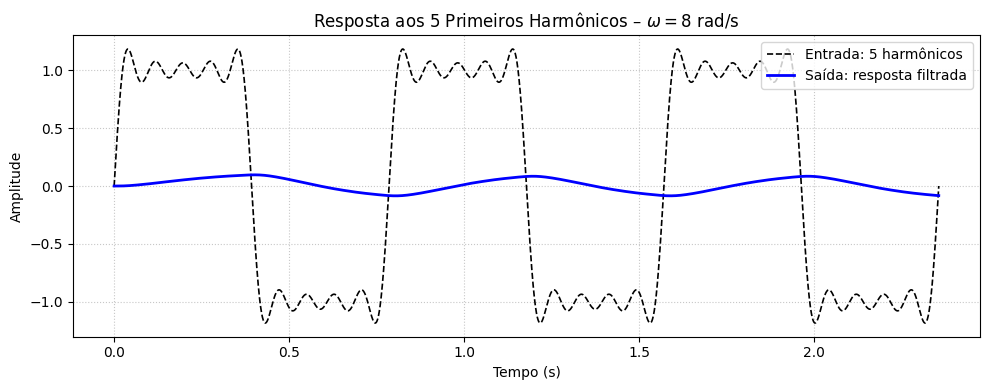

In [ ]:
# Sistema: H(s) = 7 / (s² + 14s + 63)
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
omega = 8  # rad/s
T = 2 * np.pi / omega

# Tempo e entrada com 5 primeiros harmônicos ímpares
t = np.linspace(0, 3*T, 4000)
x = (4/np.pi) * sum([(1/(2*k+1)) * np.sin((2*k+1)*omega*t) for k in range(5)])

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Plotagem
plt.figure(figsize=(10, 4))
plt.plot(t, x, 'k--', lw=1.2, label='Entrada: 5 harmônicos')
plt.plot(t_out, y_out, 'b-', lw=2, label='Saída: resposta filtrada')
plt.title('Resposta aos 5 Primeiros Harmônicos – $\omega = 8$ rad/s')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra K - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

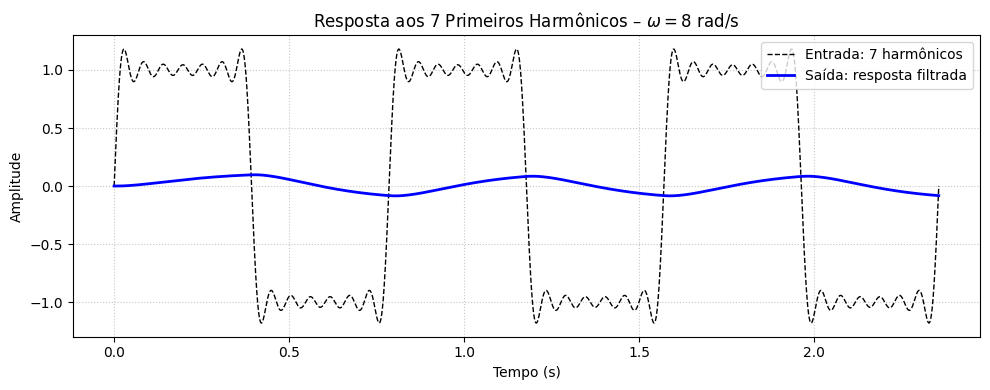

In [ ]:
# Sistema: H(s) = 7 / (s² + 14s + 63)
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# Frequência fundamental da onda quadrada
omega = 8  # rad/s
T = 2 * np.pi / omega

# Tempo e entrada com 7 primeiros harmônicos ímpares
t = np.linspace(0, 3*T, 5000)
x = (4/np.pi) * sum([(1/(2*k+1)) * np.sin((2*k+1)*omega*t) for k in range(7)])

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, x, 'k--', lw=1, label='Entrada: 7 harmônicos')
plt.plot(t_out, y_out, 'b-', lw=2, label='Saída: resposta filtrada')
plt.title('Resposta aos 7 Primeiros Harmônicos – $\omega = 8$ rad/s')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra L - Resposta a uma Dente de Serra de Frequência ω

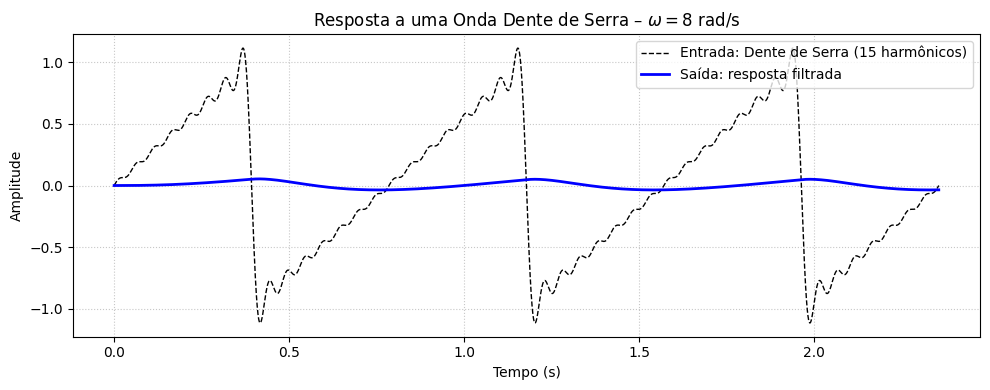

In [ ]:
# Sistema: H(s) = 7 / (s² + 14s + 63)
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# Frequência fundamental da dente de serra
omega = 8  # rad/s
T = 2 * np.pi / omega

# Tempo e entrada dente de serra com 15 harmônicos
t = np.linspace(0, 3*T, 5000)
x = (2/np.pi) * sum([((-1)**(n+1))/n * np.sin(n*omega*t) for n in range(1, 16)])

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, x, 'k--', lw=1, label='Entrada: Dente de Serra (15 harmônicos)')
plt.plot(t_out, y_out, 'b-', lw=2, label='Saída: resposta filtrada')
plt.title('Resposta a uma Onda Dente de Serra – $\omega = 8$ rad/s')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra M - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

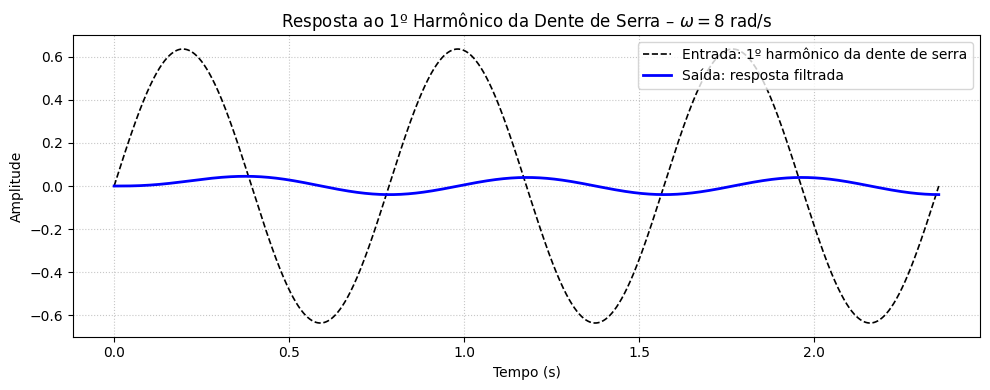

In [ ]:
# Sistema: H(s) = 7 / (s² + 14s + 63)
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
omega = 8  # rad/s
T = 2 * np.pi / omega

# Tempo e entrada com apenas o 1º harmônico da dente de serra
t = np.linspace(0, 3*T, 2000)
x = (2/np.pi) * np.sin(omega * t)

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, x, 'k--', lw=1.2, label='Entrada: 1º harmônico da dente de serra')
plt.plot(t_out, y_out, 'b-', lw=2, label='Saída: resposta filtrada')
plt.title('Resposta ao 1º Harmônico da Dente de Serra – $\omega = 8$ rad/s')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

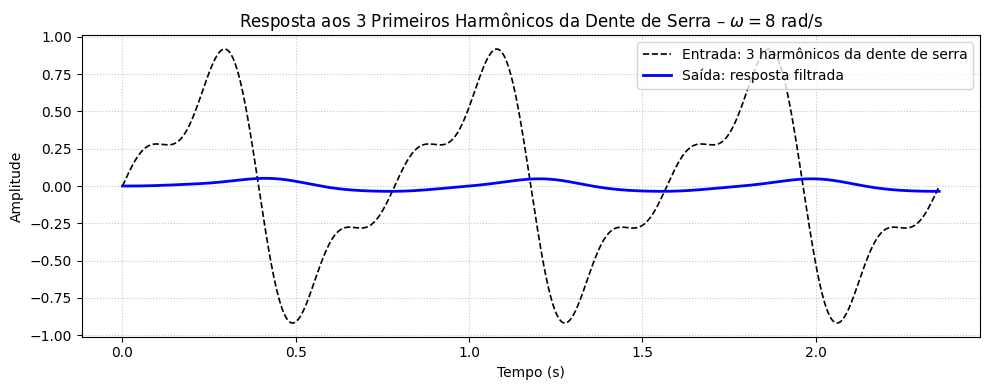

In [ ]:
# Sistema: H(s) = 7 / (s² + 14s + 63)
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
omega = 8  # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 3*T, 3000)

# Entrada: 3 primeiros harmônicos da dente de serra
x = sum([(((-1)**(n+1))/n) * np.sin(n * omega * t) for n in range(1, 4)])
x *= (2 / np.pi)

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, x, 'k--', lw=1.2, label='Entrada: 3 harmônicos da dente de serra')
plt.plot(t_out, y_out, 'b-', lw=2, label='Saída: resposta filtrada')
plt.title('Resposta aos 3 Primeiros Harmônicos da Dente de Serra – $\omega = 8$ rad/s')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

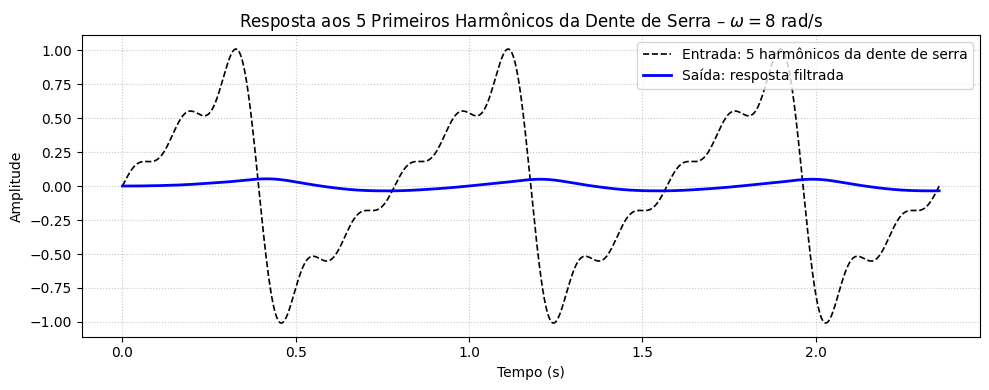

In [ ]:
# Sistema: H(s) = 7 / (s² + 14s + 63)
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
omega = 8  # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 3*T, 3000)

# Entrada: 5 primeiros harmônicos da dente de serra
x = sum([(((-1)**(n+1))/n) * np.sin(n * omega * t) for n in range(1, 6)])
x *= (2 / np.pi)

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, x, 'k--', lw=1.2, label='Entrada: 5 harmônicos da dente de serra')
plt.plot(t_out, y_out, 'b-', lw=2, label='Saída: resposta filtrada')
plt.title('Resposta aos 5 Primeiros Harmônicos da Dente de Serra – $\omega = 8$ rad/s')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

#### Letra P - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω


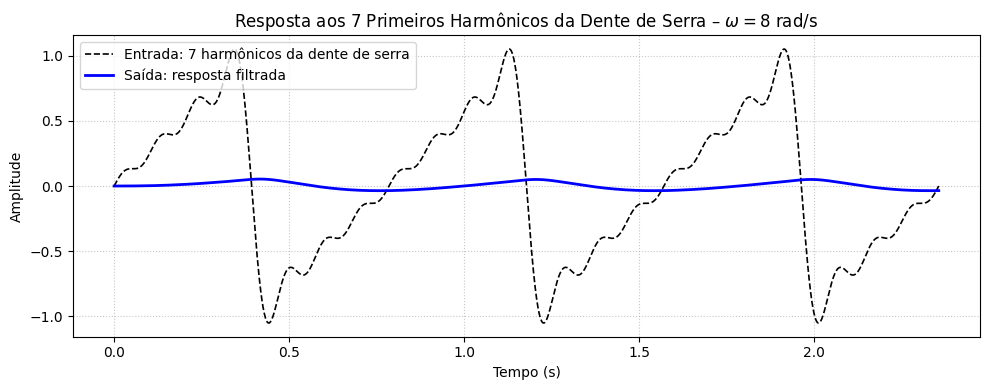

In [ ]:
# Sistema: H(s) = 7 / (s² + 14s + 63)
num = [7]
den = [1, 14, 63]
sys = signal.TransferFunction(num, den)

# Frequência fundamental
omega = 8  # rad/s
T = 2 * np.pi / omega
t = np.linspace(0, 3*T, 3000)

# Entrada: 7 primeiros harmônicos da dente de serra
x = sum([(((-1)**(n+1))/n) * np.sin(n * omega * t) for n in range(1, 8)])
x *= (2 / np.pi)

# Resposta do sistema
t_out, y_out, _ = signal.lsim(sys, U=x, T=t)

# Gráfico
plt.figure(figsize=(10, 4))
plt.plot(t, x, 'k--', lw=1.2, label='Entrada: 7 harmônicos da dente de serra')
plt.plot(t_out, y_out, 'b-', lw=2, label='Saída: resposta filtrada')
plt.title('Resposta aos 7 Primeiros Harmônicos da Dente de Serra – $\omega = 8$ rad/s')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True, linestyle=':', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

## Questão 4



### Sistema 1

Sistema descrito por $H(s) = \frac{1 + \alpha s}{s^2 + 2s + 2}$, para $\alpha = \{0.001, 0.01, 0.1, 1, 10, 100, 1000\}$.

#### Letra B - Diagrama de Pólos e Zeros

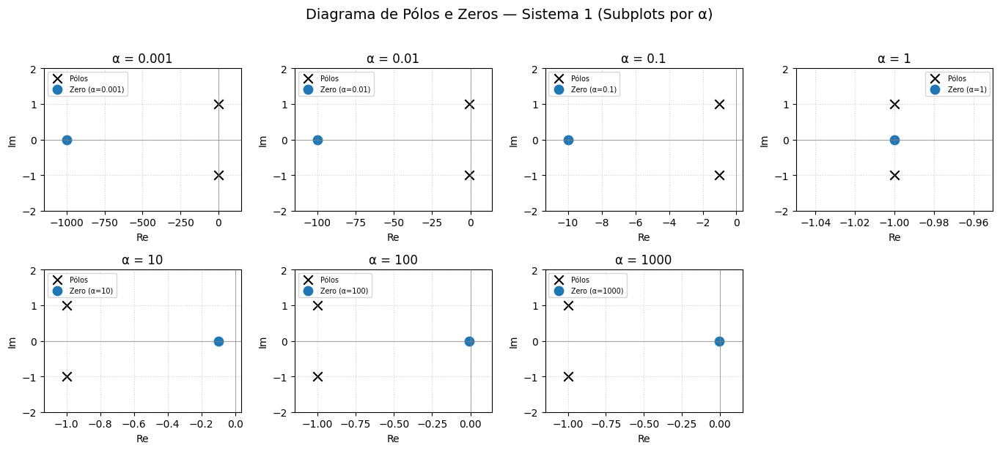

In [ ]:
# Valores de α
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]

# Denominador fixo (pólos)
den = [1, 2, 2]
poles = np.roots(den)

# Cria figura com subplots (2 × 4 → 8 locais; 1 fica vazio)
fig, axes = plt.subplots(2, 4, figsize=(14, 6))
axes = axes.flatten()

for ax, alpha in zip(axes, alphas):
    zeros = np.roots([alpha, 1])            # Numerador αs + 1
    ax.scatter(np.real(poles), np.imag(poles), s=80, c='k', marker='x', label='Pólos')
    ax.scatter(np.real(zeros), np.imag(zeros), s=80, c='tab:blue', marker='o', label=f'Zero (α={alpha})')
    ax.axhline(0, color='grey', lw=0.5)
    ax.axvline(0, color='grey', lw=0.5)
    x_vals = np.concatenate((np.real(poles), np.real(zeros)))
    x_min, x_max = x_vals.min(), x_vals.max()
    margin = 0.15 * (x_max - x_min if x_max > x_min else 1)
    ax.set_xlim(x_min - margin, x_max + margin)
    ax.set_ylim(-2, 2)
    ax.set_title(f'α = {alpha}')
    ax.set_xlabel('Re')
    ax.set_ylabel('Im')
    ax.grid(True, ls=':', alpha=0.6)
    ax.legend(fontsize='x-small')

# Desativa painel excedente se houver
for ax in axes[len(alphas):]:
    ax.axis('off')

fig.suptitle('Diagrama de Pólos e Zeros — Sistema 1 (Subplots por α)', y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

####Letra C - Diagrama de Bode

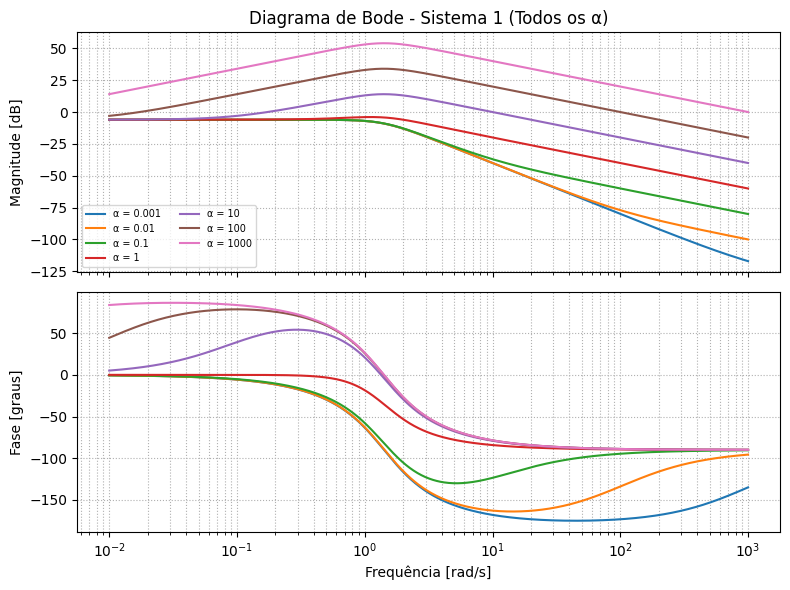

In [ ]:
# Valores de α do enunciado
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]

# Denominador fixo do Sistema 1
den = [1, 2, 2]

# Geração de grade log-espacial de frequência
w = np.logspace(-2, 3, 1000)   # 10⁻² a 10³ rad/s

# ---------- Figura com dois subplots (módulo e fase) ----------
fig, (ax_mag, ax_phase) = plt.subplots(2, 1, figsize=(8, 6), sharex=True)

for alpha in alphas:
    num = [alpha, 1]                   # numerador 1 + αs
    sys = signal.TransferFunction(num, den)   # sistema LTI
    w, mag, phase = signal.bode(sys, w)       # resposta em frequência
    ax_mag.semilogx(w, mag, label=f'α = {alpha}')
    ax_phase.semilogx(w, phase)

# ——— Configurações do gráfico ———
# Magnitude
ax_mag.set_title('Diagrama de Bode - Sistema 1 (Todos os α)')
ax_mag.set_ylabel('Magnitude [dB]')
ax_mag.grid(True, which='both', ls=':')
ax_mag.legend(fontsize='x-small', ncol=2)

# Fase
ax_phase.set_ylabel('Fase [graus]')
ax_phase.set_xlabel('Frequência [rad/s]')
ax_phase.grid(True, which='both', ls=':')

plt.tight_layout()
plt.show()


#### Letra D - Resposta ao Degrau Unitário

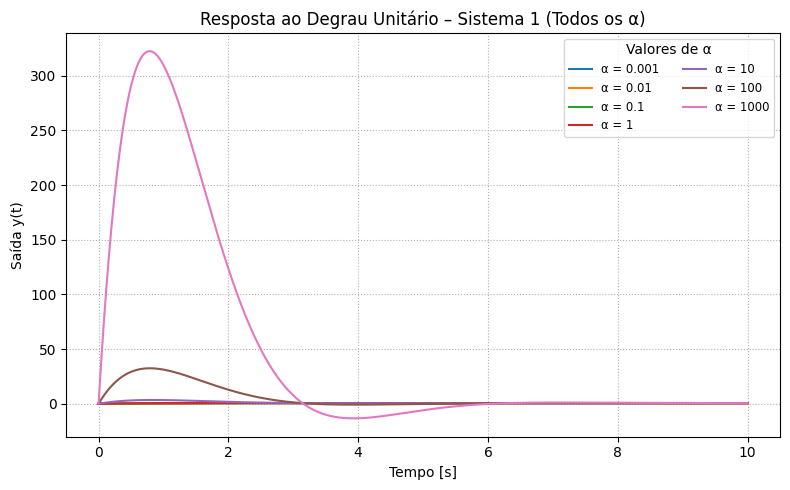

In [ ]:
# Valores de α dados no enunciado
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]

# Denominador fixo
den = [1, 2, 2]

# Geração da grade de tempo
t = np.linspace(0, 10, 1000)

# Figura
plt.figure(figsize=(8, 5))

# Laço para plotar cada resposta
for alpha in alphas:
    num = [alpha, 1]                   # numerador: 1 + αs
    sys = signal.TransferFunction(num, den)  # sistema LTI
    t_out, y_out = signal.step(sys, T=t)     # resposta ao degrau
    plt.plot(t_out, y_out, label=f'α = {alpha}')

# Configurações do gráfico
plt.title('Resposta ao Degrau Unitário – Sistema 1 (Todos os α)')
plt.xlabel('Tempo [s]')
plt.ylabel('Saída y(t)')
plt.grid(True, which='both', ls=':')
plt.legend(title='Valores de α', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()

#### Letra E - Resposta a Rampa Unitária

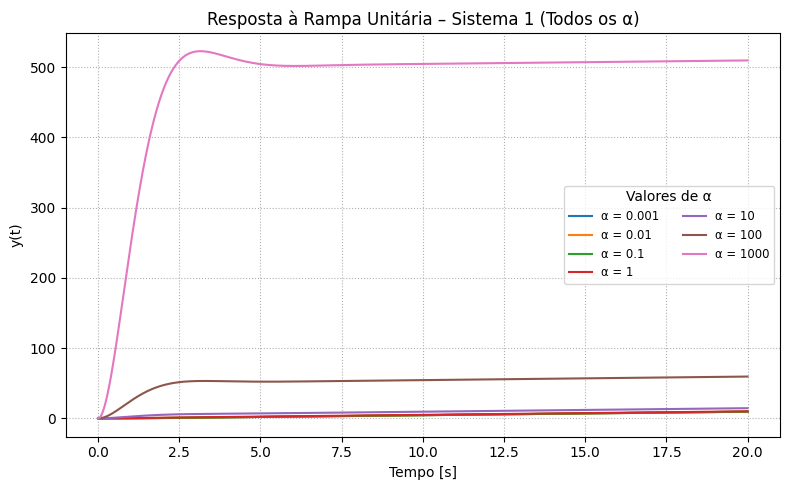

In [ ]:
# Valores de α
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]

# Denominador fixo (s² + 2s + 2)
den = [1, 2, 2]

# Vetor de tempo
t = np.linspace(0, 20, 2000)          # 0–20 s
u = t                                 # rampa unitária

plt.figure(figsize=(8, 5))

for alpha in alphas:
    sys = signal.TransferFunction([alpha, 1], den)   # H(s) = (αs + 1)/(s²+2s+2)
    tout, y_out, _ = signal.lsim(sys, U=u, T=t)      # resposta à rampa
    plt.plot(tout, y_out, label=f'α = {alpha}')

plt.title('Resposta à Rampa Unitária – Sistema 1 (Todos os α)')
plt.xlabel('Tempo [s]')
plt.ylabel('y(t)')
plt.grid(True, ls=':')
plt.legend(title='Valores de α', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()

#### Letra F - Resposta à uma Onda Quadrada de Frequência ω

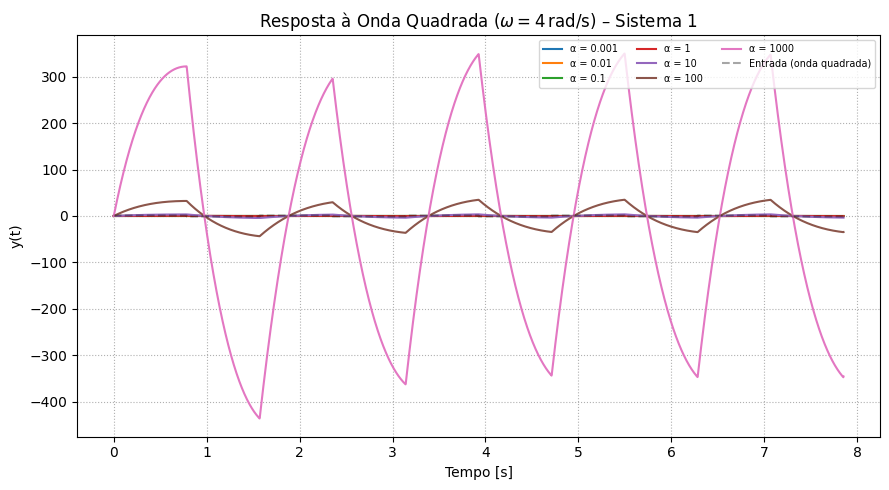

In [ ]:
# ----------------- parâmetros -----------------
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]   # valores de α
den = [1, 2, 2]                                 # denominador fixo
omega = 4                                       # frequência angular (rad/s)

# grade de tempo: simular 5 períodos da onda quadrada
T0 = 2*np.pi / omega
t = np.linspace(0, 5*T0, 4000)
u = signal.square(omega * t)                    # onda quadrada ±1

# ----------------- simulação ------------------
plt.figure(figsize=(9, 5))

for alpha in alphas:
    sys = signal.TransferFunction([alpha, 1], den)      # H(s) = (αs + 1)/(s²+2s+2)
    t_out, y_out, _ = signal.lsim(sys, U=u, T=t)        # resposta temporal
    plt.plot(t_out, y_out, label=f'α = {alpha}')

# onda quadrada de referência (tracejado)
plt.plot(t, u, 'k--', alpha=0.35, label='Entrada (onda quadrada)')

# ----------------- ajustes do gráfico ---------
plt.title(r'Resposta à Onda Quadrada ($\omega = 4\,$rad/s) – Sistema 1')
plt.xlabel('Tempo [s]')
plt.ylabel('y(t)')
plt.grid(True, ls=':')
plt.legend(fontsize='x-small', ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

#### Letra G - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

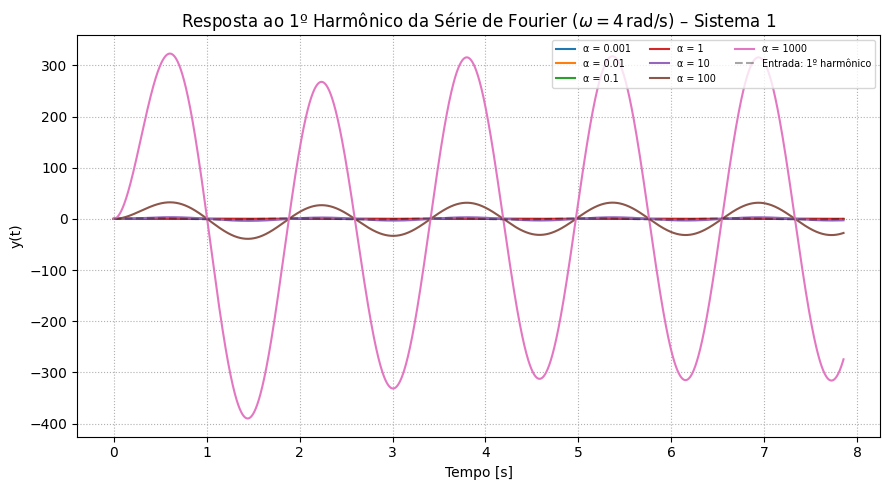

In [ ]:
# ----- parâmetros -----
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
den    = [1, 2, 2]                 # s² + 2s + 2
omega  = 4                         # rad/s  (frequência do 1º harmônico)
amp    = 4 / np.pi                 # amplitude do 1º harmônico da onda quadrada

# grade de tempo (5 períodos da senóide)
T0 = 2 * np.pi / omega
t  = np.linspace(0, 5*T0, 4000)
u  = amp * np.sin(omega * t)       # entrada: 1º harmônico

# ----- simulação -----
plt.figure(figsize=(9, 5))
for alpha in alphas:
    sys = signal.TransferFunction([alpha, 1], den)
    tout, y_out, _ = signal.lsim(sys, U=u, T=t)
    plt.plot(tout, y_out, label=f'α = {alpha}')

# entrada tracejada para referência
plt.plot(t, u, 'k--', alpha=0.35, label='Entrada: 1º harmônico')

# ----- gráfico -----
plt.title(r'Resposta ao 1º Harmônico da Série de Fourier ($\omega = 4\,\mathrm{rad/s}$) – Sistema 1')
plt.xlabel('Tempo [s]')
plt.ylabel('y(t)')
plt.grid(True, ls=':')
plt.legend(fontsize='x-small', ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

#### Letra H - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

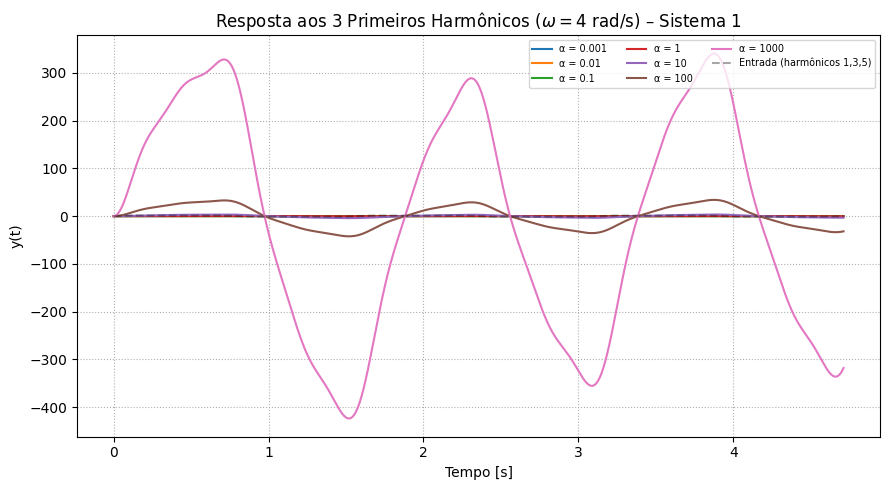

In [ ]:
# ----- parâmetros -----
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]     # valores de α
den    = [1, 2, 2]                                 # s² + 2s + 2
omega  = 4                                         # rad/s (fundamental)

# ----- entrada: 3 primeiros harmônicos (n = 1, 3, 5) -----
T0  = 2 * np.pi / omega
t   = np.linspace(0, 3 * T0, 4000)                 # 3 períodos
u   = (4 / np.pi) * (np.sin(omega * t) +
                     np.sin(3 * omega * t) / 3 +
                     np.sin(5 * omega * t) / 5)

# ----- simulação -----
plt.figure(figsize=(9, 5))
for alpha in alphas:
    sys = signal.TransferFunction([alpha, 1], den)
    tout, y_out, _ = signal.lsim(sys, U=u, T=t)
    plt.plot(tout, y_out, label=f'α = {alpha}')

# entrada (tracejado)
plt.plot(t, u, 'k--', alpha=0.35, label='Entrada (harmônicos 1,3,5)')

# ----- gráfico -----
plt.title(r'Resposta aos 3 Primeiros Harmônicos ($\omega = 4$ rad/s) – Sistema 1')
plt.xlabel('Tempo [s]')
plt.ylabel('y(t)')
plt.grid(True, ls=':')
plt.legend(fontsize='x-small', ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

#### Letra I - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

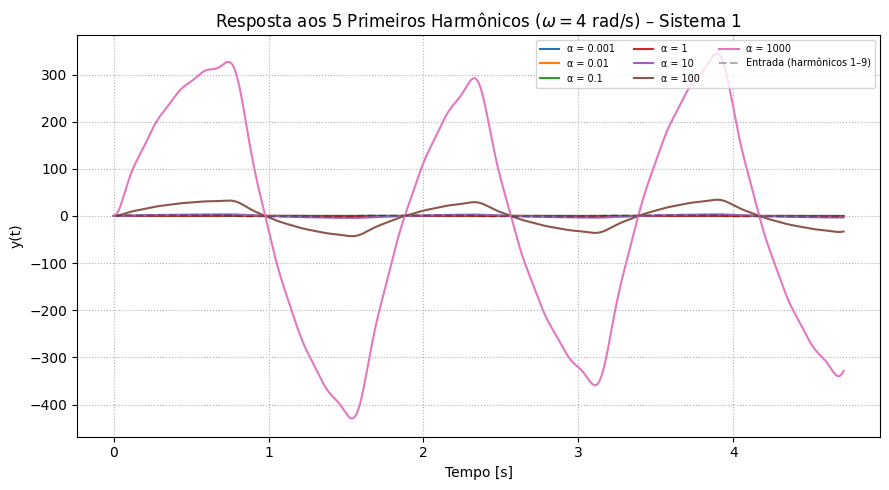

In [ ]:
# ------------------------- parâmetros -------------------------
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]   # valores de α
den    = [1, 2, 2]                               # s² + 2s + 2
omega  = 4                                       # rad/s (fundamental)

# -------- entrada: 5 primeiros harmônicos ímpares -------------
n_list = [1, 3, 5, 7, 9]                         # n ímpares até 9
T0   = 2 * np.pi / omega                         # período fundamental
t    = np.linspace(0, 3 * T0, 5000)              # três períodos
u    = (4 / np.pi) * sum(np.sin(n * omega * t) / n for n in n_list)

# --------------------- simulação ------------------------------
plt.figure(figsize=(9, 5))

for alpha in alphas:
    sys = signal.TransferFunction([alpha, 1], den)     # H(s) = (αs + 1)/(s²+2s+2)
    tout, y_out, _ = signal.lsim(sys, U=u, T=t)        # resposta temporal
    plt.plot(tout, y_out, label=f'α = {alpha}')

# entrada tracejada para referência
plt.plot(t, u, 'k--', alpha=0.3, label='Entrada (harmônicos 1–9)')

# --------------------- gráfico final --------------------------
plt.title(r'Resposta aos 5 Primeiros Harmônicos ($\omega = 4$ rad/s) – Sistema 1')
plt.xlabel('Tempo [s]')
plt.ylabel('y(t)')
plt.grid(True, ls=':')
plt.legend(fontsize='x-small', ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

#### Letra J - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

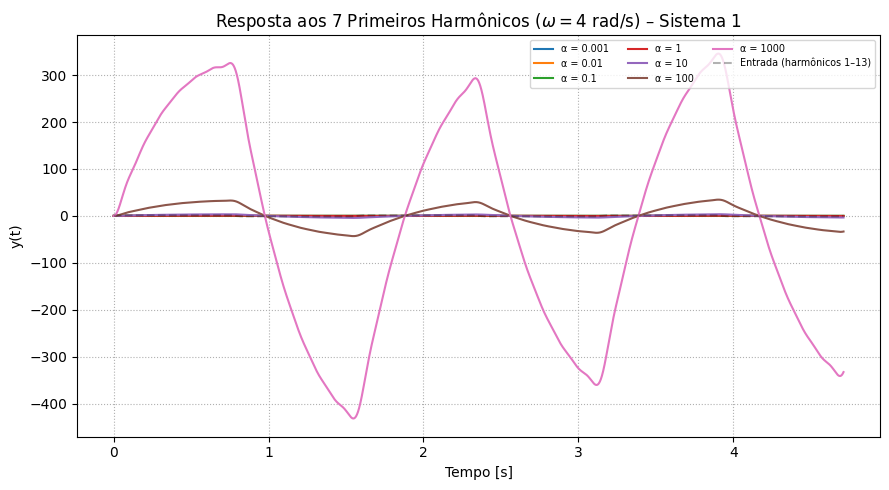

In [ ]:
# -------------------- parâmetros --------------------
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]   # valores de α
den    = [1, 2, 2]                               # s² + 2s + 2
omega  = 4                                       # rad/s (fundamental)

# -------- entrada: 7 harmônicos ímpares -----------
odd_ns = [1, 3, 5, 7, 9, 11, 13]
T0  = 2 * np.pi / omega
t   = np.linspace(0, 3 * T0, 6000)               # 3 períodos
u   = (4 / np.pi) * sum(np.sin(n * omega * t) / n for n in odd_ns)

# ------------------ simulação ----------------------
plt.figure(figsize=(9, 5))
for alpha in alphas:
    sys = signal.TransferFunction([alpha, 1], den)   # H(s) = (αs+1)/(s²+2s+2)
    tout, y_out, _ = signal.lsim(sys, U=u, T=t)      # resposta temporal
    plt.plot(tout, y_out, label=f'α = {alpha}')

# entrada tracejada para referência
plt.plot(t, u, 'k--', alpha=0.3, label='Entrada (harmônicos 1–13)')

# ------------------ gráfico ------------------------
plt.title(r'Resposta aos 7 Primeiros Harmônicos ($\omega = 4$ rad/s) – Sistema 1')
plt.xlabel('Tempo [s]')
plt.ylabel('y(t)')
plt.grid(True, ls=':')
plt.legend(fontsize='x-small', ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

#### Letra K - Resposta a uma Dente de Serra de Frequência ω

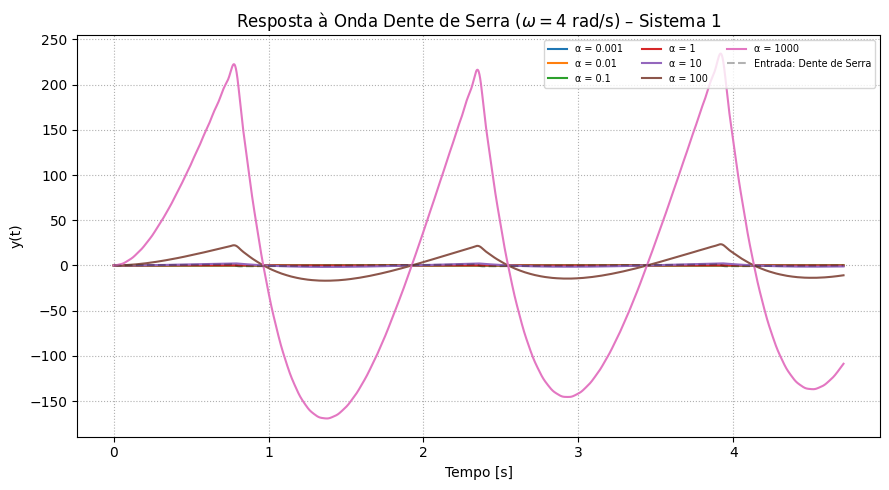

In [ ]:
# Parâmetros
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
den = [1, 2, 2]  # Denominador fixo do sistema: s² + 2s + 2
omega = 4        # Frequência angular da onda (rad/s)
T0 = 2 * np.pi / omega
t = np.linspace(0, 3 * T0, 6000)

# Série de Fourier da onda dente de serra (N harmônicos)
N = 25
x = sum(((-1)**(n+1)) * np.sin(n * omega * t) / n for n in range(1, N+1))
x *= (2 / np.pi)  # Normalização da amplitude

# Simulação
plt.figure(figsize=(9, 5))
for alpha in alphas:
    num = [alpha, 1]
    sys = signal.TransferFunction(num, den)
    _, y_out, _ = signal.lsim(sys, U=x, T=t)
    plt.plot(t, y_out, label=f'α = {alpha}')

# Entrada tracejada
plt.plot(t, x, 'k--', alpha=0.3, label='Entrada: Dente de Serra')

# Gráfico
plt.title(r'Resposta à Onda Dente de Serra ($\omega=4$ rad/s) – Sistema 1')
plt.xlabel('Tempo [s]')
plt.ylabel('y(t)')
plt.grid(True, ls=':')
plt.legend(fontsize='x-small', ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

#### Letra L - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

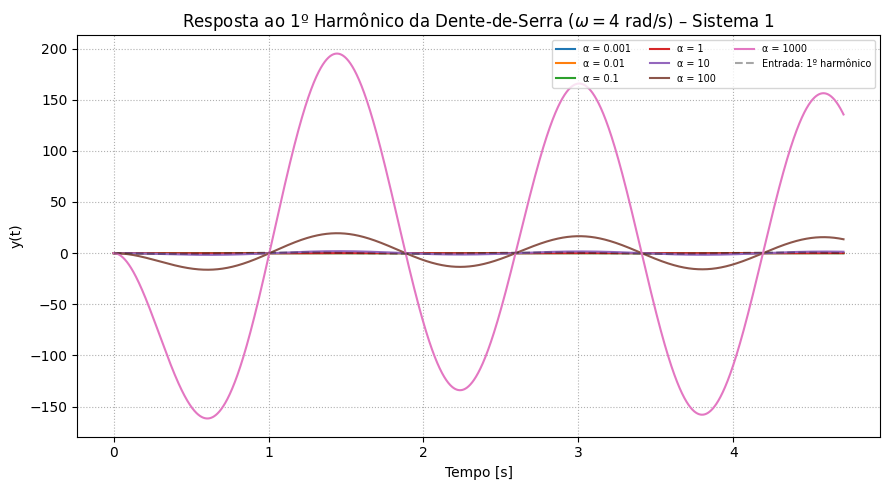

In [ ]:
# ----------------------- parâmetros -----------------------
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]  # valores de α
den    = [1, 2, 2]                              # s² + 2s + 2
omega  = 4                                      # rad/s (fundamental)

# 1º harmônico da dente-de-serra: x(t) = −2/π · sin(ωt)
T0  = 2*np.pi / omega
t   = np.linspace(0, 3*T0, 4000)
u   = -(2/np.pi) * np.sin(omega * t)

# ------------------- simulação ----------------------------
plt.figure(figsize=(9, 5))

for alpha in alphas:
    sys = signal.TransferFunction([alpha, 1], den)    # H(s) = (αs+1)/(s²+2s+2)
    tout, y_out, _ = signal.lsim(sys, U=u, T=t)       # resposta temporal
    plt.plot(tout, y_out, label=f'α = {alpha}')

# entrada tracejada
plt.plot(t, u, 'k--', alpha=0.35, label='Entrada: 1º harmônico')

# ------------------- gráfico ------------------------------
plt.title(r'Resposta ao 1º Harmônico da Dente-de-Serra ($\omega = 4$ rad/s) – Sistema 1')
plt.xlabel('Tempo [s]')
plt.ylabel('y(t)')
plt.grid(True, ls=':')
plt.legend(fontsize='x-small', ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

#### Letra M - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

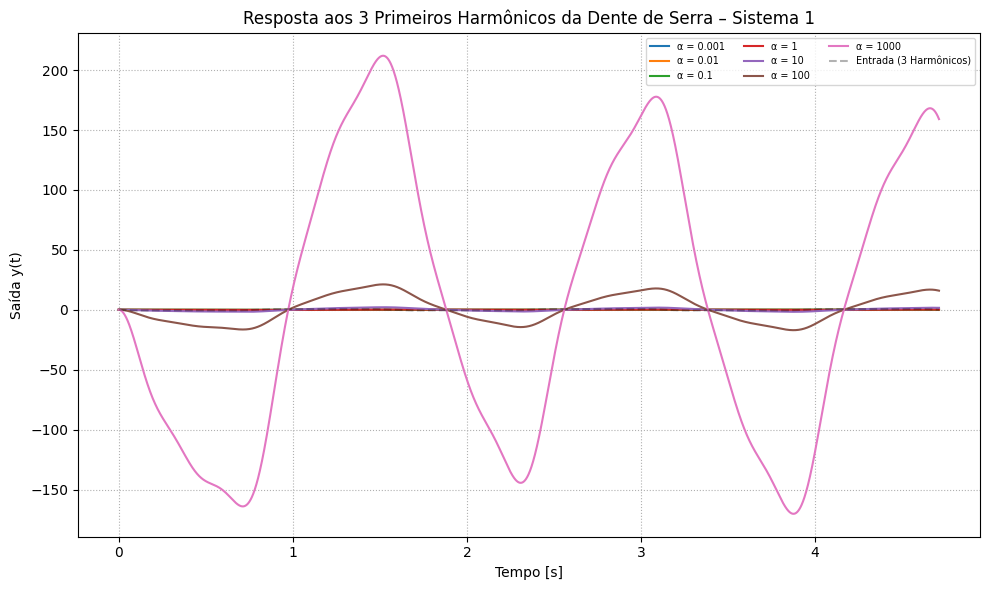

In [ ]:
# Parâmetros
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
omega = 4  # rad/s
t = np.linspace(0, 3 * 2 * np.pi / omega, 4000)

# Gerar os 3 primeiros harmônicos da dente de serra (n ímpar)
u = np.zeros_like(t)
for n in range(1, 6, 2):  # n = 1, 3, 5
    u += -(2 / (np.pi * n)) * np.sin(n * omega * t)

# Denominador comum
den = [1, 2, 2]

# Plotagem
plt.figure(figsize=(10, 6))
for alpha in alphas:
    num = [alpha, 1]
    system = signal.TransferFunction(num, den)
    tout, y, _ = signal.lsim(system, U=u, T=t)
    plt.plot(tout, y, label=f'α = {alpha}')

plt.plot(t, u, 'k--', alpha=0.3, label='Entrada (3 Harmônicos)')
plt.title('Resposta aos 3 Primeiros Harmônicos da Dente de Serra – Sistema 1')
plt.xlabel('Tempo [s]')
plt.ylabel('Saída y(t)')
plt.grid(True, linestyle=':')
plt.legend(fontsize='x-small', ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

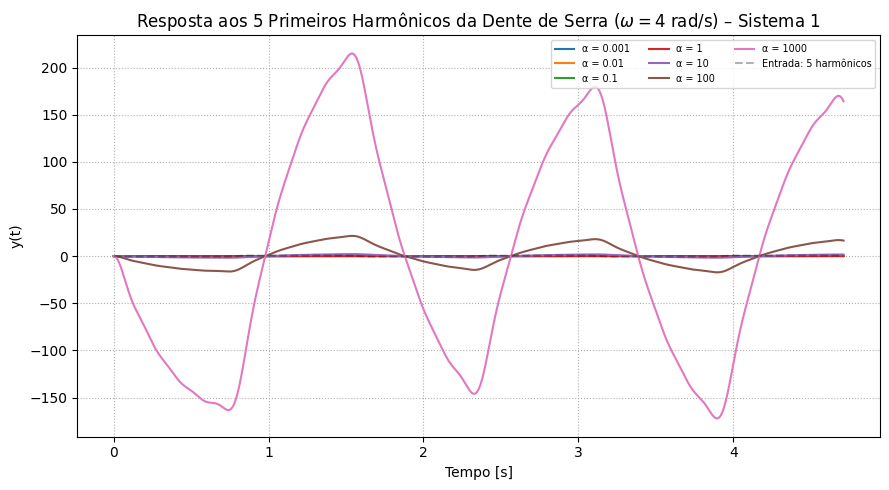

In [ ]:
# ----------------- parâmetros -----------------
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]   # valores corretos de α
den    = [1, 2, 2]                               # s² + 2s + 2  (pólos fixos)
omega  = 4                                       # rad/s (frequência fundamental)

# -------- entrada: 5 primeiros harmônicos ímpares da dente de serra --------
odd_ns = [1, 3, 5, 7, 9]                         # 5 termos ímpares
T0   = 2 * np.pi / omega                         # período fundamental
t    = np.linspace(0, 3 * T0, 6000)              # três períodos

# série de Fourier (sinal dente de serra)
u = np.zeros_like(t)
for n in odd_ns:
    u += -(2 / (np.pi * n)) * np.sin(n * omega * t)

# ----------------- simulação ------------------
plt.figure(figsize=(9, 5))
for alpha in alphas:
    sys = signal.TransferFunction([alpha, 1], den)   # H(s) = (αs + 1)/(s² + 2s + 2)
    tout, y_out, _ = signal.lsim(sys, U=u, T=t)      # resposta temporal
    plt.plot(tout, y_out, label=f'α = {alpha}')

# entrada tracejada
plt.plot(t, u, 'k--', alpha=0.3, label='Entrada: 5 harmônicos')

# ----------------- gráfico --------------------
plt.title(r'Resposta aos 5 Primeiros Harmônicos da Dente de Serra ($\omega=4$ rad/s) – Sistema 1')
plt.xlabel('Tempo [s]')
plt.ylabel('y(t)')
plt.grid(True, ls=':')
plt.legend(fontsize='x-small', ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω


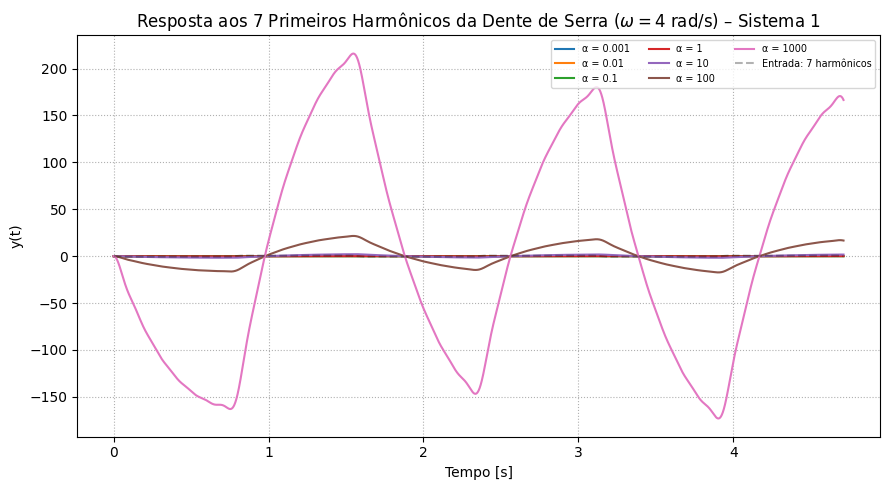

In [ ]:
# ------------------------ parâmetros ------------------------
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]   # valores de α
den    = [1, 2, 2]                               # denominador s²+2s+2
omega  = 4                                       # rad/s (fundamental)

# ---------- entrada: 7 harmônicos ímpares (1 a 13) ----------
odd_ns = [1, 3, 5, 7, 9, 11, 13]                 # sete termos
T0 = 2 * np.pi / omega
t  = np.linspace(0, 3 * T0, 7000)                # três períodos

# série de Fourier da dente-de-serra (amplitude normalizada ±1)
u = np.zeros_like(t)
for n in odd_ns:
    u += -(2 / (np.pi * n)) * np.sin(n * omega * t)

# --------------------- simulação ----------------------------
plt.figure(figsize=(9, 5))
for alpha in alphas:
    sys = signal.TransferFunction([alpha, 1], den)    # H(s) = (αs+1)/(s²+2s+2)
    tout, y_out, _ = signal.lsim(sys, U=u, T=t)       # resposta temporal
    plt.plot(tout, y_out, label=f'α = {alpha}')

# entrada tracejada para referência
plt.plot(t, u, 'k--', alpha=0.3, label='Entrada: 7 harmônicos')

# ---------------- configuração do gráfico ------------------
plt.title(r'Resposta aos 7 Primeiros Harmônicos da Dente de Serra ($\omega=4$ rad/s) – Sistema 1')
plt.xlabel('Tempo [s]')
plt.ylabel('y(t)')
plt.grid(True, ls=':')
plt.legend(fontsize='x-small', ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

### Sistema 2

Sistema descrito por $H(s) = \frac{s + 10^4}{s^2 + 2\beta s + 100}$, para $\beta = \{0.001, 0.01, 0.1, 1, 10\}$.

#### Letra B - Diagrama de Pólos e Zeros

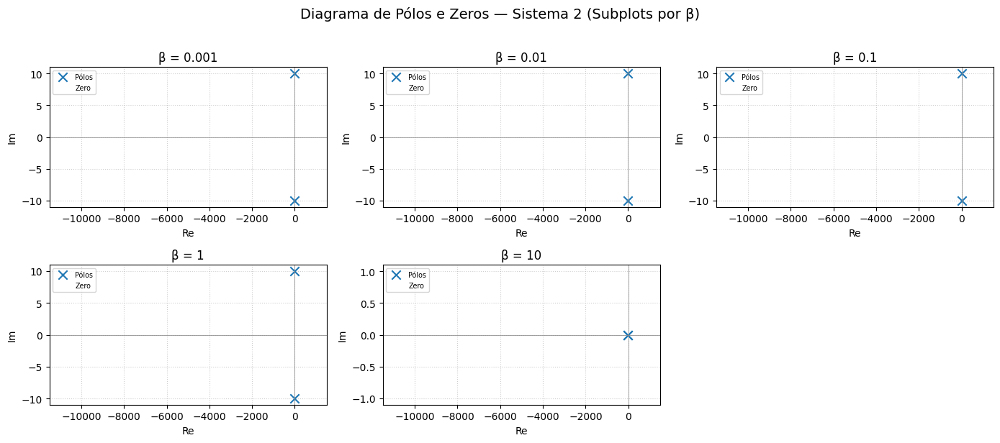

In [ ]:
# Valores de β
betas = [0.001, 0.01, 0.1, 1, 10]

# Numerador fixo  (zero em s = -10⁴)
num = [1, 1e4]

# Cria figura com subplots (2 × 3 → 6 locais; 1 ficará vazio)
fig, axes = plt.subplots(2, 3, figsize=(14, 6))
axes = axes.flatten()

for ax, beta in zip(axes, betas):
    # Denominador dependente de β → s² + 2βs + 100
    den = [1, 2*beta, 100]

    # Cálculo de pólos e zeros
    poles = np.roots(den)          # pólos variam com β
    zeros = np.roots(num)          # zero fixo em -10⁴

    # Plotagem
    ax.scatter(np.real(poles), np.imag(poles),
               s=80, marker='x', label='Pólos')
    ax.scatter(np.real(zeros), np.imag(zeros),
               s=80, marker='o', facecolors='none', label='Zero')

    # Eixos de referência
    ax.axhline(0, color='grey', lw=0.5)
    ax.axvline(0, color='grey', lw=0.5)

    # Ajuste automático dos limites (com margem)
    x_vals = np.concatenate((np.real(poles), np.real(zeros)))
    x_min, x_max = x_vals.min(), x_vals.max()
    margin = 0.15 * (x_max - x_min if x_max > x_min else 1)
    ax.set_xlim(x_min - margin, x_max + margin)

    # Altura suficiente para caber a parte imaginária
    y_max = max(abs(np.imag(poles)).max(), 1)
    ax.set_ylim(-1.1*y_max, 1.1*y_max)

    # Rótulos, grade, legenda
    ax.set_title(f'β = {beta}')
    ax.set_xlabel('Re')
    ax.set_ylabel('Im')
    ax.grid(True, ls=':', alpha=0.6)
    ax.legend(fontsize='x-small')

# Desativa painel excedente (o 6.º)
for ax in axes[len(betas):]:
    ax.axis('off')

fig.suptitle('Diagrama de Pólos e Zeros — Sistema 2 (Subplots por β)',
             y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

####Letra C - Diagrama de Bode

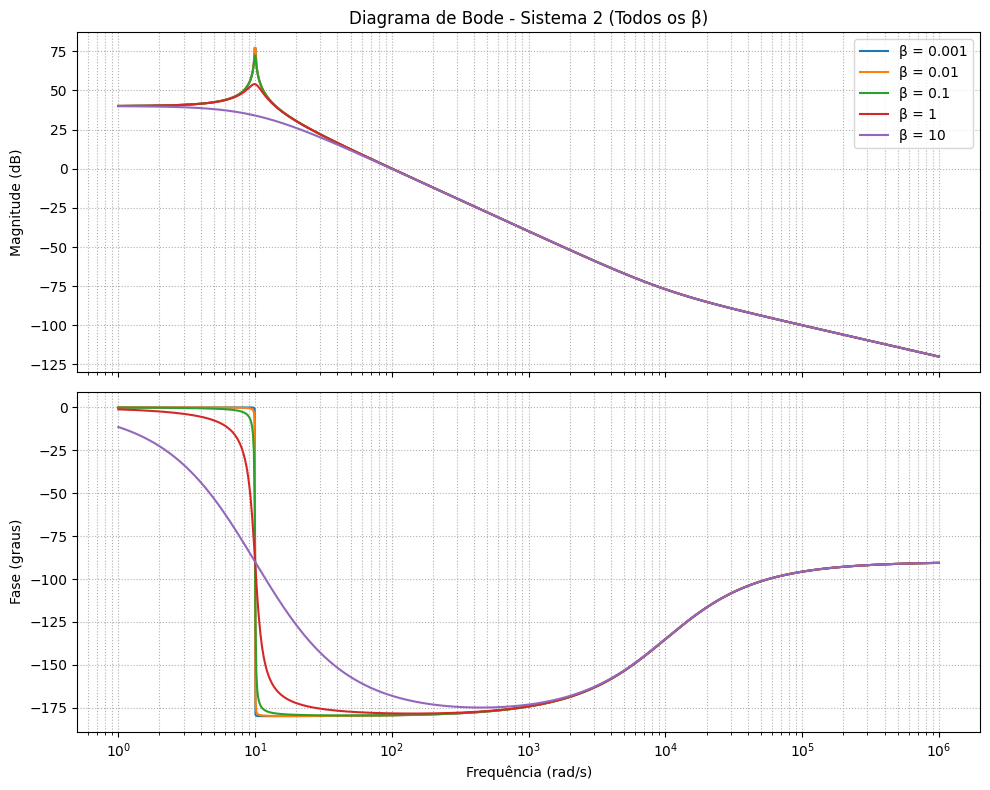

In [ ]:
# --- parâmetros -------------------------------------------------------------
betas = [0.001, 0.01, 0.1, 1, 10]        # valores de β
w      = np.logspace(0, 6, 1000)         # 10^0 a 10^6 rad/s
num    = [1, 1e4]                        # numerador fixo  (s + 10⁴)

# --- figura com dois subplots empilhados -----------------------------------
fig, (ax_mag, ax_phase) = plt.subplots(2, 1, sharex=True, figsize=(10, 8))

for beta in betas:
    den = [1, 2*beta, 100]               # denominador dependente de β
    sys = signal.TransferFunction(num, den)

    w, mag, phase = signal.bode(sys, w=w)

    ax_mag.semilogx(w, mag,   label=f'β = {beta}')
    ax_phase.semilogx(w, phase, label=f'β = {beta}')

# --- ajustes de apresentação -----------------------------------------------
ax_mag.set_title('Diagrama de Bode - Sistema 2 (Todos os β)')
ax_mag.set_ylabel('Magnitude (dB)')
ax_mag.grid(True, which='both', linestyle=':')

ax_phase.set_xlabel('Frequência (rad/s)')
ax_phase.set_ylabel('Fase (graus)')
ax_phase.grid(True, which='both', linestyle=':')

ax_mag.legend()
plt.tight_layout()
plt.show()

#### Letra D - Resposta ao Degrau Unitário

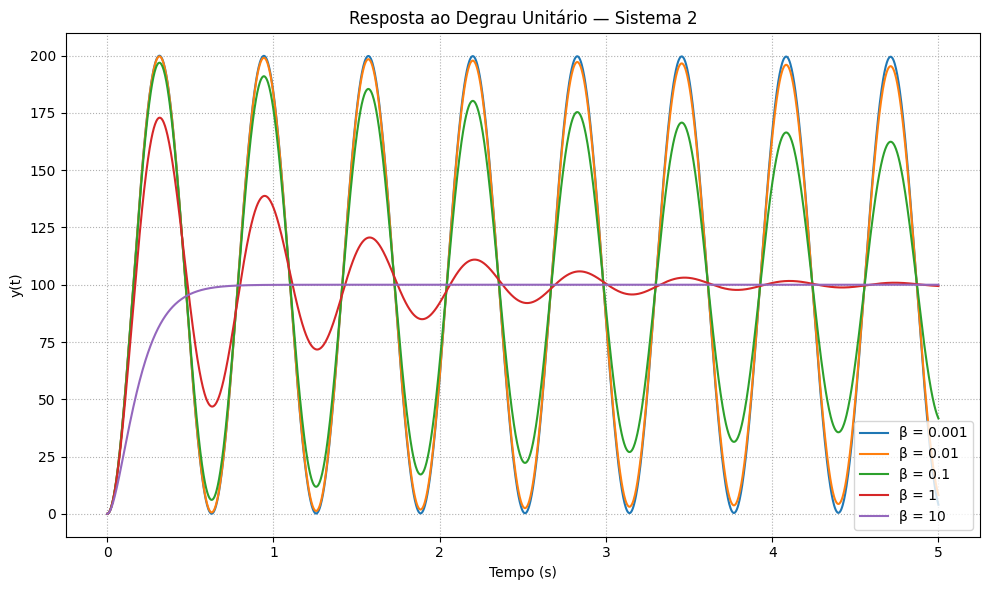

In [ ]:
# --- parâmetros -------------------------------------------------------------
betas = [0.001, 0.01, 0.1, 1, 10]
t     = np.linspace(0, 5, 2000)           # 0–5 s

plt.figure(figsize=(10, 6))
for beta in betas:
    num, den = [1, 1e4], [1, 2*beta, 100]
    sys      = signal.TransferFunction(num, den)
    tout, y  = signal.step(sys, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

plt.title('Resposta ao Degrau Unitário — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra E - Resposta à Rampa Unitária

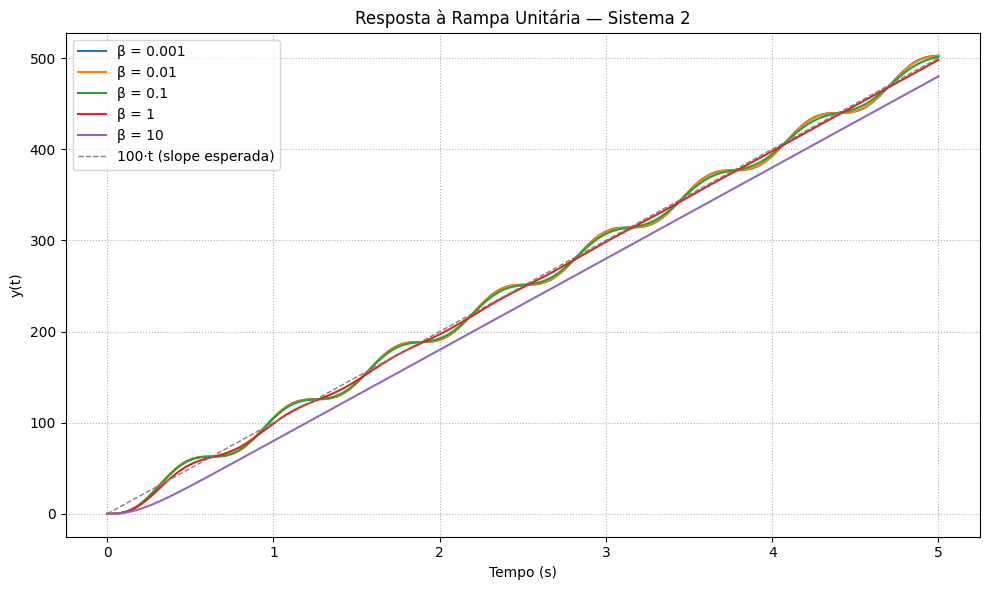

In [ ]:
# Valores de β
betas = [0.001, 0.01, 0.1, 1, 10]

# Tempo de simulação (0–5 s)
t = np.linspace(0, 5, 2000)
u = t                                   # rampa unitária

plt.figure(figsize=(10, 6))
for beta in betas:
    num, den = [1, 1e4], [1, 2*beta, 100]
    sys      = signal.TransferFunction(num, den)
    tout, y, _ = signal.lsim(sys, U=u, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Reta 100·t (ganho DC) para referência
plt.plot(t, 100*t, '--', color='grey', lw=1, label='100·t (slope esperada)')

plt.title('Resposta à Rampa Unitária — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra F - Resposta à uma Onda Quadrada de Frequência ω

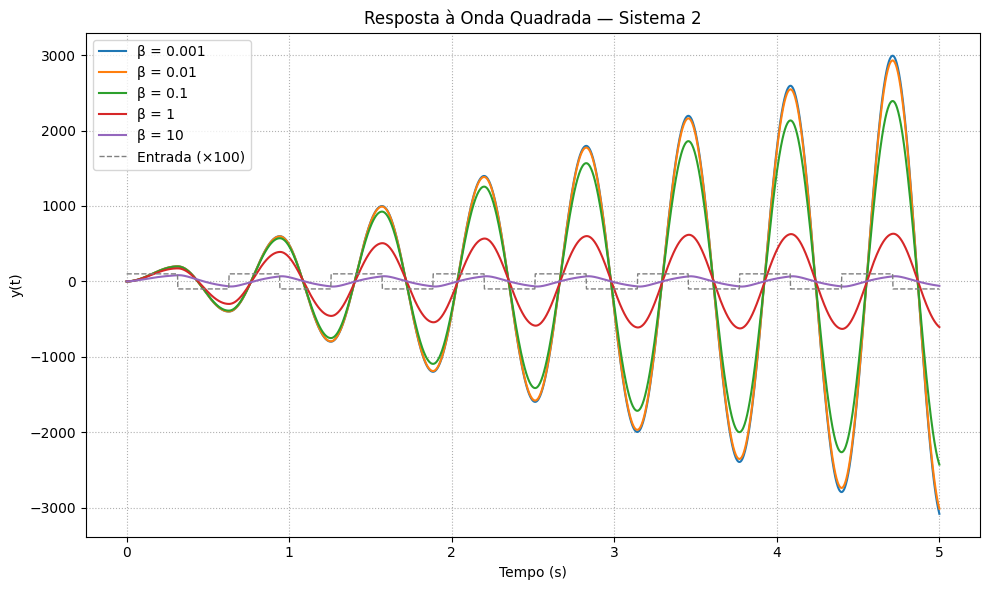

In [ ]:
# Frequência da onda quadrada (rad/s)
omega = 10  # próximo da frequência natural do sistema

# Tempo
t = np.linspace(0, 5, 2000)
square_wave = signal.square(omega * t)

# Lista de βs
betas = [0.001, 0.01, 0.1, 1, 10]

plt.figure(figsize=(10, 6))
for beta in betas:
    num = [1, 1e4]
    den = [1, 2*beta, 100]
    sys = signal.TransferFunction(num, den)
    tout, y, _ = signal.lsim(sys, U=square_wave, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Entrada escalada para comparação
plt.plot(t, 100 * square_wave, '--', color='grey', lw=1, label='Entrada (×100)')

plt.title('Resposta à Onda Quadrada — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra G - Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω

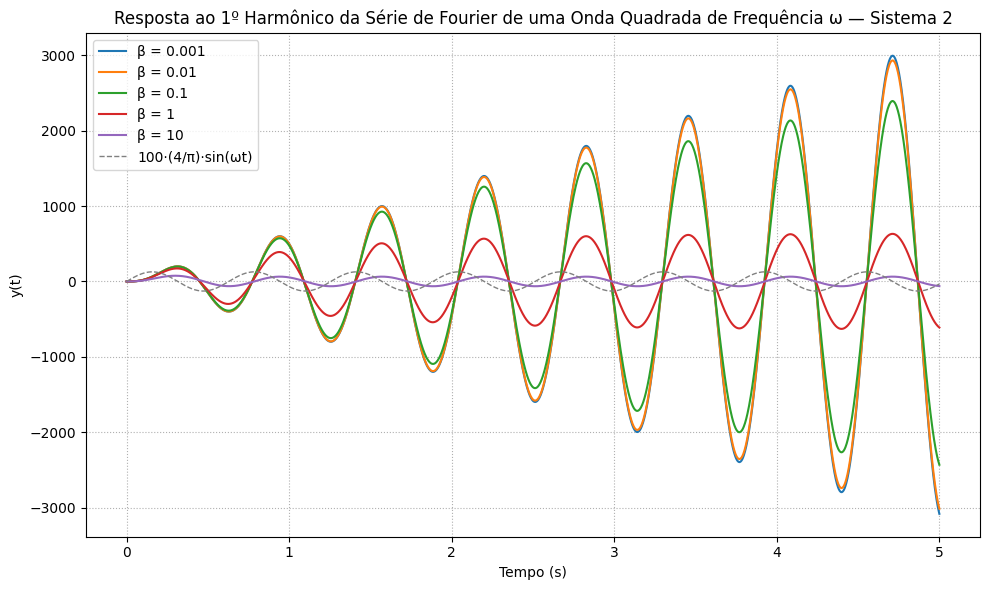

In [ ]:
# Frequência fundamental ω (rad/s)
omega = 10

# Primeiro harmônico da onda quadrada
A1 = 4 / np.pi
t = np.linspace(0, 5, 2000)
first_harmonic = A1 * np.sin(omega * t)

# Valores de β
betas = [0.001, 0.01, 0.1, 1, 10]

plt.figure(figsize=(10, 6))
for beta in betas:
    num = [1, 1e4]
    den = [1, 2 * beta, 100]
    sys = signal.TransferFunction(num, den)
    tout, y, _ = signal.lsim(sys, U=first_harmonic, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Entrada de referência escalada
plt.plot(t, 100 * first_harmonic, '--', color='grey', lw=1, label='100·(4/π)·sin(ωt)')

plt.title('Resposta ao 1º Harmônico da Série de Fourier de uma Onda Quadrada de Frequência ω — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra H - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

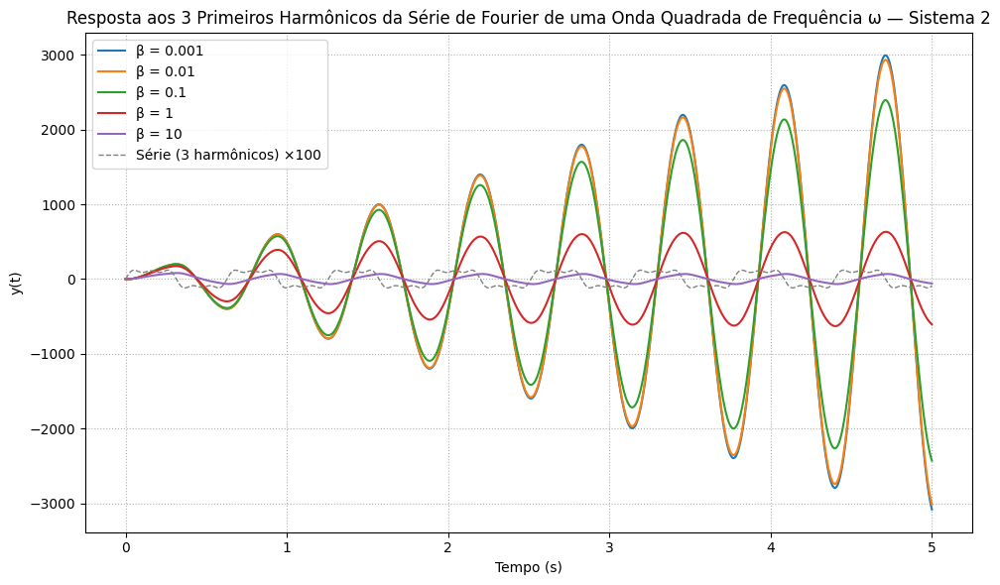

In [ ]:
# Frequência fundamental
omega = 10
t = np.linspace(0, 5, 2000)

# Construção da série com os 3 primeiros harmônicos ímpares
harmonics = [1, 3, 5]
fourier_sum = np.zeros_like(t)
for n in harmonics:
    A_n = 4 / (np.pi * n)
    fourier_sum += A_n * np.sin(n * omega * t)

# Parâmetros β
betas = [0.001, 0.01, 0.1, 1, 10]

plt.figure(figsize=(10, 6))
for beta in betas:
    num = [1, 1e4]
    den = [1, 2 * beta, 100]
    sys = signal.TransferFunction(num, den)
    tout, y, _ = signal.lsim(sys, U=fourier_sum, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Entrada (série) escalada para visualização
plt.plot(t, 100 * fourier_sum, '--', color='grey', lw=1, label='Série (3 harmônicos) ×100')

plt.title('Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra I - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

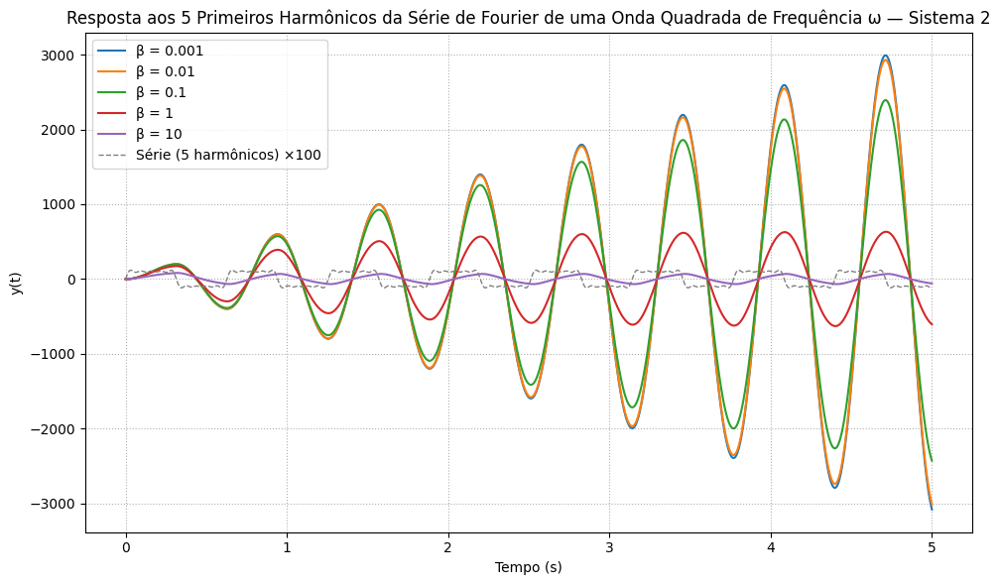

In [ ]:
# Frequência fundamental
omega = 10
t = np.linspace(0, 5, 2000)

# Harmônicos ímpares: n = 1, 3, 5, 7, 9
harmonics = [1, 3, 5, 7, 9]
fourier_sum = np.zeros_like(t)
for n in harmonics:
    A_n = 4 / (np.pi * n)
    fourier_sum += A_n * np.sin(n * omega * t)

# Valores de β
betas = [0.001, 0.01, 0.1, 1, 10]

plt.figure(figsize=(10, 6))
for beta in betas:
    num = [1, 1e4]
    den = [1, 2 * beta, 100]
    sys = signal.TransferFunction(num, den)
    tout, y, _ = signal.lsim(sys, U=fourier_sum, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Entrada (5 harmônicos) escalada
plt.plot(t, 100 * fourier_sum, '--', color='grey', lw=1, label='Série (5 harmônicos) ×100')

plt.title('Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra J - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω

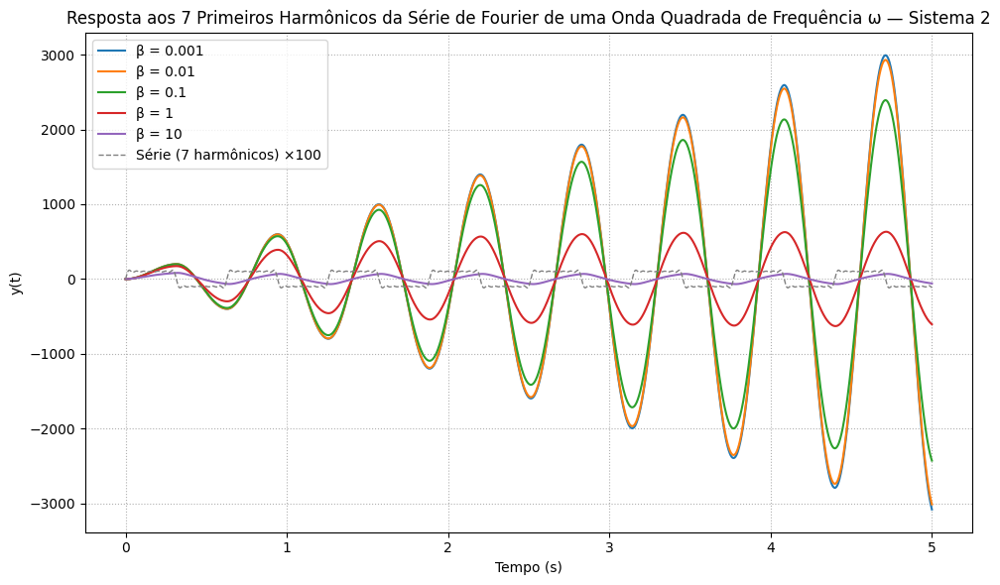

In [ ]:
# Frequência fundamental
omega = 10
t = np.linspace(0, 5, 2000)

# Harmônicos ímpares: 1, 3, 5, 7, 9, 11, 13
harmonics = [1, 3, 5, 7, 9, 11, 13]
fourier_sum = np.zeros_like(t)
for n in harmonics:
    A_n = 4 / (np.pi * n)
    fourier_sum += A_n * np.sin(n * omega * t)

# Valores de β
betas = [0.001, 0.01, 0.1, 1, 10]

plt.figure(figsize=(10, 6))
for beta in betas:
    num = [1, 1e4]
    den = [1, 2 * beta, 100]
    sys = signal.TransferFunction(num, den)
    tout, y, _ = signal.lsim(sys, U=fourier_sum, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Entrada escalada para referência
plt.plot(t, 100 * fourier_sum, '--', color='grey', lw=1, label='Série (7 harmônicos) ×100')

plt.title('Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Onda Quadrada de Frequência ω — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra K - Resposta a uma Dente de Serra de Frequência ω

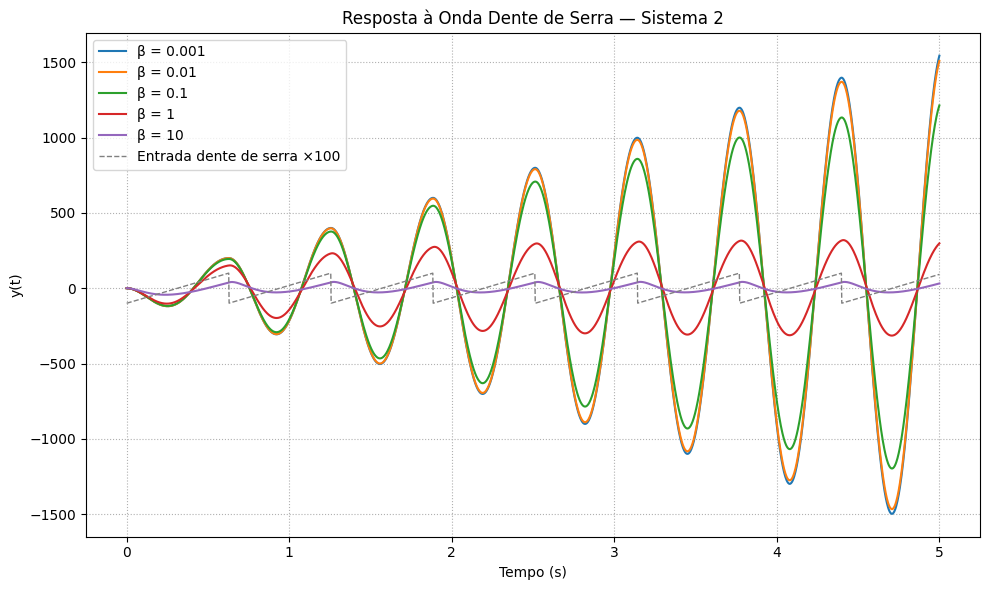

In [ ]:
# Frequência fundamental (rad/s) e equivalente em Hz
omega = 10
f = omega / (2 * np.pi)  # Hz

# Tempo
t = np.linspace(0, 5, 2000)
saw_input = signal.sawtooth(2 * np.pi * f * t)

# Valores de β
betas = [0.001, 0.01, 0.1, 1, 10]

plt.figure(figsize=(10, 6))
for beta in betas:
    num = [1, 1e4]
    den = [1, 2 * beta, 100]
    sys = signal.TransferFunction(num, den)
    tout, y, _ = signal.lsim(sys, U=saw_input, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Entrada escalada
plt.plot(t, 100 * saw_input, '--', color='grey', lw=1, label='Entrada dente de serra ×100')

plt.title('Resposta à Onda Dente de Serra — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra L - Resposta ao 1º Harmônico da Série de Fourier de uma Dente de Serra de Frequência ω

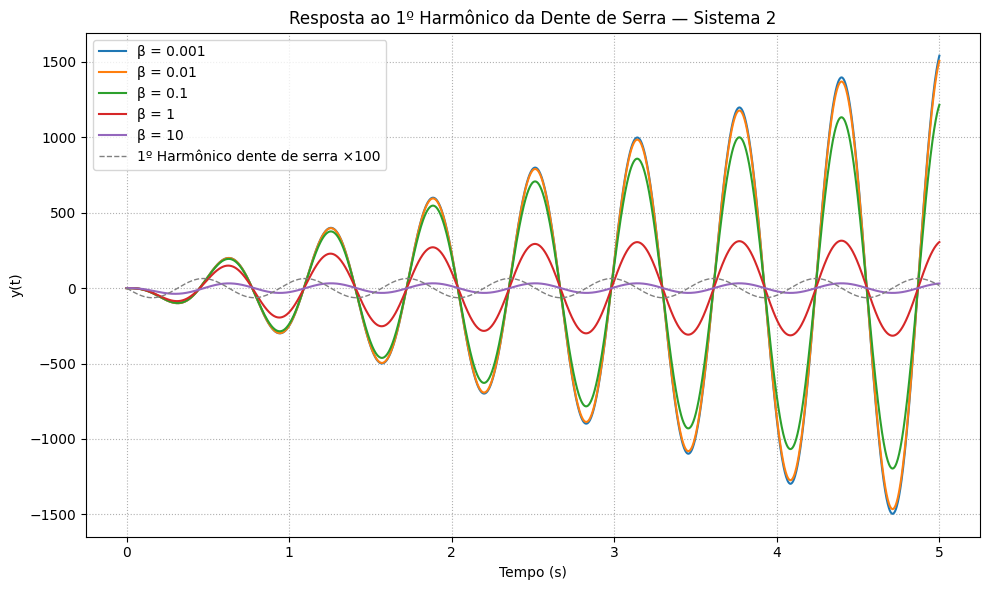

In [ ]:
# Frequência fundamental
omega = 10
t = np.linspace(0, 5, 2000)

# 1º harmônico da dente de serra: -2/π · sin(ωt)
saw_first_harmonic = (-2 / np.pi) * np.sin(omega * t)

# Valores de β
betas = [0.001, 0.01, 0.1, 1, 10]

plt.figure(figsize=(10, 6))
for beta in betas:
    num = [1, 1e4]
    den = [1, 2 * beta, 100]
    sys = signal.TransferFunction(num, den)
    tout, y, _ = signal.lsim(sys, U=saw_first_harmonic, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Entrada escalada por 100 para referência
plt.plot(t, 100 * saw_first_harmonic, '--', color='grey', lw=1, label='1º Harmônico dente de serra ×100')

plt.title('Resposta ao 1º Harmônico da Dente de Serra — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra M - Resposta aos 3 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

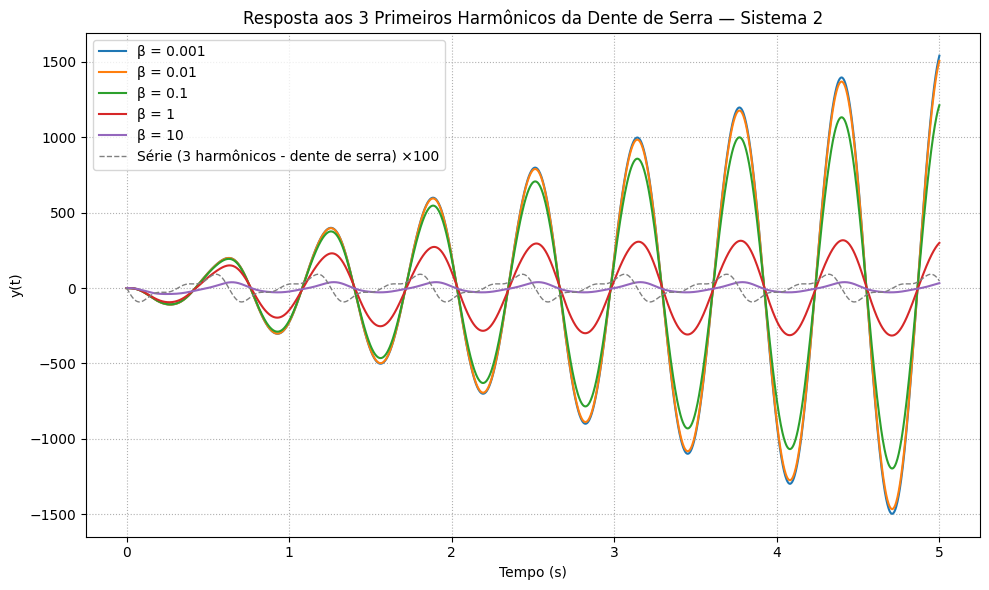

In [ ]:
# Frequência fundamental
omega = 10
t = np.linspace(0, 5, 2000)

# Série com 3 primeiros harmônicos da dente de serra
harmonics = [1, 2, 3]
saw_sum = np.zeros_like(t)
for n in harmonics:
    A_n = -2 / (np.pi * n)
    saw_sum += A_n * np.sin(n * omega * t)

# Valores de β
betas = [0.001, 0.01, 0.1, 1, 10]

plt.figure(figsize=(10, 6))
for beta in betas:
    num = [1, 1e4]
    den = [1, 2 * beta, 100]
    sys = signal.TransferFunction(num, den)
    tout, y, _ = signal.lsim(sys, U=saw_sum, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Entrada escalada por 100
plt.plot(t, 100 * saw_sum, '--', color='grey', lw=1, label='Série (3 harmônicos - dente de serra) ×100')

plt.title('Resposta aos 3 Primeiros Harmônicos da Dente de Serra — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra N - Resposta aos 5 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω

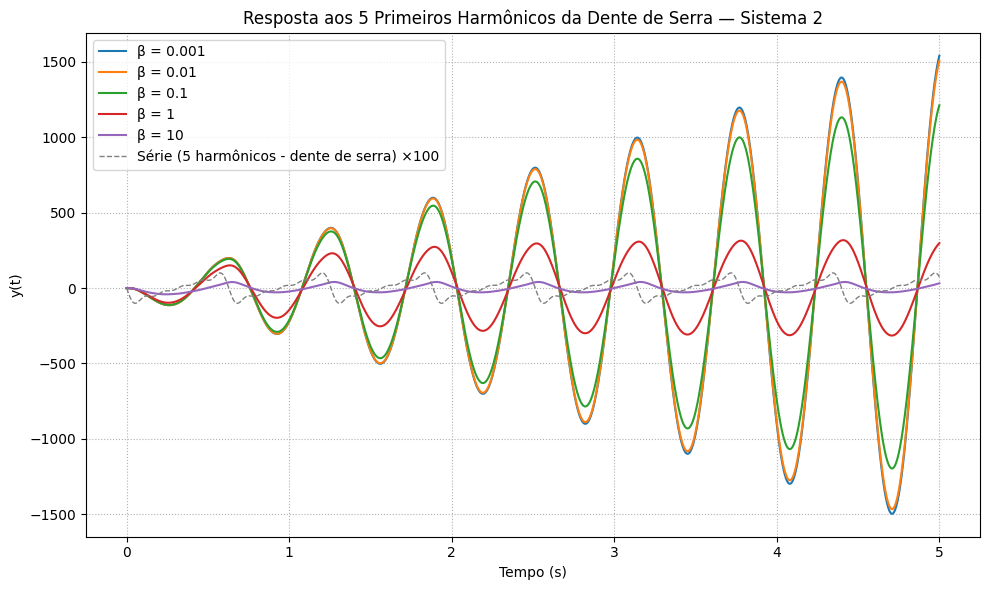

In [ ]:
# Frequência fundamental da dente de serra
omega = 10
t = np.linspace(0, 5, 2000)

# Construção da série com os 5 primeiros harmônicos
# Fórmula: x(t) = −2/π Σ (1/n)·sin(nωt)
harmonics = [1, 2, 3, 4, 5]
saw_sum = np.zeros_like(t)
for n in harmonics:
    A_n = -2 / (np.pi * n)
    saw_sum += A_n * np.sin(n * omega * t)

# Parâmetros β a serem testados
betas = [0.001, 0.01, 0.1, 1, 10]

plt.figure(figsize=(10, 6))

for beta in betas:
    # Função de transferência: (s + 10⁴)/(s² + 2βs + 100)
    num = [1, 1e4]
    den = [1, 2 * beta, 100]
    sys = signal.TransferFunction(num, den)

    # Resposta à entrada harmônica
    tout, y, _ = signal.lsim(sys, U=saw_sum, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Entrada (série dos 5 harmônicos) escalada ×100 para referência visual
plt.plot(t, 100 * saw_sum, '--', color='grey', lw=1,
         label='Série (5 harmônicos - dente de serra) ×100')

plt.title('Resposta aos 5 Primeiros Harmônicos da Dente de Serra — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()

#### Letra O - Resposta aos 7 Primeiros Harmônicos da Série de Fourier de uma Dente de Serra de Frequência ω


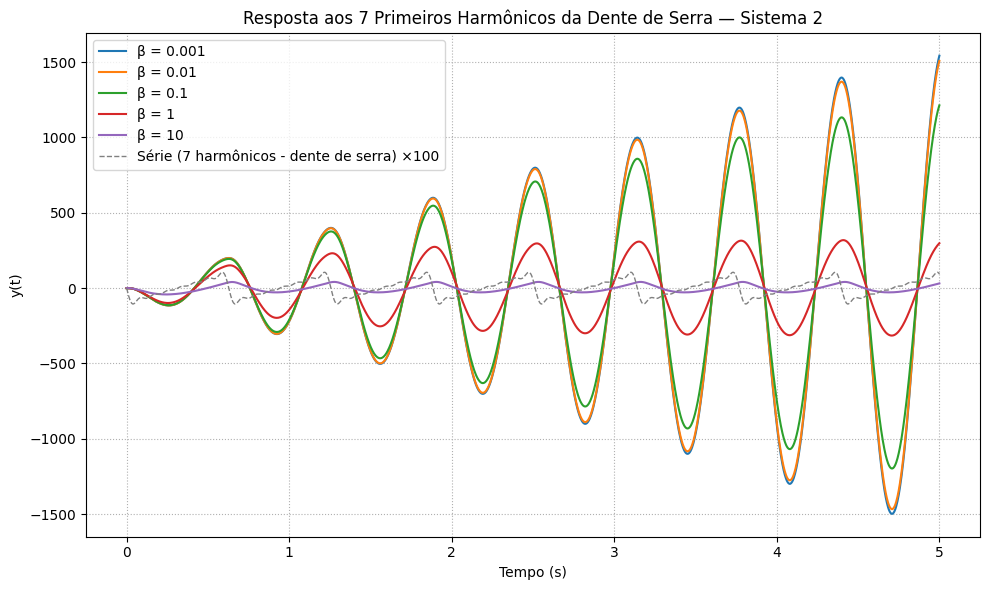

In [ ]:
# Frequência fundamental da dente de serra
omega = 10
t = np.linspace(0, 5, 2000)

# Soma dos 7 primeiros harmônicos (n = 1 a 7)
harmonics = [1, 2, 3, 4, 5, 6, 7]
saw_sum = np.zeros_like(t)
for n in harmonics:
    A_n = -2 / (np.pi * n)
    saw_sum += A_n * np.sin(n * omega * t)

# Lista de valores de β a testar
betas = [0.001, 0.01, 0.1, 1, 10]

# Criar gráfico
plt.figure(figsize=(10, 6))
for beta in betas:
    # Função de transferência: (s + 10⁴)/(s² + 2βs + 100)
    num = [1, 1e4]
    den = [1, 2 * beta, 100]
    sys = signal.TransferFunction(num, den)

    # Simulação da resposta
    tout, y, _ = signal.lsim(sys, U=saw_sum, T=t)
    plt.plot(tout, y, label=f'β = {beta}')

# Entrada escalada por 100 (para visualização no gráfico)
plt.plot(t, 100 * saw_sum, '--', color='grey', lw=1,
         label='Série (7 harmônicos - dente de serra) ×100')

# Estética do gráfico
plt.title('Resposta aos 7 Primeiros Harmônicos da Dente de Serra — Sistema 2')
plt.xlabel('Tempo (s)')
plt.ylabel('y(t)')
plt.grid(True, linestyle=':')
plt.legend()
plt.tight_layout()
plt.show()